## Final Project

**BU.510.615.81.SP24 Python for Data Analysis**

**Team 12**

Team Member:  
- Zhang, Beiming
- Sun, Shiming
- Wang, Anna
- Kang, Yuanyuan

**--------------------Data import, cleaning and preprocessing--------------------**

In [1]:
# import librbaries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta
from pandas.tseries.holiday import USFederalHolidayCalendar

This step is to import the data from the libraries.

In [2]:
# Read files
fuel_level_1 = pd.read_csv("Fuel_Level_Part_1.csv")
fuel_level_2 = pd.read_csv("Fuel_Level_Part_2.csv")
invoice = pd.read_csv("Invoices.csv")
location = pd.read_csv("Locations.csv")
tank = pd.read_csv("Tanks.csv")

In [3]:
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity
0,T 10,1,1,U,40000
1,T 11,1,2,U,40000
2,T 12,1,3,D,40000
3,T 13,1,4,P,40000
4,T 14,1,5,U,40000
5,T 15,1,6,D,40000
6,T 16,2,1,U,70000
7,T 17,2,2,D,40000
8,T 18,2,3,U,40000
9,T 19,2,4,D,70000


This step is to import the Canada consumer price index month-on-month data. (Source: Statistics Canada) 

In [4]:
canada_cpi = pd.read_csv("Canada CPI.csv")

Clean CPI data and modify the format

In [5]:
canada_cpi["Month"] = pd.to_datetime(canada_cpi["Month"]).dt.to_period("M")
canada_cpi.head()

,Month,month-on-month
0,2017-01,0.009
1,2017-02,0.002
2,2017-03,0.002
3,2017-04,0.004
4,2017-05,0.001


We used month-on-month cumulative inflation rate to fix the gas price, and started from January 2017. 

In [6]:
canada_cpi["Cumulative Inflation Rate"] = 1.0  # Initialization to 1

# Calculate the cumulative inflation factor
for i in range(1, len(canada_cpi)):
    # The current factor is (1 + month-on-month)）
    current_month_factor = 1 + canada_cpi.at[i, "month-on-month"]
    # Use the previous cumulative inflation factor
    previous_cumulative_inflation = canada_cpi.at[i - 1, "Cumulative Inflation Rate"]
    # Calculate the current cumulative inflation factor
    canada_cpi.at[i, "Cumulative Inflation Rate"] = (
        current_month_factor * previous_cumulative_inflation
    )

canada_cpi.head()

,Month,month-on-month,Cumulative Inflation Rate
0,2017-01,0.009,1.000000
1,2017-02,0.002,1.002000
2,2017-03,0.002,1.004004
3,2017-04,0.004,1.008020
4,2017-05,0.001,1.009028


Clean the NaN parts of the fuel_level data. Since there are only two problematic values, so we choose to modify them manually.

In [7]:
missing_rows_index = fuel_level_1[fuel_level_1.isna().any(axis=1)].index
context_indices = set()
# Check the NaN part row and the two rows before and after
for idx in missing_rows_index:
    context_indices.update([idx - 1, idx, idx + 1])
context_indices = sorted(list(context_indices))
fuel_level_1.loc[context_indices]

,Tank ID,Fuel Level,Time stamp
2,T 12,26934.0,1/1/2017 0:40
3,T12,NaN,1/1/2017 0:45
4,T 12,26786.0,1/1/2017 0:55
110,T 12,21566.0,1/2/2017 3:25
111,T12,NaN,1/2/2017 3:35
112,T 12,28633.0,1/2/2017 3:40


In [8]:
# Modify the NaN part manually
fuel_level_1.loc[3, "Tank ID"] = fuel_level_1.loc[2, "Tank ID"]
fuel_level_1.loc[111, "Tank ID"] = fuel_level_1.loc[110, "Tank ID"]
fuel_level_1.loc[3, "Fuel Level"] = fuel_level_1.loc[2, "Fuel Level"]
fuel_level_1.loc[111, "Fuel Level"] = fuel_level_1.loc[110, "Fuel Level"]
fuel_level_1.loc[[2, 3, 110, 111]]

,Tank ID,Fuel Level,Time stamp
2,T 12,26934.0,1/1/2017 0:40
3,T 12,26934.0,1/1/2017 0:45
110,T 12,21566.0,1/2/2017 3:25
111,T 12,21566.0,1/2/2017 3:35


In [9]:
fuel_level_2.columns = ["Tank ID", "Fuel Level", "Time stamp"]
fuel_level_2.head()

,Tank ID,Fuel Level,Time stamp
0,T 32,22327,1/1/2017 0:05
1,T 20,25215,1/1/2017 0:07
2,T 10,25700,1/1/2017 0:09
3,T 11,25685,1/1/2017 0:10
4,T 14,27138,1/1/2017 0:10



Merging the two fuel-level data and convert Time stamp to date-based. 

In [10]:
# WARRING: Long Running time!
fuel_level = pd.concat([fuel_level_1, fuel_level_2], ignore_index=True)
fuel_level["Time stamp"] = pd.to_datetime(fuel_level["Time stamp"])
fuel_level.head()

,Tank ID,Fuel Level,Time stamp
0,T 12,27161.0,2017-01-01 00:10:00
1,T 12,27017.0,2017-01-01 00:25:00
2,T 12,26934.0,2017-01-01 00:40:00
3,T 12,26934.0,2017-01-01 00:45:00
4,T 12,26786.0,2017-01-01 00:55:00


Group by tank ID, and sort out the group of each tank.

In [11]:
fuel_groupby = fuel_level.groupby("Tank ID")
fuel_groups = {}
for name, group in fuel_groupby:
    fuel_groups[name] = group
    print(name, end=", ")

T 10, T 11, T 12, T 13, T 14, T 15, T 16, T 17, T 18, T 19, T 20, T 21, T 22, T 23, T 24, T 25, T 26, T 27, T 28, T 29, T 30, T 31, T 32, 

In [12]:
fuel_groups["T 21"].head()

,Tank ID,Fuel Level,Time stamp
425740,T 21,14450.0,2017-01-01 00:07:00
425741,T 21,14450.0,2017-01-01 00:22:00
425742,T 21,14450.0,2017-01-01 00:37:00
425743,T 21,14450.0,2017-01-01 00:52:00
425744,T 21,14450.0,2017-01-01 01:07:00


Group Tank ID by Tank Location and Tank Type to see which tanks are in the same area and of the same Tank Type.

In [13]:
unique_tank_ids = (
    tank.groupby(["Tank Location", "Tank Type"])["Tank ID"]
    .unique()
    .reset_index(name="Unique Tank IDs")
)
total_tank_capacity = (
    tank.groupby(["Tank Location", "Tank Type"])["Tank Capacity"]
    .sum()
    .reset_index(name="Total Tank Capacity")
)
merge_tanks = pd.merge(
    unique_tank_ids, total_tank_capacity, on=["Tank Location", "Tank Type"]
)
merge_tanks

,Tank Location,Tank Type,Unique Tank IDs,Total Tank Capacity
0,1,D,"[T 12, T 15]",80000
1,1,P,[T 13],40000
2,1,U,"[T 10, T 11, T 14]",120000
3,2,D,"[T 17, T 19]",110000
4,2,U,"[T 16, T 18]",110000
5,3,D,[T 21],30000
6,3,U,[T 20],30000
7,4,D,[T 23],40000
8,4,U,[T 22],40000
9,5,D,[T 24],25000


Clean invoice data, remove NA, rewrite G to U to unify with other datasets

In [14]:
invoice = invoice.dropna(subset=["Amount Purchased"])
invoice["Fuel Type"] = invoice["Fuel Type"].replace("G", "U")
invoice["Invoice Date"] = pd.to_datetime(invoice["Invoice Date"])

# Data error, 'Gross Purchase Cost' and 'Amount Purchased' seem to be reversed."
invoice.rename(
    columns={
        "Gross Purchase Cost": "Amount Purchased",
        "Amount Purchased": "Gross Purchase Cost",
    },
    inplace=True,
)

invoice.head()

,Invoice Date,Invoice ID,Invoice Gas Station Location,Amount Purchased,Gross Purchase Cost,Fuel Type
0,2017-01-02,10000.0,1,7570.82000,6609.600,U
1,2017-01-02,10001.0,1,12491.85300,9338.736,D
3,2017-01-02,10002.0,2,17034.34500,13377.824,D
5,2017-01-02,10003.0,2,12616.77153,9432.112,D
6,2017-01-02,10004.0,4,11363.80082,9139.200,D


We calculated each transaction unit price and Cumulative Inflation Rate,and then apply it to the 2017-01 data to obtain the Adjusted Gross Purchase Cost.

In [15]:
invoice["Unit Price"] = invoice["Gross Purchase Cost"] / invoice["Amount Purchased"]


# Price adjustment
def adjust_unit_price(row):
    if 15000 <= row["Amount Purchased"] <= 25000:
        return row["Unit Price"] + 0.02
    elif 25000 < row["Amount Purchased"] <= 40000:
        return row["Unit Price"] + 0.03
    elif row["Amount Purchased"] > 40000:
        return row["Unit Price"] + 0.04
    else:
        return row["Unit Price"]


invoice["Unit Price Before Discount"] = invoice.apply(adjust_unit_price, axis=1)
# Get the month in 'YYYY-MM' format, in order to match with canada_cpi's Month
invoice["Month"] = invoice["Invoice Date"].dt.strftime("%Y-%m")

# For each Month in the invoice，find Cumulative Inflation Rate in the canada_cpi
# create a mapping dictionary {Month: Cumulative Inflation Rate}
cpi_mapping = dict(zip(canada_cpi["Month"], canada_cpi["Cumulative Inflation Rate"]))

# Apply the mapping dictionary to the invoice ti find Cumulative Inflation Rate
invoice["Cumulative Inflation Rate"] = invoice["Month"].map(cpi_mapping)

# Calculate new columns：Unit Price Before Discount / Cumulative Inflation Rate
invoice["Adjusted Gross Purchase Cost"] = (
    invoice["Gross Purchase Cost"] / invoice["Cumulative Inflation Rate"]
)
invoice.drop(columns=["Month"], inplace=True)
invoice.head()

,Invoice Date,Invoice ID,Invoice Gas Station Location,Amount Purchased,Gross Purchase Cost,Fuel Type,Unit Price,Unit Price Before Discount,Cumulative Inflation Rate,Adjusted Gross Purchase Cost
0,2017-01-02,10000.0,1,7570.82000,6609.600,U,0.873036,0.873036,1.0,6609.600
1,2017-01-02,10001.0,1,12491.85300,9338.736,D,0.747586,0.747586,1.0,9338.736
3,2017-01-02,10002.0,2,17034.34500,13377.824,D,0.785344,0.805344,1.0,13377.824
5,2017-01-02,10003.0,2,12616.77153,9432.112,D,0.747585,0.747585,1.0,9432.112
6,2017-01-02,10004.0,4,11363.80082,9139.200,D,0.804238,0.804238,1.0,9139.200


We calculated the monthly, numerical characteristics of each type of fuel type, the average proce of each fuel price in each month is to represent the monthly fuel price of the fuel. 
For the reason is because first, we dont know the exact the daily gas price, and second, CPI data is measured in months. 

In [16]:
invoice["Month"] = invoice["Invoice Date"].dt.to_period("M")
invoice.groupby(["Month", "Fuel Type"])["Unit Price Before Discount"].describe()

count      mean       std       min       25%       50%  \
Month   Fuel Type                                                            
2017-01 D           45.0  0.750614  0.012188  0.747585  0.747586  0.747586   
        U           51.0  0.855732  0.011308  0.838324  0.851395  0.851395   
2017-02 D           40.0  0.748177  0.003173  0.747583  0.747586  0.747586   
        U           46.0  0.852656  0.019504  0.838324  0.851395  0.851395   
2017-03 D           49.0  0.747358  0.007006  0.739132  0.747585  0.747586   
...                  ...       ...       ...       ...       ...       ...   
2019-06 U           39.0  0.700457  0.017559  0.664699  0.690610  0.697943   
2019-07 D           40.0  0.562201  0.008341  0.548802  0.558217  0.562033   
        U           48.0  0.715335  0.016145  0.682748  0.705868  0.714804   
2019-08 D           18.0  0.560255  0.006025  0.547576  0.556094  0.557805   
        U           15.0  0.705631  0.011559  0.693145  0.696020  0.705826   

                        75%       max  
Month   Fuel Type                      
2017-01 D          0.747586  0.805344  
        U          0.866501  0.874862  
2017-02 D          0.747586  0.767586  
        U          0.851395  0.973971  
2017-03 D          0.747586  0.767586  
...                     ...       ...  
2019-06 U          0.712224  0.736681  
2019-07 D          0.564822  0.582032  
        U          0.728793  0.740325  
2019-08 D          0.566329  0.567576  
        U          0.707263  0.729622  

[64 rows x 8 columns]

Here is to summarize the monthly adjusted price of each fuel.

In [17]:
invoice["Month"] = invoice["Invoice Date"].dt.to_period("M")
invoice_monthly_mean = (
    invoice.groupby(["Month", "Fuel Type"])["Unit Price Before Discount"]
    .mean()
    .reset_index()
)
invoice_map = canada_cpi.set_index("Month")["Cumulative Inflation Rate"].to_dict()
invoice_monthly_mean["Cumulative Inflation Rate"] = invoice_monthly_mean["Month"].map(
    invoice_map
)

# Use Cumulative Inflation Rate to fix the Unit Price Before Discount
invoice_monthly_mean["Adjusted Unit Price"] = (
    invoice_monthly_mean["Unit Price Before Discount"]
    / invoice_monthly_mean["Cumulative Inflation Rate"]
)

invoice_monthly_mean

,Month,Fuel Type,Unit Price Before Discount,Cumulative Inflation Rate,Adjusted Unit Price
0,2017-01,D,0.750614,1.000000,0.750614
1,2017-01,U,0.855732,1.000000,0.855732
2,2017-02,D,0.748177,1.002000,0.746684
3,2017-02,U,0.852656,1.002000,0.850954
4,2017-03,D,0.747358,1.004004,0.744378
...,...,...,...,...,...
59,2019-06,U,0.700457,1.052131,0.665751
60,2019-07,D,0.562201,1.057392,0.531686
61,2019-07,U,0.715335,1.057392,0.676509
62,2019-08,D,0.560255,1.056335,0.530377


/var/folders/kl/m166gbxx6sd1p3rbfdrxk8jm0000gn/T/ipykernel_40872/2360612424.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_d["Month"] = pd.to_datetime(df_d["Month"].astype(str))
/var/folders/kl/m166gbxx6sd1p3rbfdrxk8jm0000gn/T/ipykernel_40872/2360612424.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_u["Month"] = pd.to_datetime(df_u["Month"].astype(str))


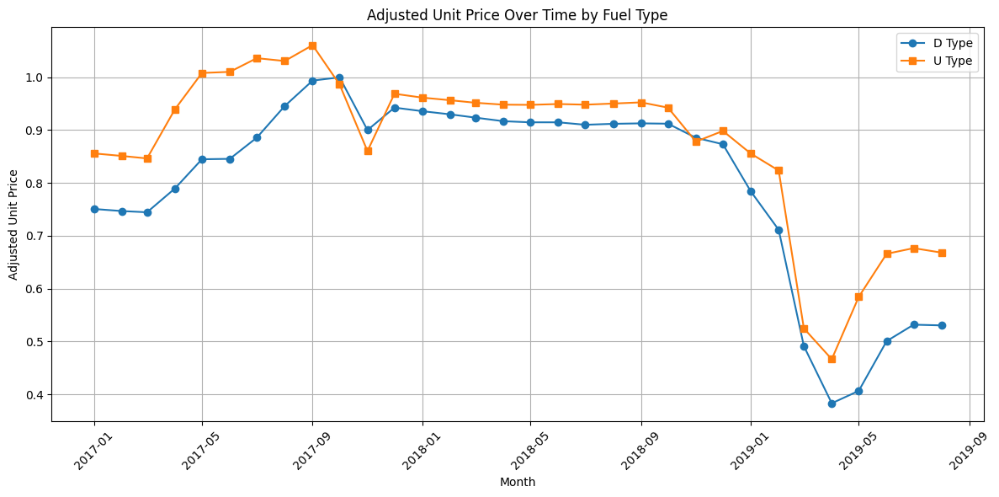

In [18]:
# Seperate the data for fuel type "D"and "U"
df_d = invoice_monthly_mean[invoice_monthly_mean["Fuel Type"] == "D"]
df_u = invoice_monthly_mean[invoice_monthly_mean["Fuel Type"] == "U"]

df_d["Month"] = pd.to_datetime(df_d["Month"].astype(str))
df_u["Month"] = pd.to_datetime(df_u["Month"].astype(str))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.plot(df_d["Month"], df_d["Adjusted Unit Price"], label="D Type", marker="o")
plt.plot(df_u["Month"], df_u["Adjusted Unit Price"], label="U Type", marker="s")

plt.title("Adjusted Unit Price Over Time by Fuel Type")
plt.xlabel("Month")
plt.ylabel("Adjusted Unit Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

We checked Canada’s oil prices from 2017 to 2019, and the trend is similar to the chart above. Therefore, we have good reason to believe that the original invoice.csv contains a misnomer.

We definded a function for ploting the process of fuel level in changing time. 

In [19]:
def plot_fuel_level(tank_id):
    # Get the time stamp and fuel-level data
    time_stamp = fuel_groups[tank_id]["Time stamp"]
    fuel_level = fuel_groups[tank_id]["Fuel Level"]

    # plot the figure
    plt.figure(figsize=(20, 6))
    plt.plot(time_stamp, fuel_level, marker="o", linestyle="-", markersize=0.1)
    plt.title(f"Fuel Level Trend for {tank_id}")
    plt.xlabel("Time stamp")
    plt.ylabel("Fuel Level")
    plt.grid(True)
    plt.show()

We definded a function for ploting the fuel level in a specific time range. 

In [20]:
def plot_fuel_level_for_specific_time_range(
    fuel_groups, tank_id, start_time, end_time=None
):
    # Convert time stamps to date time
    fuel_groups[tank_id]["Time stamp"] = pd.to_datetime(
        fuel_groups[tank_id]["Time stamp"]
    )

    if end_time == None or start_time == end_time:
        # Filter out the data containing the specific date
        time = fuel_groups[tank_id][
            fuel_groups[tank_id]["Time stamp"].astype(str).str.contains(start_time)
        ]
        # Get the data on the specific time of time stamp and fuel level
        time_stamp_specific = time["Time stamp"]
        fuel_level_specific = time["Fuel Level"]
        # plot the chart
        plt.figure(figsize=(20, 6))
        plt.plot(
            time_stamp_specific,
            fuel_level_specific,
            marker="o",
            linestyle="-",
            markersize=3,
        )
        plt.title(f"Fuel Level Trend for {tank_id} on {start_time}")
        plt.xlabel("Time stamp")
        plt.ylabel("Fuel Level")
        plt.grid(True)
        plt.show()
    else:
        end_time_p = pd.to_datetime(end_time) + timedelta(days=1)
        # Filter out the specific time range data
        data_for_specific_time_range = fuel_groups[tank_id][
            (fuel_groups[tank_id]["Time stamp"] >= start_time)
            & (fuel_groups[tank_id]["Time stamp"] <= end_time_p)
        ]
        # Get the data on the specific time range of the time stamp and fuel level
        time_stamp_specific = data_for_specific_time_range["Time stamp"]
        fuel_level_specific = data_for_specific_time_range["Fuel Level"]
        # plot the figure
        plt.figure(figsize=(20, 6))
        plt.plot(
            time_stamp_specific,
            fuel_level_specific,
            marker="o",
            linestyle="-",
            markersize=2,
        )
        plt.title(f"Fuel Level Trend for {tank_id} from {start_time} to {end_time}")
        plt.xlabel("Time stamp")
        plt.ylabel("Fuel Level")
        plt.grid(True)
        plt.show()

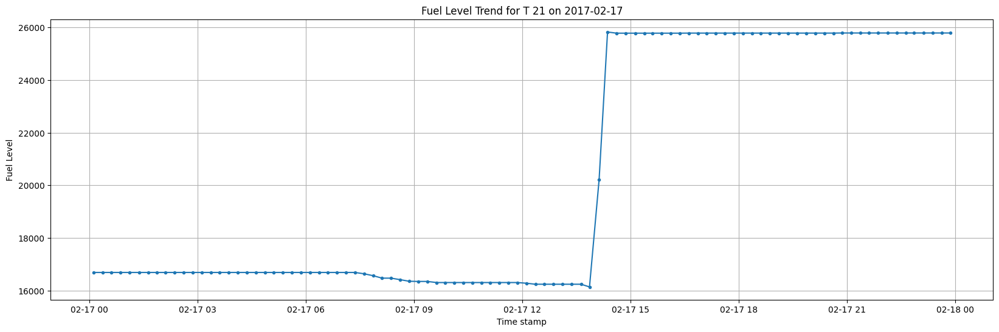

In [21]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 21", "2017-02-17", "2017-02-17")

Here is the function to calculate daily fuel sales:

1.The input value of 'daily_fuel_consumption' is "T XX"，which measn the tank number. 

2.Apply fuel_groups["T XX"]，we can get a table containing Tank ID、Fuel Level and Time stamp.

3.Set Time stamp as the index. 

4.Use resample and lambda function to calculate the daily difference in 'Fuel Level'.

5.Check the values; some are positive value because fuel was added that day. 

6.Filter out the days with positive values and correct the following operations.

7.Add a column to the tank called 'Fuel Level Diff', the value of which is the current time stamp minus the time stamp of the previous row; set the first time stamp of each day as NA, and if the value is positive, then set it to 0.

8.Sum these values for each day to get a table similar to the data structure in 4. 

9.For those positive values in 4, replace them with the values from 8.
 
10.Output the final list of data. 

In [22]:
def daily_fuel_sold(group_name):
    tank = fuel_groups[group_name].copy()

    # Make sure time stamp is the datetime
    tank["Time stamp"] = pd.to_datetime(tank["Time stamp"])
    tank.set_index("Time stamp", inplace=True)

    # Calculate the daily difference in 'Fuel Level'
    daily_diff = (
        tank["Fuel Level"]
        .resample("D")
        .apply(lambda x: x.iloc[-1] - x.iloc[0] if len(x) > 0 else np.NaN)
    )

    # Create an empty DataFrame for storing the corrected results
    corrected_daily_diff = pd.Series(dtype="float64")

    # Indentify and correct positive differences caused by refueling
    positive_diff_days = daily_diff[daily_diff > 0].index
    for day in positive_diff_days:
        # Create a copy of the current day's data to avoid modifying the original data
        day_records = tank[tank.index.date == day.date()].copy()
        day_records["Fuel Level Diff"] = day_records["Fuel Level"].diff().fillna(0)
        day_records.loc[day_records["Fuel Level Diff"] > 0, "Fuel Level Diff"] = 0
        # Calculate the corrected sum difference and update it in corrected_daily_diff
        corrected_diff = day_records["Fuel Level Diff"].sum()
        corrected_daily_diff[day] = corrected_diff

    # For days without refueling, use the original difference values
    non_positive_diff_days = daily_diff[daily_diff <= 0].index
    for day in non_positive_diff_days:
        corrected_daily_diff[day] = daily_diff[day]

    # Convert the Series to DataFrame and add information about the weekday and whether it is a US holiday
    corrected_daily_diff_df = corrected_daily_diff.sort_index().to_frame(
        name="Fuel Level Difference"
    )
    corrected_daily_diff_df["Weekday"] = corrected_daily_diff_df.index.day_name()

    # Get the list of US federal holidays
    calendar = USFederalHolidayCalendar()
    holidays = calendar.holidays(
        start=corrected_daily_diff_df.index.min(),
        end=corrected_daily_diff_df.index.max(),
    )

    # Check and mark holidays
    corrected_daily_diff_df["Is US Holiday"] = corrected_daily_diff_df.index.isin(
        holidays
    )

    # Return the final daily difference data, day of the week, and whether it is a US holiday
    return corrected_daily_diff_df

We definded a function to produce a scatter plot of daily sales volumes.

In [23]:
def plot_daily_fuel_sold(tank):
    plt.figure(figsize=(20, 6))
    plt.scatter(tank.index, tank["Fuel Level Difference"], color="blue", s=10)
    plt.title(f"Daily Fuel Sold")
    plt.xlabel("Date")
    plt.ylabel("Fuel Level Difference")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

**--------------------Data analysis--------------------**

Use T21 as an example

In [24]:
test_t21 = daily_fuel_sold("T 21")
test_t21

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4.0,Sunday,False
2017-01-02,-1363.0,Monday,True
2017-01-03,-583.0,Tuesday,False
2017-01-04,-1143.0,Wednesday,False
2017-01-05,-1071.0,Thursday,False
...,...,...,...
2019-08-11,0.0,Sunday,False
2019-08-12,-291.0,Monday,False
2019-08-13,-254.0,Tuesday,False
2019-08-14,-469.0,Wednesday,False


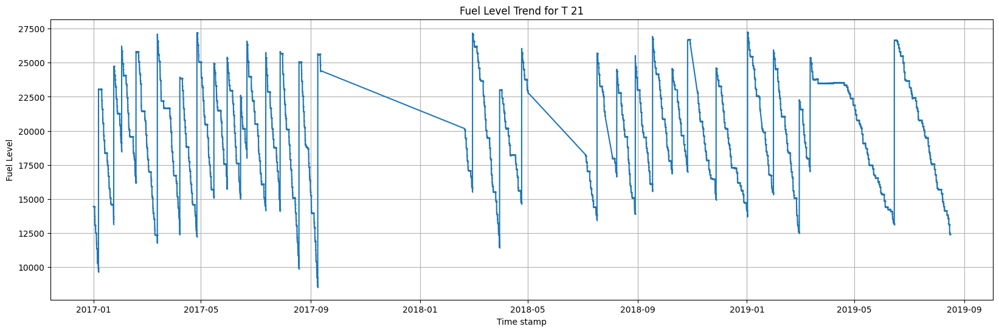

In [25]:
plot_fuel_level("T 21")

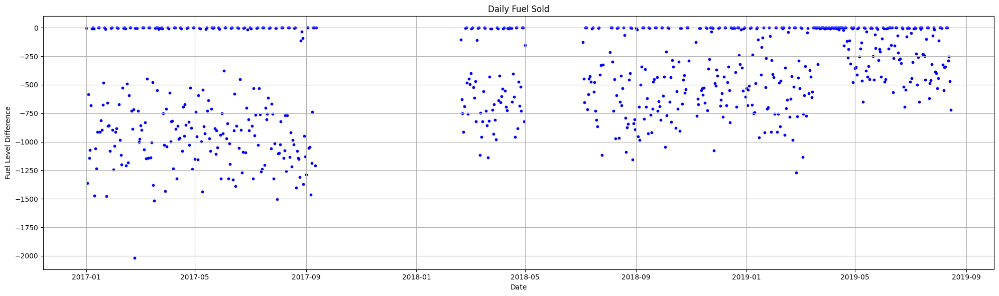

In [26]:
plot_daily_fuel_sold(test_t21)

Check the outlier, here is the point between 2017-01 to 2017-05, which is below -2000.

In [27]:
test_t21[test_t21["Fuel Level Difference"] < -2000]

,Fuel Level Difference,Weekday,Is US Holiday
2017-02-23,-2017.0,Thursday,False


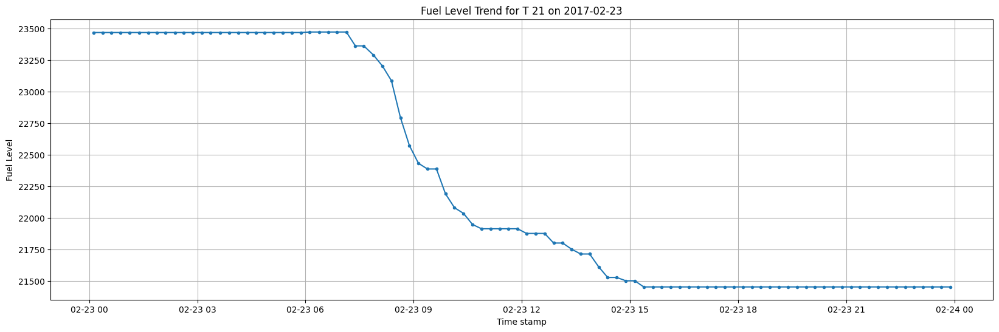

In [28]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 21", "2017-02-23")

In [29]:
test_t21["Fuel Level Difference"].describe()

count     718.000000
mean     -450.967967
std       425.146630
min     -2017.000000
25%      -771.250000
50%      -433.500000
75%        -4.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

First, to simplify the problem，the model here is defined that if the safe capacity is triggered at the end of a day, the gas station will order fuel, with the ordered amount being the total capacity minus the current amount. The fuel will arrive before the business starts the next day.

Because of the fluctuation in the fuel level at this location is relatively small, so we choose a more aggressive strategy. 

Based on a tank capacity of 30,000, I want to set the safe capacity at a relatively aggressive level of 1,500, with the refueling threshold relaxed to 2,000 on special dates.

In [30]:
test_t21.groupby("Weekday").describe()

Fuel Level Difference                                          \
                          count        mean         std     min     25%   
Weekday                                                                   
Friday                    102.0 -592.568627  366.994389 -1518.0 -865.00   
Monday                    104.0 -642.250000  409.552485 -1503.0 -942.75   
Saturday                  101.0   -8.633663   41.986599  -398.0   -4.00   
Sunday                    102.0   -4.019608   10.307145   -72.0   -4.00   
Thursday                  103.0 -659.097087  385.854959 -2017.0 -906.50   
Tuesday                   104.0 -617.701923  377.233720 -1473.0 -892.00   
Wednesday                 102.0 -619.107843  351.274001 -1464.0 -862.00   

                               
             50%     75%  max  
Weekday                        
Friday    -594.0 -341.75  0.0  
Monday    -679.5 -290.25  0.0  
Saturday     0.0    0.00  0.0  
Sunday       0.0    0.00  0.0  
Thursday  -670.0 -359.50  0.0  
Tuesday   -630.5 -352.50  0.0  
Wednesday -583.5 -421.00  0.0

In [31]:
round(test_t21.groupby("Is US Holiday").describe(), 2).to_clipboard()

As the results showed that the best days for refueling are weekends, because they are the least busy, next is Fridays, which have the lowest average, but the variation during weekdays is not significant. 
Therefore, we think it's better to say that refueling on weekends is more appropriate because there is also a significant amount of refueling on Mondays.

Additionally, US holidays significantly increase fuel sales, so it's better to refuel before a holiday.

In conclusion, first, check how much fuel is left at the end of the day. If tomorrow is weekends or a holiday, use the relaxed threshold of 2,000; if not, use the standard threshold of 1,500. If it falls below this threshold, then refill the tank the next day.

In [32]:
def update_fuel_data(
    df,
    fuel_type,
    initial_fuel_level,
    fuel_limit,
    low_threshold_sp,
    best_day,  # Here can type in a list, string, Sunday-Monday
    low_threshold_other,
    consider_holiday,  # Consider holiday factors, then use True
):
    df = df.copy()
    df["Purchase"] = 0
    # Apply conditional logic to update Purchase
    df.at[df.index[0], "Fuel Level"] = initial_fuel_level
    df.rename(columns={"Fuel Level Difference": "Fuel Sales"}, inplace=True)
    for i in range(1, len(df) - 1):
        # Whether to consider holidays
        is_holiday = df.iloc[i]["Is US Holiday"] if consider_holiday else False
        # Conditions for Monday or holidays
        if (
            df.iloc[i]["Weekday"].lower() in [day.lower() for day in best_day]
            or is_holiday
        ):
            if df.iloc[i - 1]["Fuel Level"] < low_threshold_sp:
                df.at[df.index[i], "Purchase"] = (
                    fuel_limit - df.iloc[i - 1]["Fuel Level"]
                )
                df.at[df.index[i], "Fuel Level"] = (
                    df.at[df.index[i - 1], "Fuel Level"]
                    + df.at[df.index[i], "Fuel Sales"]
                    + df.at[df.index[i], "Purchase"]
                )
            else:
                df.at[df.index[i], "Fuel Level"] = (
                    df.at[df.index[i - 1], "Fuel Level"]
                    + df.at[df.index[i], "Fuel Sales"]
                    + df.at[df.index[i], "Purchase"]
                )
        else:  # Conditions for not Monday or not holidays
            if df.iloc[i - 1]["Fuel Level"] < low_threshold_other:
                df.at[df.index[i], "Purchase"] = (
                    fuel_limit - df.iloc[i - 1]["Fuel Level"]
                )
                df.at[df.index[i], "Fuel Level"] = (
                    df.at[df.index[i - 1], "Fuel Level"]
                    + df.at[df.index[i], "Fuel Sales"]
                    + df.at[df.index[i], "Purchase"]
                )
            else:
                df.at[df.index[i], "Fuel Level"] = (
                    df.at[df.index[i - 1], "Fuel Level"]
                    + df.at[df.index[i], "Fuel Sales"]
                    + df.at[df.index[i], "Purchase"]
                )

    if df.iloc[-1]["Fuel Level"] < low_threshold_other:
        df.at[df.index[-1], "Purchase"] = fuel_limit - df.iloc[-2]["Fuel Level"]
    df.at[df.index[-1], "Fuel Level"] = (
        df.at[df.index[-1], "Fuel Level"]
        + df.at[df.index[-1], "Fuel Sales"]
        + df.at[df.index[-2], "Purchase"]
    )
    # Add a Fuel Cost column, initially set to 0
    df["Fuel Cost"] = 0.0

    for i, row in df.iterrows():
        # Get the month of the current row
        month = i.strftime("%Y-%m")

        # Find the Adjusted Unit Price for the corresponding month
        unit_price = invoice_monthly_mean.loc[
            (invoice_monthly_mean["Month"] == month)
            & (invoice_monthly_mean["Fuel Type"] == fuel_type),
            "Adjusted Unit Price",
        ].values[0]

        # Calculate the discount based on the Purchase
        if 15000 <= row["Purchase"] <= 25000:
            discount = 0.02
        elif 25000 < row["Purchase"] <= 40000:
            discount = 0.03
        elif row["Purchase"] > 40000:
            discount = 0.04
        else:
            discount = 0

        # Calculate the adjusted unit price and total cost
        adjusted_price = unit_price - discount
        df.at[i, "Fuel Cost"] = adjusted_price * row["Purchase"]

    return df


# Call the function, considering holidays here
updated_test_t21 = update_fuel_data(
    test_t21, "D", 14446.0, 30000, 1500, "Sunday", 2000, True
)
updated_test_t21.iloc[15:25]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-16,-916.0,Monday,True,0,3993.0,0.000000
2017-01-17,-814.0,Tuesday,False,0,3179.0,0.000000
2017-01-18,-897.0,Wednesday,False,0,2282.0,0.000000
2017-01-19,-678.0,Thursday,False,0,1604.0,0.000000
2017-01-20,-484.0,Friday,False,28396,29516.0,20462.544544
2017-01-21,0.0,Saturday,False,0,29516.0,0.000000
2017-01-22,-12.0,Sunday,False,0,29504.0,0.000000
2017-01-23,-1476.0,Monday,False,0,28028.0,0.000000
2017-01-24,-659.0,Tuesday,False,0,27369.0,0.000000
2017-01-25,-863.0,Wednesday,False,0,26506.0,0.000000


In [33]:
updated_test_t21["Fuel Cost"].sum()

245116.57290174876

In [34]:
invoice[(invoice["Invoice Gas Station Location"] == 3) & (invoice["Fuel Type"] == "D")][
    "Adjusted Gross Purchase Cost"
].sum()

422744.8829650607

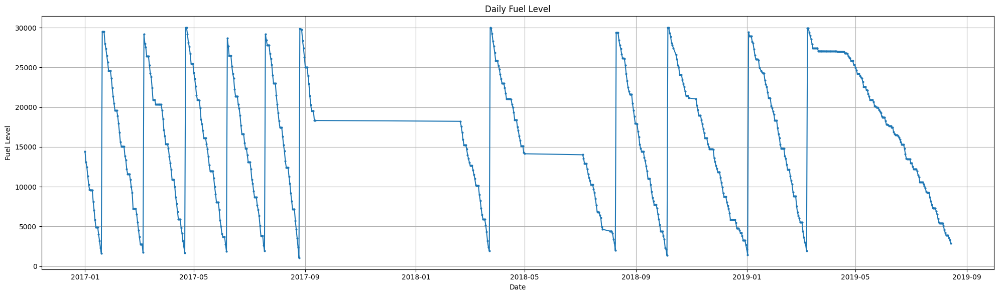

In [35]:
def plot_fuel_level_update(df):
    plt.figure(figsize=(20, 6))
    plt.plot(df.index, df["Fuel Level"], marker="o", linestyle="-", markersize=2)
    plt.title(f"Daily Fuel Level")
    plt.xlabel("Date")
    plt.ylabel("Fuel Level")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_fuel_level_update(updated_test_t21)

**other tank solutions：**

**Location 1, Type U：**

In [36]:
test = daily_fuel_sold("T 10")
print(test)

            Fuel Level Difference    Weekday  Is US Holiday
2017-01-01                -4577.0     Sunday          False
2017-01-02                -5462.0     Monday           True
2017-01-03                -5277.0    Tuesday          False
2017-01-04                -5239.0  Wednesday          False
2017-01-05                -5685.0   Thursday          False
...                           ...        ...            ...
2019-08-03                -3400.0   Saturday          False
2019-08-04                -3835.0     Sunday          False
2019-08-05                -1677.0     Monday          False
2019-08-06                -6052.0    Tuesday          False
2019-08-07                -4414.0  Wednesday          False

[882 rows x 3 columns]


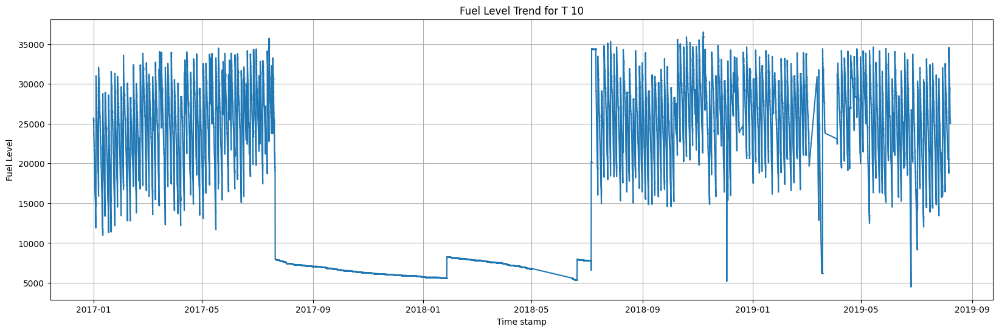

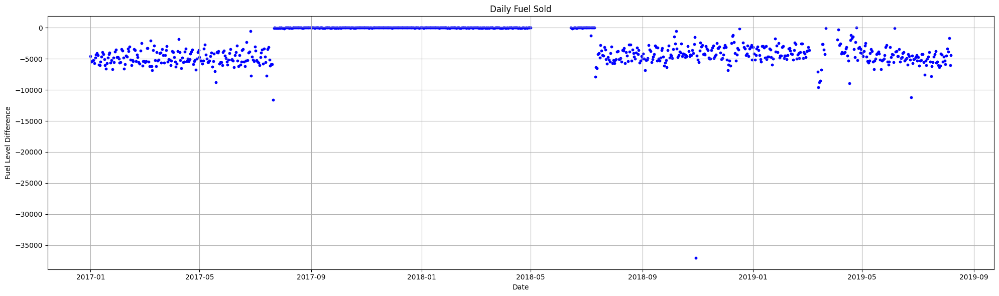

In [37]:
plot_fuel_level("T 10")
plot_daily_fuel_sold(test)

In [38]:
test[test["Fuel Level Difference"] < -35000]

,Fuel Level Difference,Weekday,Is US Holiday
2018-10-30,-37027.0,Tuesday,False


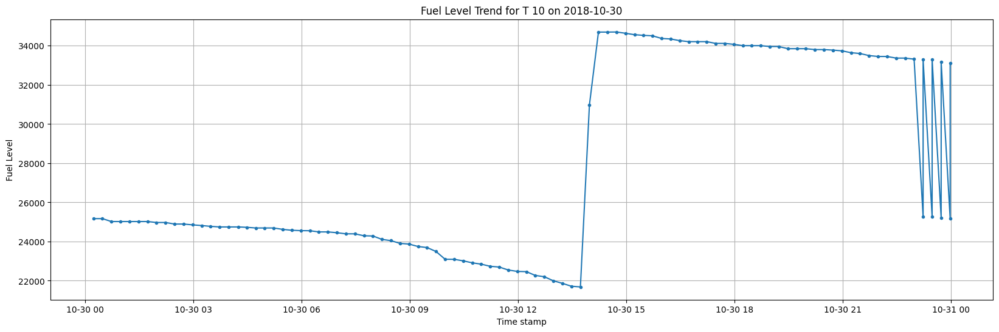

In [39]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 10", "2018-10-30")

In [40]:
# Use this line to see the time stamp of the current day
fuel_groups["T 10"][
    fuel_groups["T 10"]["Time stamp"].dt.date == pd.to_datetime("2018-10-30").date()
]

,Tank ID,Fuel Level,Time stamp
1539383,T 10,25170.0,2018-10-30 00:14:00
1539394,T 10,25170.0,2018-10-30 00:29:00
1539405,T 10,25022.0,2018-10-30 00:44:00
1539416,T 10,25022.0,2018-10-30 00:59:00
1539427,T 10,25022.0,2018-10-30 01:14:00
...,...,...,...
1540393,T 10,33290.0,2018-10-30 23:29:00
1540406,T 10,25211.0,2018-10-30 23:44:00
1540407,T 10,33165.0,2018-10-30 23:44:00
1540419,T 10,25170.0,2018-10-30 23:59:00


In [41]:
# Use this line to see the time stamp of the current day
fuel_groups["T 10"][
    fuel_groups["T 10"]["Time stamp"].dt.date == pd.to_datetime("2018-10-30").date()
][50:70]

,Tank ID,Fuel Level,Time stamp
1539924,T 10,22202.0,2018-10-30 12:44:00
1539935,T 10,21998.0,2018-10-30 12:59:00
1539945,T 10,21865.0,2018-10-30 13:14:00
1539956,T 10,21718.0,2018-10-30 13:29:00
1539967,T 10,21683.0,2018-10-30 13:44:00
1539978,T 10,30980.0,2018-10-30 13:59:00
1539989,T 10,34698.0,2018-10-30 14:14:00
1539999,T 10,34698.0,2018-10-30 14:29:00
1540010,T 10,34702.0,2018-10-30 14:44:00
1540021,T 10,34637.0,2018-10-30 14:59:00


In [42]:
# Manually correct the outliers
test.loc["2018-10-30", "Fuel Level Difference"] = (
    33104.0 - 25170.0 - (34698.0 - 21683.0)
)
test.loc["2018-10-30"]

Fuel Level Difference    -5081.0
Weekday                  Tuesday
Is US Holiday              False
Name: 2018-10-30 00:00:00, dtype: object

In [43]:
test["Fuel Level Difference"].describe()

count      882.000000
mean     -2913.929705
std       2402.560208
min     -11602.000000
25%      -4944.250000
50%      -3552.500000
75%        -18.000000
max          0.000000
Name: Fuel Level Difference, dtype: float64

In [44]:
test.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std      min     25%   
Weekday                                                                      
Friday                    127.0 -3091.905512  2577.096165 -11602.0 -5008.5   
Monday                    127.0 -2958.062992  2486.025619 -11182.0 -5103.0   
Saturday                  126.0 -2352.134921  1883.511666  -8510.0 -3844.0   
Sunday                    127.0 -2232.133858  1766.598468  -6768.0 -3599.5   
Thursday                  125.0 -3297.400000  2645.563578  -9622.0 -5459.0   
Tuesday                   125.0 -3143.336000  2554.492557  -7825.0 -5262.0   
Wednesday                 125.0 -3334.384000  2549.525449  -8937.0 -5337.0   

                               
              50%    75%  max  
Weekday                        
Friday    -3858.0 -26.50  0.0  
Monday    -3956.0 -13.00  0.0  
Saturday  -3161.0 -18.25  0.0  
Sunday    -2889.0  -8.50  0.0  
Thursday  -4675.0 -19.00  0.0  
Tuesday   -3934.0 -12.00  0.0  
Wednesday -4384.0 -38.00  0.0

In [45]:
test.groupby("Is US Holiday").describe()

Fuel Level Difference                                     \
                              count         mean          std      min   
Is US Holiday                                                            
False                         858.0 -2921.841492  2405.177167 -11602.0   
True                           24.0 -2631.083333  2338.513685  -5474.0   

                                            
                   25%     50%    75%  max  
Is US Holiday                               
False         -4932.00 -3569.5 -18.25  0.0  
True          -4992.75 -3143.5 -14.00  0.0

In [46]:
fuel_groups["T 10"]["Fuel Level"].iloc[0]

25700.0

In [47]:
updated_test = update_fuel_data(
    test,
    "U",
    fuel_groups["T 10"]["Fuel Level"].iloc[0],
    40000,
    10000,
    "Sunday",
    12000,
    False,
)
updated_test.iloc[0:30]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-4577.0,Sunday,False,0,25700.0,0.000000
2017-01-02,-5462.0,Monday,True,0,20238.0,0.000000
2017-01-03,-5277.0,Tuesday,False,0,14961.0,0.000000
2017-01-04,-5239.0,Wednesday,False,0,9722.0,0.000000
2017-01-05,-5685.0,Thursday,False,30278,34315.0,25001.507497
2017-01-06,-4788.0,Friday,False,0,29527.0,0.000000
2017-01-07,-4319.0,Saturday,False,0,25208.0,0.000000
2017-01-08,-4107.0,Sunday,False,0,21101.0,0.000000
2017-01-09,-4429.0,Monday,False,0,16672.0,0.000000
2017-01-10,-5947.0,Tuesday,False,0,10725.0,0.000000


In [48]:
updated_test["Purchase"].sum()

2569343

In [49]:
invoice[(invoice["Invoice Gas Station Location"] == 1) & (invoice["Fuel Type"] == "U")][
    "Adjusted Gross Purchase Cost"
].sum()

10615119.850012068

In [50]:
updated_test["Fuel Cost"].sum()

2087698.740905665

In [51]:
invoice[(invoice["Invoice Gas Station Location"] == 1) & (invoice["Fuel Type"] == "U")][
    "Adjusted Gross Purchase Cost"
].sum()

10615119.850012068

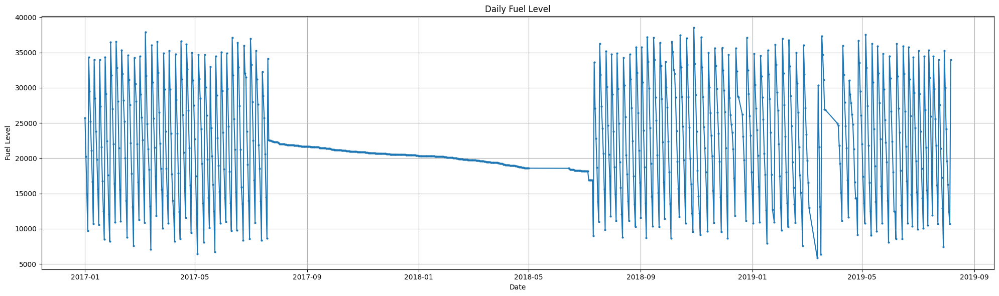

In [52]:
plot_fuel_level_update(updated_test)

In [53]:
test_t11 = daily_fuel_sold("T 11")
test_t11

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4566.0,Sunday,False
2017-01-02,-5477.0,Monday,True
2017-01-03,-5030.0,Tuesday,False
2017-01-04,-5205.0,Wednesday,False
2017-01-05,-5799.0,Thursday,False
...,...,...,...
2019-08-03,-3407.0,Saturday,False
2019-08-04,-3843.0,Sunday,False
2019-08-05,-1730.0,Monday,False
2019-08-06,-4949.0,Tuesday,False


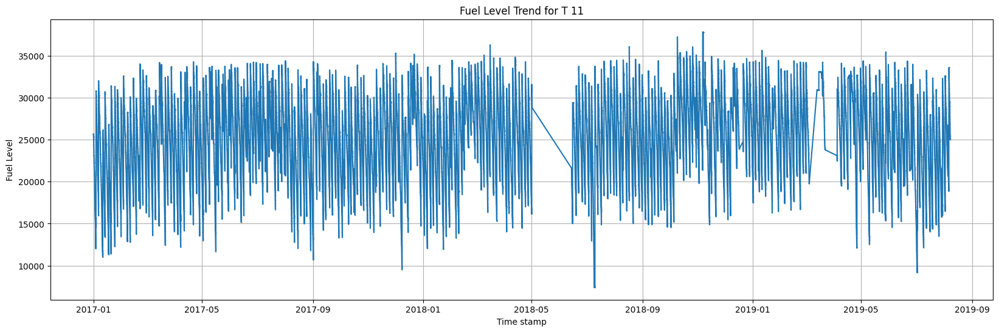

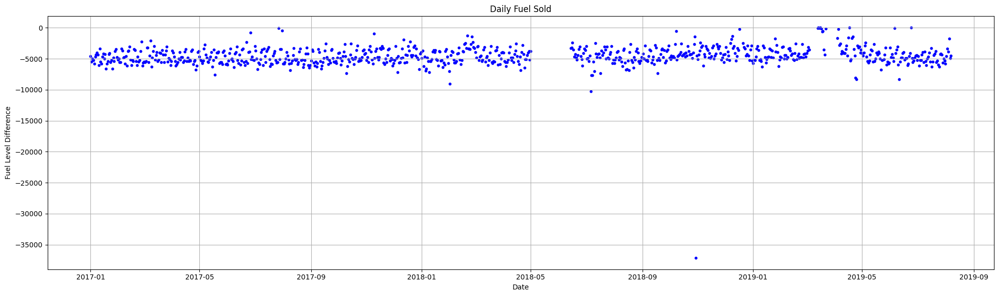

In [54]:
plot_fuel_level("T 11")
plot_daily_fuel_sold(test_t11)

In [55]:
test_t11[test_t11["Fuel Level Difference"] < -35000]

,Fuel Level Difference,Weekday,Is US Holiday
2018-10-30,-37110.0,Tuesday,False


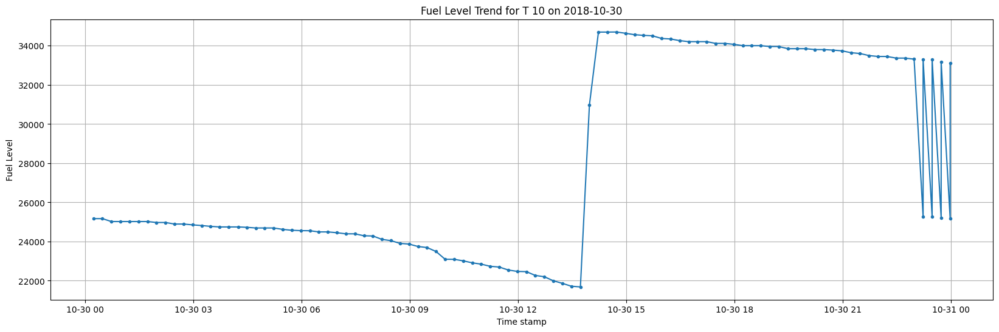

In [56]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 10", "2018-10-30")

In [57]:
fuel_groups["T 11"][
    fuel_groups["T 11"]["Time stamp"].dt.date == pd.to_datetime("2018-10-30").date()
]

,Tank ID,Fuel Level,Time stamp
1539382,T 11,25064.0,2018-10-30 00:14:00
1539393,T 11,25064.0,2018-10-30 00:29:00
1539404,T 11,25026.0,2018-10-30 00:44:00
1539415,T 11,24988.0,2018-10-30 00:59:00
1539426,T 11,24988.0,2018-10-30 01:14:00
...,...,...,...
1540391,T 11,33229.0,2018-10-30 23:29:00
1540404,T 11,25211.0,2018-10-30 23:44:00
1540405,T 11,33161.0,2018-10-30 23:44:00
1540417,T 11,25211.0,2018-10-30 23:59:00


In [58]:
fuel_groups["T 11"][
    fuel_groups["T 11"]["Time stamp"].dt.date == pd.to_datetime("2018-10-30").date()
][50:70]

,Tank ID,Fuel Level,Time stamp
1539923,T 11,22160.0,2018-10-30 12:44:00
1539934,T 11,22081.0,2018-10-30 12:59:00
1539944,T 11,21937.0,2018-10-30 13:14:00
1539955,T 11,21865.0,2018-10-30 13:29:00
1539966,T 11,21710.0,2018-10-30 13:44:00
1539977,T 11,31779.0,2018-10-30 13:59:00
1539988,T 11,35084.0,2018-10-30 14:14:00
1539998,T 11,35019.0,2018-10-30 14:29:00
1540009,T 11,34747.0,2018-10-30 14:44:00
1540020,T 11,34664.0,2018-10-30 14:59:00


In [59]:
test_t11.loc["2018-10-30", "Fuel Level Difference"] = (
    33134.0 - 25064.0 - (35084.0 - 21710.0)
)
test_t11.loc["2018-10-30"]

Fuel Level Difference    -5304.0
Weekday                  Tuesday
Is US Holiday              False
Name: 2018-10-30 00:00:00, dtype: object

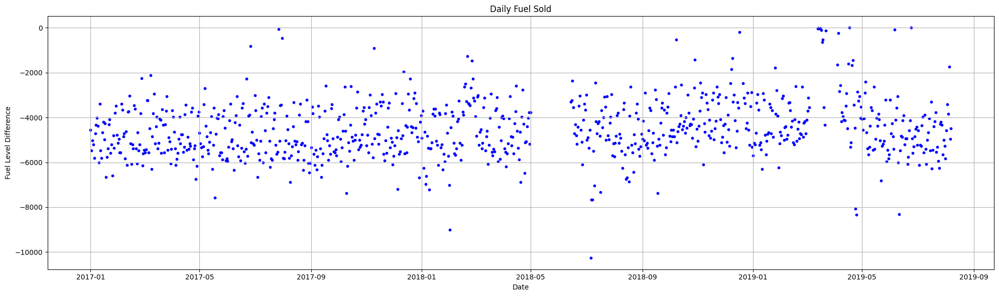

In [60]:
plot_daily_fuel_sold(test_t11)

In [61]:
test_t11["Fuel Level Difference"].describe()

count      882.000000
mean     -4508.862812
std       1276.606061
min     -10255.000000
25%      -5344.250000
50%      -4671.500000
75%      -3720.000000
max          0.000000
Name: Fuel Level Difference, dtype: float64

In [62]:
test_t11.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std      min     25%   
Weekday                                                                      
Friday                    127.0 -4808.007874  1228.645993 -10255.0 -5373.5   
Monday                    127.0 -4556.425197  1236.411150  -6303.0 -5329.5   
Saturday                  126.0 -3797.119048   808.090031  -7662.0 -4114.5   
Sunday                    127.0 -3359.440945   782.399501  -7662.0 -3802.5   
Thursday                  125.0 -5046.872000  1271.203766  -9016.0 -5602.0   
Tuesday                   125.0 -4923.736000  1241.227710  -8316.0 -5618.0   
Wednesday                 125.0 -5088.976000  1135.047437  -8078.0 -5792.0   

                                   
              50%      75%    max  
Weekday                            
Friday    -4906.0 -4348.00  -48.0  
Monday    -4879.0 -4177.50    0.0  
Saturday  -3793.0 -3460.75  -11.0  
Sunday    -3369.0 -2951.00 -117.0  
Thursday  -5250.0 -4698.00  -15.0  
Tuesday   -5039.0 -4391.00 -538.0  
Wednesday -5235.0 -4569.00    0.0

In [63]:
test_t11.groupby("Is US Holiday").describe()

Fuel Level Difference                                    \
                              count        mean          std      min   
Is US Holiday                                                           
False                         858.0 -4507.17366  1277.821247 -10255.0   
True                           24.0 -4569.25000  1257.381138  -6670.0   

                                                
                   25%     50%      75%    max  
Is US Holiday                                   
False         -5341.75 -4665.0 -3714.00    0.0  
True          -5366.00 -4919.0 -4168.25 -522.0

In [64]:
updated_test_t11 = update_fuel_data(
    test_t11,
    "U",
    fuel_groups["T 11"]["Fuel Level"].iloc[0],
    40000,
    9000,
    "Sunday",
    10000,
    False,
)
updated_test_t11.iloc[0:30]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-4566.0,Sunday,False,0,25685.0,0.000000
2017-01-02,-5477.0,Monday,True,0,20208.0,0.000000
2017-01-03,-5030.0,Tuesday,False,0,15178.0,0.000000
2017-01-04,-5205.0,Wednesday,False,0,9973.0,0.000000
2017-01-05,-5799.0,Thursday,False,30027,34201.0,24794.248814
2017-01-06,-4709.0,Friday,False,0,29492.0,0.000000
2017-01-07,-4323.0,Saturday,False,0,25169.0,0.000000
2017-01-08,-4016.0,Sunday,False,0,21153.0,0.000000
2017-01-09,-4387.0,Monday,False,0,16766.0,0.000000
2017-01-10,-6012.0,Tuesday,False,0,10754.0,0.000000


In [65]:
updated_test_t11["Fuel Cost"].sum()

3420847.2230696566

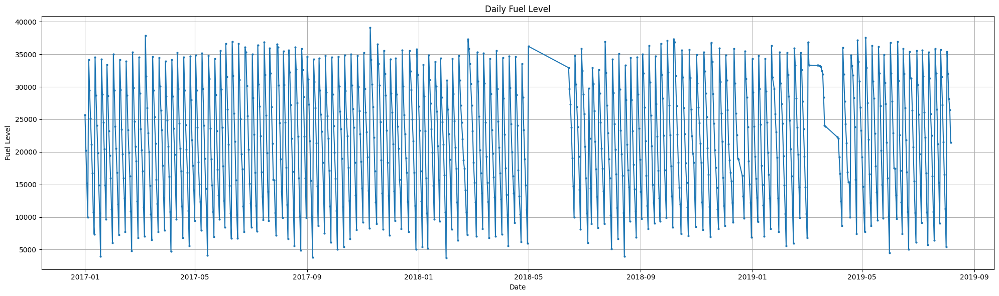

In [66]:
plot_fuel_level_update(updated_test_t11)

In [67]:
test_t14 = daily_fuel_sold("T 14")
test_t14

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-2494.0,Sunday,False
2017-01-02,-4773.0,Monday,True
2017-01-03,-4194.0,Tuesday,False
2017-01-04,-5076.0,Wednesday,False
2017-01-05,-5502.0,Thursday,False
...,...,...,...
2019-08-03,-2127.0,Saturday,False
2019-08-04,-1730.0,Sunday,False
2019-08-05,-3374.0,Monday,False
2019-08-06,-4770.0,Tuesday,False


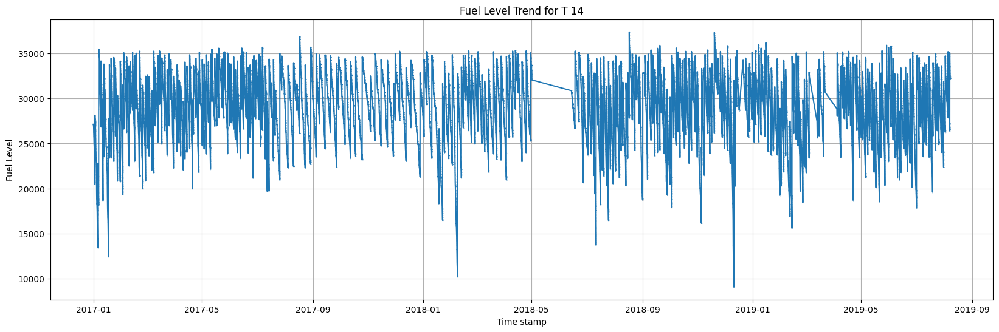

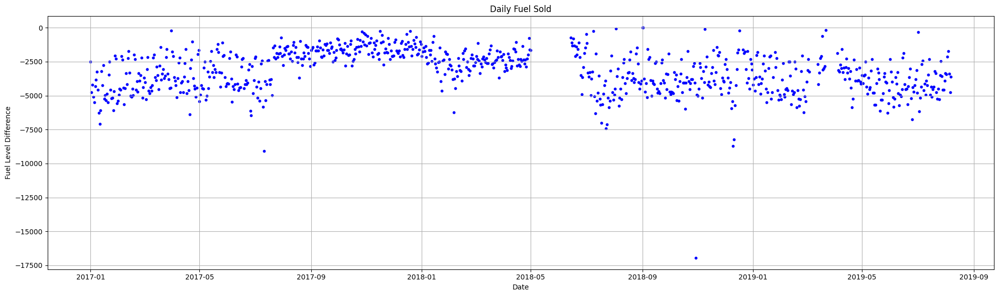

In [68]:
plot_fuel_level("T 14")
plot_daily_fuel_sold(test_t14)

In [69]:
test_t14[test_t14["Fuel Level Difference"] < -15000]

,Fuel Level Difference,Weekday,Is US Holiday
2018-10-30,-16940.0,Tuesday,False


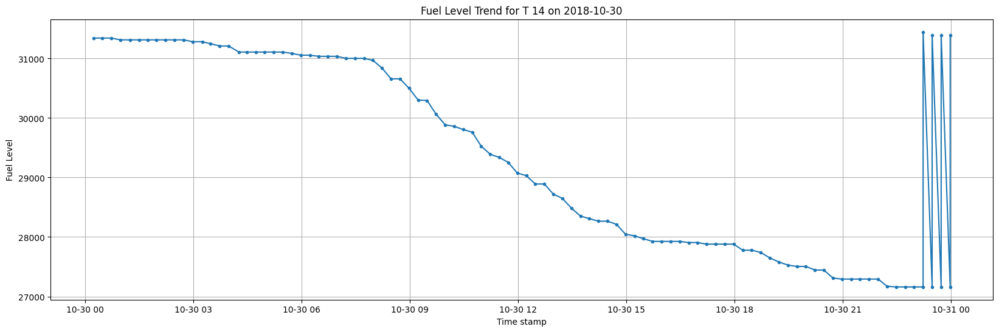

In [70]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 14", "2018-10-30")

In [71]:
fuel_groups["T 14"][
    fuel_groups["T 14"]["Time stamp"].dt.date == pd.to_datetime("2018-10-30").date()
]

,Tank ID,Fuel Level,Time stamp
1539384,T 14,31344.0,2018-10-30 00:14:00
1539395,T 14,31344.0,2018-10-30 00:29:00
1539406,T 14,31344.0,2018-10-30 00:44:00
1539417,T 14,31314.0,2018-10-30 00:59:00
1539429,T 14,31314.0,2018-10-30 01:15:00
...,...,...,...
1540395,T 14,31397.0,2018-10-30 23:29:00
1540408,T 14,27161.0,2018-10-30 23:44:00
1540409,T 14,31397.0,2018-10-30 23:44:00
1540421,T 14,27161.0,2018-10-30 23:59:00


In [72]:
test_t14.loc["2018-10-30", "Fuel Level Difference"] = 27161.0 - 31344.0
test_t14.loc["2018-10-30"]

Fuel Level Difference    -4183.0
Weekday                  Tuesday
Is US Holiday              False
Name: 2018-10-30 00:00:00, dtype: object

In [73]:
test_t14["Fuel Level Difference"].describe()

count     881.000000
mean    -3175.976163
std      1462.341918
min     -9082.000000
25%     -4312.000000
50%     -3066.000000
75%     -2033.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [74]:
test_t14.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std     min      25%   
Weekday                                                                      
Friday                    127.0 -3142.236220  1358.758259 -5488.0 -4234.50   
Monday                    127.0 -3511.858268  1466.159814 -8691.0 -4564.50   
Saturday                  126.0 -2427.412698   983.167715 -5924.0 -3051.75   
Sunday                    127.0 -2040.582677   902.421438 -5413.0 -2502.00   
Thursday                  125.0 -3620.752000  1453.938115 -6379.0 -4743.00   
Tuesday                   124.0 -3833.782258  1587.785673 -9082.0 -4897.50   
Wednesday                 125.0 -3679.792000  1343.414591 -7087.0 -4614.00   

                                   
              50%      75%    max  
Weekday                            
Friday    -3501.0 -1970.50  -46.0  
Monday    -3660.0 -2401.50 -201.0  
Saturday  -2320.0 -1795.00   -4.0  
Sunday    -2055.0 -1366.50    0.0  
Thursday  -3906.0 -2339.00 -258.0  
Tuesday   -4056.0 -2652.25 -257.0  
Wednesday -3796.0 -2445.00 -901.0

In [75]:
test_t14.groupby("Is US Holiday").describe()

Fuel Level Difference                                            \
                              count         mean          std     min     25%   
Is US Holiday                                                                   
False                         857.0 -3164.620770  1464.616038 -9082.0 -4312.0   
True                           24.0 -3581.458333  1344.366894 -5860.0 -4617.0   

                                       
                  50%     75%     max  
Is US Holiday                          
False         -3063.0 -1991.0     0.0  
True          -3704.0 -2607.5 -1428.0

In [76]:
updated_test_t14 = update_fuel_data(
    test_t14,
    "U",
    fuel_groups["T 14"]["Fuel Level"].iloc[0],
    40000,
    7500,
    "Sunday",
    9000,
    False,
)
updated_test_t14.iloc[0:30]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-2494.0,Sunday,False,0,27138.0,0.000000
2017-01-02,-4773.0,Monday,True,0,22365.0,0.000000
2017-01-03,-4194.0,Tuesday,False,0,18171.0,0.000000
2017-01-04,-5076.0,Wednesday,False,0,13095.0,0.000000
2017-01-05,-5502.0,Thursday,False,0,7593.0,0.000000
2017-01-06,-4311.0,Friday,False,32407,35689.0,26759.490503
2017-01-07,-3820.0,Saturday,False,0,31869.0,0.000000
2017-01-08,-3256.0,Sunday,False,0,28613.0,0.000000
2017-01-09,-4564.0,Monday,False,0,24049.0,0.000000
2017-01-10,-6287.0,Tuesday,False,0,17762.0,0.000000


In [77]:
updated_test_t14["Fuel Cost"].sum()

2337339.5838942854

**Location 1, Type D：**

In [78]:
test_t12 = daily_fuel_sold("T 12")
test_t12

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-5054.0,Sunday,False
2017-01-02,-6913.0,Monday,True
2017-01-03,-783.0,Tuesday,False
2017-01-04,-4225.0,Wednesday,False
2017-01-05,-3812.0,Thursday,False
...,...,...,...
2019-08-03,-6283.0,Saturday,False
2019-08-04,-6878.0,Sunday,False
2019-08-05,-5699.0,Monday,False
2019-08-06,-6799.0,Tuesday,False


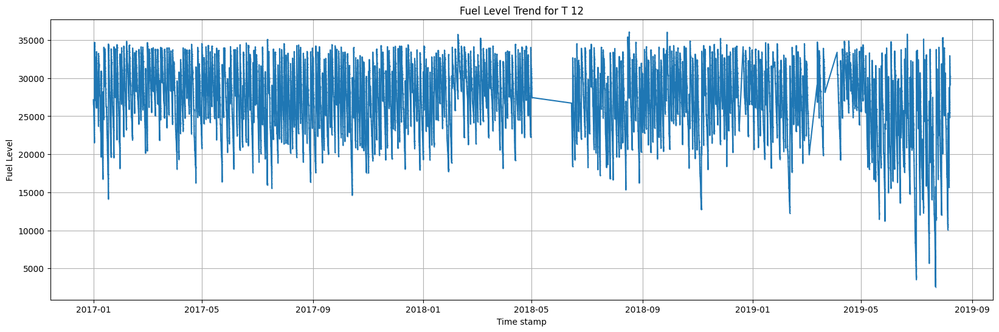

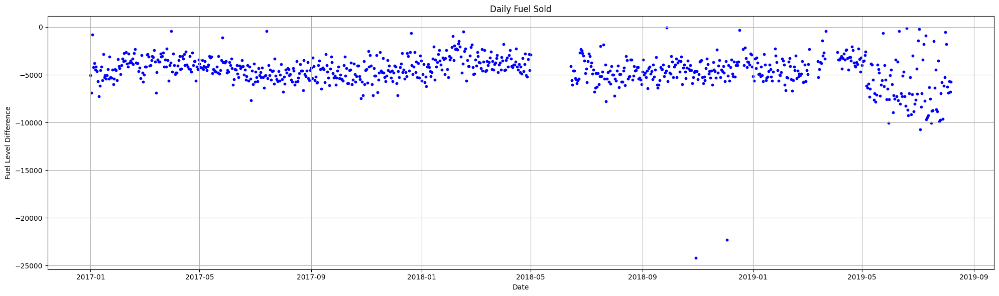

In [79]:
plot_fuel_level("T 12")
plot_daily_fuel_sold(test_t12)

In [80]:
test_t12[test_t12["Fuel Level Difference"] < -20000]

,Fuel Level Difference,Weekday,Is US Holiday
2018-10-30,-24191.0,Tuesday,False
2018-12-03,-22333.0,Monday,False


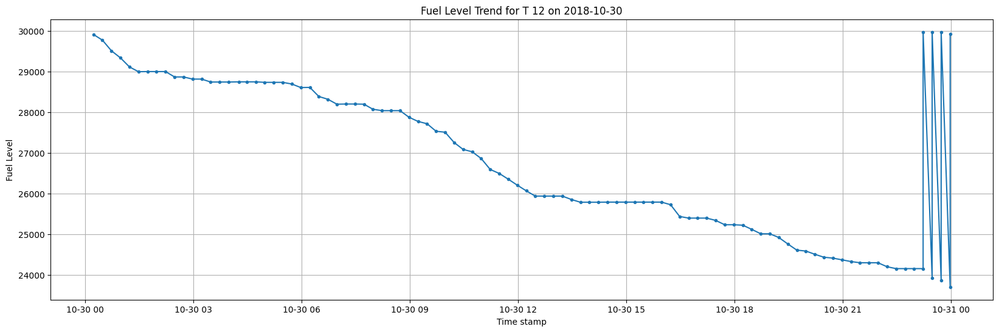

In [81]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 12", "2018-10-30")

In [82]:
fuel_groups["T 12"][
    fuel_groups["T 12"]["Time stamp"].dt.date == pd.to_datetime("2018-10-30").date()
]

,Tank ID,Fuel Level,Time stamp
59504,T 12,29917.0,2018-10-30 00:14:00
59505,T 12,29777.0,2018-10-30 00:29:00
59506,T 12,29515.0,2018-10-30 00:44:00
59507,T 12,29341.0,2018-10-30 00:59:00
59508,T 12,29118.0,2018-10-30 01:14:00
...,...,...,...
59599,T 12,29977.0,2018-10-30 23:29:00
59600,T 12,23871.0,2018-10-30 23:44:00
59601,T 12,29977.0,2018-10-30 23:44:00
59602,T 12,23709.0,2018-10-30 23:59:00


In [83]:
test_t12.loc["2018-10-30", "Fuel Level Difference"] = 23709.0 - 29917.0
test_t12.loc["2018-10-30"]

Fuel Level Difference    -6208.0
Weekday                  Tuesday
Is US Holiday              False
Name: 2018-10-30 00:00:00, dtype: object

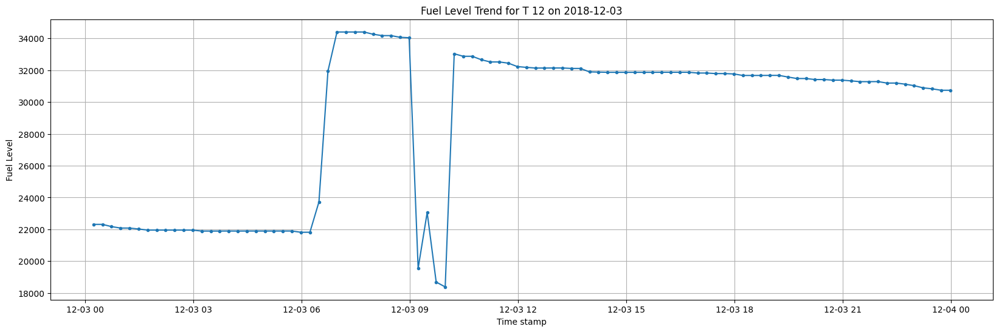

In [84]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 12", "2018-12-03")

In [85]:
fuel_groups["T 12"][
    fuel_groups["T 12"]["Time stamp"].dt.date == pd.to_datetime("2018-12-03").date()
]

,Tank ID,Fuel Level,Time stamp
62753,T 12,22312.0,2018-12-03 00:14:00
62754,T 12,22312.0,2018-12-03 00:29:00
62755,T 12,22172.0,2018-12-03 00:44:00
62756,T 12,22081.0,2018-12-03 00:59:00
62757,T 12,22081.0,2018-12-03 01:14:00
...,...,...,...
62844,T 12,31026.0,2018-12-03 22:59:00
62845,T 12,30890.0,2018-12-03 23:14:00
62846,T 12,30829.0,2018-12-03 23:29:00
62847,T 12,30738.0,2018-12-03 23:44:00


In [86]:
fuel_groups["T 12"][
    fuel_groups["T 12"]["Time stamp"].dt.date == pd.to_datetime("2018-12-03").date()
][20:40]

,Tank ID,Fuel Level,Time stamp
62773,T 12,21895.0,2018-12-03 05:14:00
62774,T 12,21895.0,2018-12-03 05:29:00
62775,T 12,21895.0,2018-12-03 05:44:00
62776,T 12,21816.0,2018-12-03 05:59:00
62777,T 12,21820.0,2018-12-03 06:14:00
62778,T 12,23724.0,2018-12-03 06:29:00
62779,T 12,31946.0,2018-12-03 06:44:00
62780,T 12,34399.0,2018-12-03 06:59:00
62781,T 12,34399.0,2018-12-03 07:14:00
62782,T 12,34399.0,2018-12-03 07:29:00


In [87]:
test_t12.loc["2018-12-03", "Fuel Level Difference"] = (
    30738.0 - 22312.0 - (34399.0 - 21816.0)
)
test_t12.loc["2018-12-03"]

Fuel Level Difference   -4157.0
Weekday                  Monday
Is US Holiday             False
Name: 2018-12-03 00:00:00, dtype: object

In [88]:
test_t12["Fuel Level Difference"].describe()

count      882.000000
mean     -4493.659864
std       1478.643900
min     -10743.000000
25%      -5276.000000
50%      -4441.500000
75%      -3590.500000
max        -68.000000
Name: Fuel Level Difference, dtype: float64

In [89]:
test_t12.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std      min     25%   
Weekday                                                                      
Friday                    127.0 -4433.795276  1667.072367  -9743.0 -5222.0   
Monday                    127.0 -4727.228346  1384.498449  -9627.0 -5401.0   
Saturday                  126.0 -4397.865079  1276.921168  -9252.0 -5158.5   
Sunday                    127.0 -3562.826772   943.043899  -6878.0 -4141.0   
Thursday                  125.0 -4832.312000  1642.100427 -10743.0 -5568.0   
Tuesday                   125.0 -4921.320000  1539.411212 -10059.0 -5576.0   
Wednesday                 125.0 -4593.152000  1371.988532  -8782.0 -5314.0   

                                    
              50%      75%     max  
Weekday                             
Friday    -4467.0 -3729.00   -68.0  
Monday    -4652.0 -3951.50  -303.0  
Saturday  -4283.0 -3529.25 -1748.0  
Sunday    -3536.0 -2907.50  -950.0  
Thursday  -4645.0 -3736.00  -534.0  
Tuesday   -4917.0 -4153.00  -413.0  
Wednesday -4642.0 -3899.00  -102.0

In [90]:
test_t12.groupby("Is US Holiday").describe()

Fuel Level Difference                                     \
                              count         mean          std      min   
Is US Holiday                                                            
False                         858.0 -4479.594406  1473.524211 -10059.0   
True                           24.0 -4996.500000  1604.180164 -10743.0   

                                                 
                   25%     50%      75%     max  
Is US Holiday                                    
False         -5270.00 -4431.5 -3577.00   -68.0  
True          -5512.25 -5123.0 -4047.75 -2385.0

In [91]:
updated_test_t12 = update_fuel_data(
    test_t12,
    "D",
    fuel_groups["T 12"]["Fuel Level"].iloc[0],
    40000,
    10000,
    "Sunday",
    11000,
    True,
)
updated_test_t12.iloc[0:30]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-5054.0,Sunday,False,0,27161.0,0.000000
2017-01-02,-6913.0,Monday,True,0,20248.0,0.000000
2017-01-03,-783.0,Tuesday,False,0,19465.0,0.000000
2017-01-04,-4225.0,Wednesday,False,0,15240.0,0.000000
2017-01-05,-3812.0,Thursday,False,0,11428.0,0.000000
2017-01-06,-4471.0,Friday,False,0,6957.0,0.000000
2017-01-07,-4145.0,Saturday,False,33043,35855.0,23811.236068
2017-01-08,-4607.0,Sunday,False,0,31248.0,0.000000
2017-01-09,-5705.0,Monday,False,0,25543.0,0.000000
2017-01-10,-7272.0,Tuesday,False,0,18271.0,0.000000


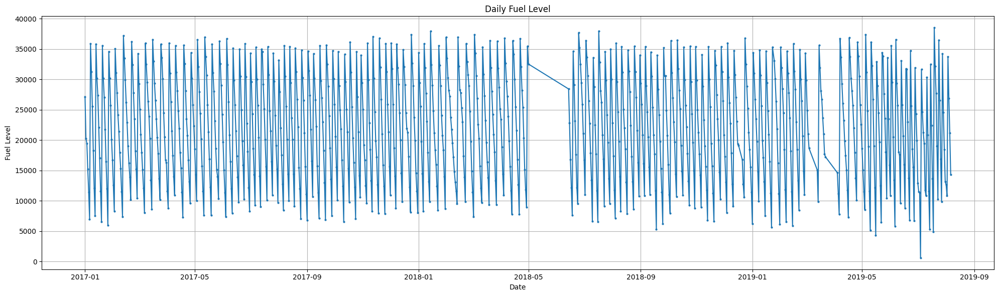

In [92]:
plot_fuel_level_update(updated_test_t12)

In [93]:
updated_test_t12["Fuel Cost"].sum()

3054461.6370550236

In [94]:
invoice[(invoice["Invoice Gas Station Location"] == 1) & (invoice["Fuel Type"] == "D")][
    "Adjusted Gross Purchase Cost"
].sum()

4757975.028322944

In [95]:
test_t15 = daily_fuel_sold("T 15")
test_t15

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-844.0,Sunday,False
2017-01-02,-2748.0,Monday,True
2017-01-03,-3040.0,Tuesday,False
2017-01-04,-2070.0,Wednesday,False
2017-01-05,-3098.0,Thursday,False
...,...,...,...
2019-08-03,-757.0,Saturday,False
2019-08-04,-484.0,Sunday,False
2019-08-05,-962.0,Monday,False
2019-08-06,-905.0,Tuesday,False


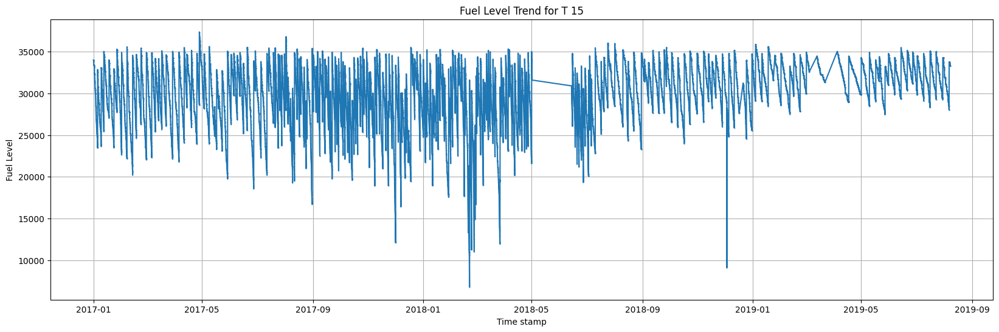

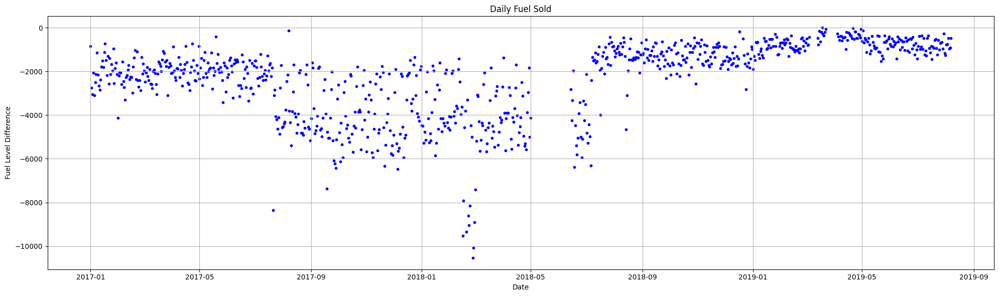

In [96]:
plot_fuel_level("T 15")
plot_daily_fuel_sold(test_t15)

In [97]:
test_t15[test_t15["Fuel Level Difference"] < -10000]

,Fuel Level Difference,Weekday,Is US Holiday
2018-02-26,-10533.0,Monday,False
2018-02-27,-10087.0,Tuesday,False


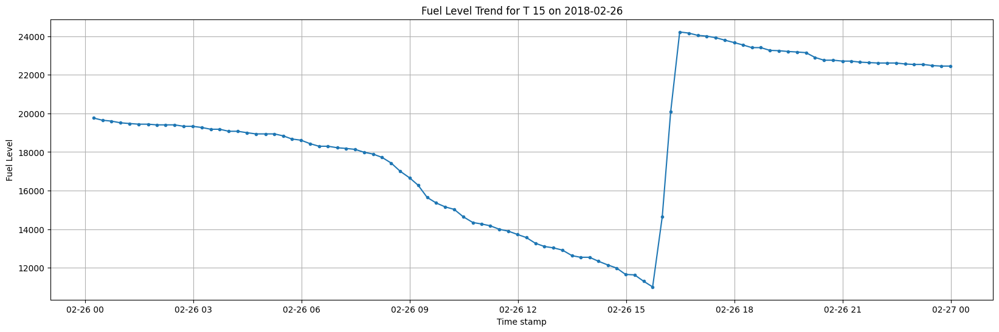

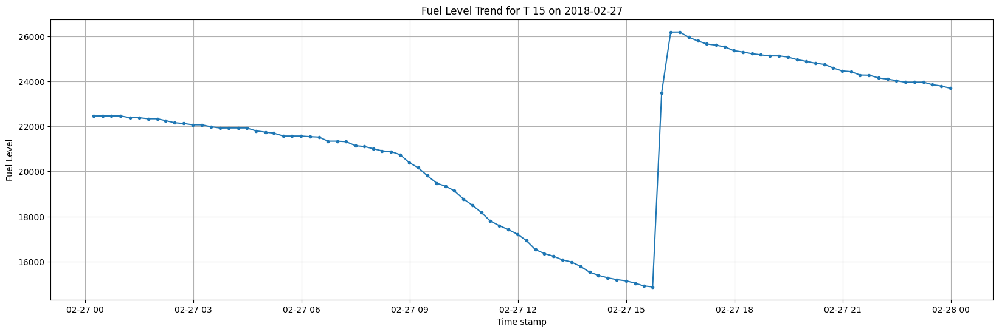

In [98]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 15", "2018-02-26")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 15", "2018-02-27")

In [99]:
test_t15["Fuel Level Difference"].describe()

count      882.000000
mean     -2318.556689
std       1714.698600
min     -10533.000000
25%      -3271.000000
50%      -1796.500000
75%      -1009.000000
max          0.000000
Name: Fuel Level Difference, dtype: float64

In [100]:
test_t15.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std      min     25%   
Weekday                                                                      
Friday                    127.0 -2434.755906  1798.760674  -8362.0 -3916.5   
Monday                    127.0 -2507.125984  1881.330136 -10533.0 -4027.5   
Saturday                  126.0 -1801.277778   928.957408  -4565.0 -2556.5   
Sunday                    127.0 -1422.456693   840.923319  -4993.0 -1938.0   
Thursday                  125.0 -2668.104000  1894.554939  -9529.0 -4307.0   
Tuesday                   125.0 -2744.344000  1930.614699 -10087.0 -4490.0   
Wednesday                 125.0 -2665.432000  1878.429231  -8915.0 -4353.0   

                                  
              50%     75%    max  
Weekday                           
Friday    -1870.0  -965.5  -68.0  
Monday    -1969.0 -1119.0    0.0  
Saturday  -1713.0 -1099.5 -295.0  
Sunday    -1359.0  -831.0  -27.0  
Thursday  -2090.0 -1211.0 -136.0  
Tuesday   -2033.0 -1237.0  -72.0  
Wednesday -2063.0 -1060.0 -185.0

In [101]:
test_t15.groupby("Is US Holiday").describe()

Fuel Level Difference                                     \
                              count         mean          std      min   
Is US Holiday                                                            
False                         858.0 -2310.202797  1708.660074 -10533.0   
True                           24.0 -2617.208333  1934.582574  -9342.0   

                                               
                   25%     50%     75%    max  
Is US Holiday                                  
False         -3258.00 -1793.0 -1003.0    0.0  
True          -3747.75 -2106.5 -1172.0 -533.0

In [102]:
updated_test_t15 = update_fuel_data(
    test_t15,
    "D",
    fuel_groups["T 15"]["Fuel Level"].iloc[0],
    40000,
    10000,
    "Sunday",
    11000,
    True,
)
updated_test_t15.iloc[0:30]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-844.0,Sunday,False,0,33982.0,0.000000
2017-01-02,-2748.0,Monday,True,0,31234.0,0.000000
2017-01-03,-3040.0,Tuesday,False,0,28194.0,0.000000
2017-01-04,-2070.0,Wednesday,False,0,26124.0,0.000000
2017-01-05,-3098.0,Thursday,False,0,23026.0,0.000000
2017-01-06,-2495.0,Friday,False,0,20531.0,0.000000
2017-01-07,-2120.0,Saturday,False,0,18411.0,0.000000
2017-01-08,-1143.0,Sunday,False,0,17268.0,0.000000
2017-01-09,-2159.0,Monday,False,0,15109.0,0.000000
2017-01-10,-2657.0,Tuesday,False,0,12452.0,0.000000


In [103]:
updated_test_t15["Fuel Cost"].sum()

1721713.3831122154

In [104]:
tank["Best Day"] = pd.NA
tank["Consider Holidays"] = pd.NA
tank["Regular Threshold"] = pd.NA
tank["Special Day Threshold"] = pd.NA
tank["New Total Cost"] = pd.NA
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
1,T 11,1,2,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
2,T 12,1,3,D,40000,<NA>,<NA>,<NA>,<NA>,<NA>
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
5,T 15,1,6,D,40000,<NA>,<NA>,<NA>,<NA>,<NA>
6,T 16,2,1,U,70000,<NA>,<NA>,<NA>,<NA>,<NA>
7,T 17,2,2,D,40000,<NA>,<NA>,<NA>,<NA>,<NA>
8,T 18,2,3,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
9,T 19,2,4,D,70000,<NA>,<NA>,<NA>,<NA>,<NA>


In [105]:
def update_tank_df(
    tankid,
    Best_Day,
    Consider_Holidays,
    Regular_Threshold,
    Special_Day_Threshold,
    New_Total_Cost,
):
    tank.loc[tank["Tank ID"] == tankid, "Best Day"] = Best_Day
    tank.loc[tank["Tank ID"] == tankid, "Consider Holidays"] = Consider_Holidays
    tank.loc[tank["Tank ID"] == tankid, "Regular Threshold"] = Regular_Threshold
    tank.loc[tank["Tank ID"] == tankid, "Special Day Threshold"] = Special_Day_Threshold
    tank.loc[tank["Tank ID"] == tankid, "New Total Cost"] = New_Total_Cost

In [106]:
update_tank_df(
    "T 21", "Sunday", True, 1500, 2000, round(updated_test_t21["Fuel Cost"].sum(), 2)
)
update_tank_df(
    "T 10", "Sunday", False, 10000, 12000, round(updated_test["Fuel Cost"].sum(), 2)
)
update_tank_df(
    "T 11", "Sunday", False, 9000, 10000, round(updated_test_t11["Fuel Cost"].sum(), 2)
)
update_tank_df(
    "T 14", "Sunday", False, 7500, 9000, round(updated_test_t14["Fuel Cost"].sum(), 2)
)
update_tank_df(
    "T 12", "Sunday", True, 10000, 11000, round(updated_test_t12["Fuel Cost"].sum(), 2)
)
update_tank_df(
    "T 15", "Sunday", True, 10000, 11000, round(updated_test_t15["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,<NA>,<NA>,<NA>,<NA>,<NA>
7,T 17,2,2,D,40000,<NA>,<NA>,<NA>,<NA>,<NA>
8,T 18,2,3,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
9,T 19,2,4,D,70000,<NA>,<NA>,<NA>,<NA>,<NA>


T16

In [107]:
# 1. import functions to see the data
test_t16 = daily_fuel_sold("T 16")
test_t16

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-783.0,Sunday,False
2017-01-02,-1745.0,Monday,True
2017-01-03,-1157.0,Tuesday,False
2017-01-04,-1332.0,Wednesday,False
2017-01-05,-1757.0,Thursday,False
...,...,...,...
2019-08-11,-731.0,Sunday,False
2019-08-12,-1495.0,Monday,False
2019-08-13,-2052.0,Tuesday,False
2019-08-14,-1688.0,Wednesday,False


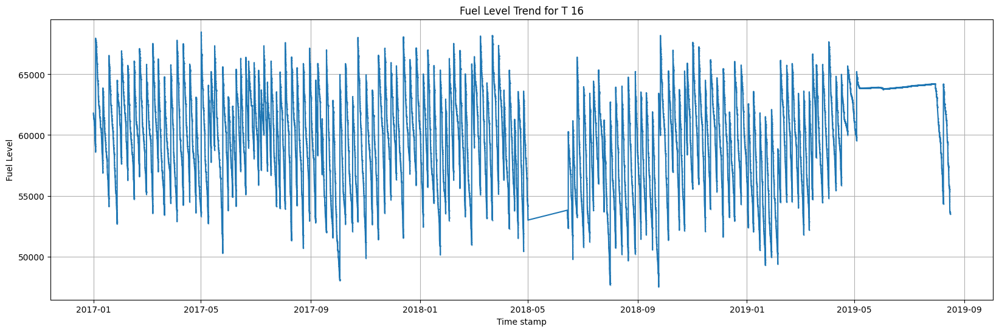

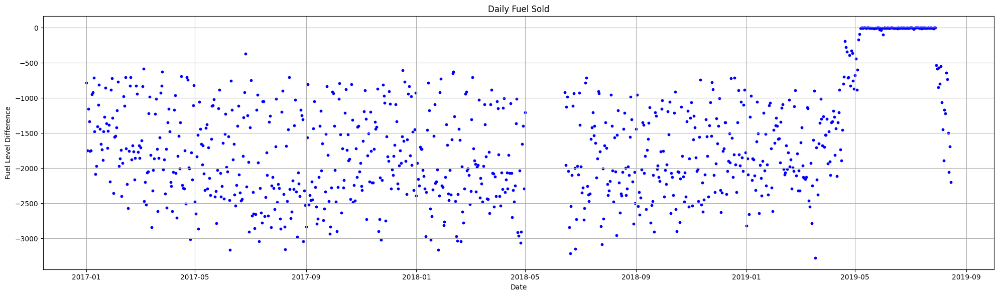

In [108]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 16")
plot_daily_fuel_sold(test_t16)

In [109]:
# 3. identify potentially problematic extremum values
test_t16[test_t16["Fuel Level Difference"] < -3200]

,Fuel Level Difference,Weekday,Is US Holiday
2018-06-20,-3214.0,Wednesday,False
2019-03-18,-3275.0,Monday,False


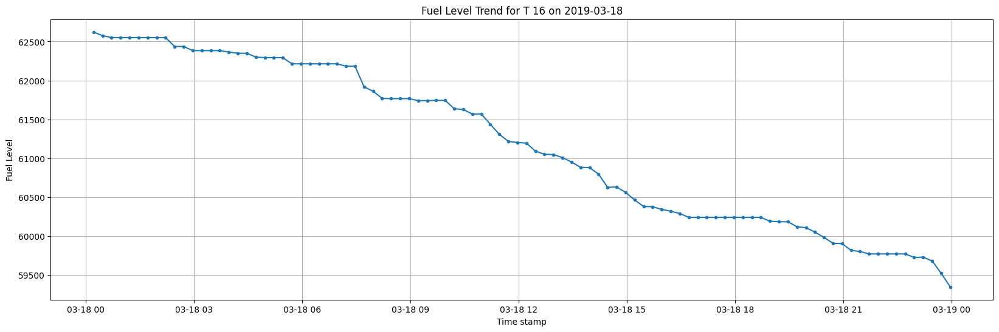

In [110]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 16", "2019-03-18")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [111]:
# 5. Organize and group the data
test_t16["Fuel Level Difference"].describe()

count     914.000000
mean    -1629.475930
std       797.012229
min     -3275.000000
25%     -2248.750000
50%     -1745.500000
75%     -1099.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [112]:
test_t16.groupby("Weekday").describe()

Fuel Level Difference                                            \
                          count         mean         std     min      25%   
Weekday                                                                     
Friday                    130.0 -1887.946154  765.412098 -3162.0 -2375.00   
Monday                    131.0 -1738.465649  765.275891 -3275.0 -2246.50   
Saturday                  130.0 -1113.284615  471.439363 -2146.0 -1411.75   
Sunday                    131.0  -931.236641  400.076470 -1752.0 -1179.00   
Thursday                  131.0 -1884.152672  783.459817 -3161.0 -2379.00   
Tuesday                   131.0 -1947.297710  786.606985 -3146.0 -2424.00   
Wednesday                 130.0 -1904.076923  778.903897 -3214.0 -2362.00   

                                 
              50%      75%  max  
Weekday                          
Friday    -2070.5 -1607.00  0.0  
Monday    -1964.0 -1408.50  0.0  
Saturday  -1192.0  -914.00  0.0  
Sunday     -969.0  -783.00  0.0  
Thursday  -2059.0 -1682.50  0.0  
Tuesday   -2126.0 -1705.50  0.0  
Wednesday -2061.0 -1695.75  0.0

In [113]:
test_t16.groupby("Is US Holiday").describe()

Fuel Level Difference                                            \
                              count         mean         std     min      25%   
Is US Holiday                                                                   
False                         890.0 -1622.397753  796.106371 -3275.0 -2244.75   
True                           24.0 -1891.958333  802.992148 -3043.0 -2425.00   

                                    
                  50%     75%  max  
Is US Holiday                       
False         -1736.0 -1095.0  0.0  
True          -2004.5 -1501.0  0.0

In [114]:
# 6. Organize and determine threshold

# First, consider refueling days. We can see that peak periods are mainly on weekdays,
# so it's the best day to refuel on Sundays to prevent shortages during workdays.

# Holidays are also a significant factor, so choose True

# There are no particularly obvious extremum value days (observing the min column),
# we choose to unify the two thresholds at 3300

# So, we obtain the parameters, and note the uniform variable names:
updated_test_t16 = update_fuel_data(
    test_t16,
    tank.loc[tank["Tank ID"] == "T 16", "Tank Type"].iloc[0],
    fuel_groups["T 16"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 16", "Tank Capacity"].iloc[0],
    3300,
    "Sunday",
    3300,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t16.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-1106.0,Saturday,False,0,5088.0,0.000000
2017-04-30,-821.0,Sunday,False,0,4267.0,0.000000
2017-05-01,-2475.0,Monday,False,0,1792.0,0.000000
2017-05-02,-2646.0,Tuesday,False,68208,67354.0,66019.504518
2017-05-03,-1832.0,Wednesday,False,0,65522.0,0.000000
2017-05-04,-1526.0,Thursday,False,0,63996.0,0.000000
2017-05-05,-2865.0,Friday,False,0,61131.0,0.000000


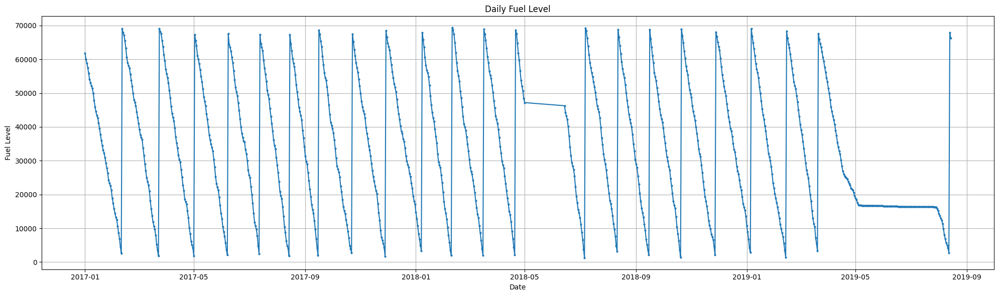

In [115]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t16)

In [116]:
# 8. Export the total Fuel cost
updated_test_t16["Fuel Cost"].sum()

1299439.464902396

In [117]:
# 9. Import the results
update_tank_df(
    "T 16", "Sunday", True, 3300, 3300, round(updated_test_t16["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,<NA>,<NA>,<NA>,<NA>,<NA>
8,T 18,2,3,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
9,T 19,2,4,D,70000,<NA>,<NA>,<NA>,<NA>,<NA>


## T 17

In [118]:
# 1. import functions to see the data
test_t17 = daily_fuel_sold("T 17")
test_t17

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-833.0,Sunday,False
2017-01-02,-4013.0,Monday,True
2017-01-03,-4664.0,Tuesday,False
2017-01-04,-3169.0,Wednesday,False
2017-01-05,-2271.0,Thursday,False
...,...,...,...
2019-08-11,-318.0,Sunday,False
2019-08-12,-1033.0,Monday,False
2019-08-13,-1170.0,Tuesday,False
2019-08-14,-1400.0,Wednesday,False


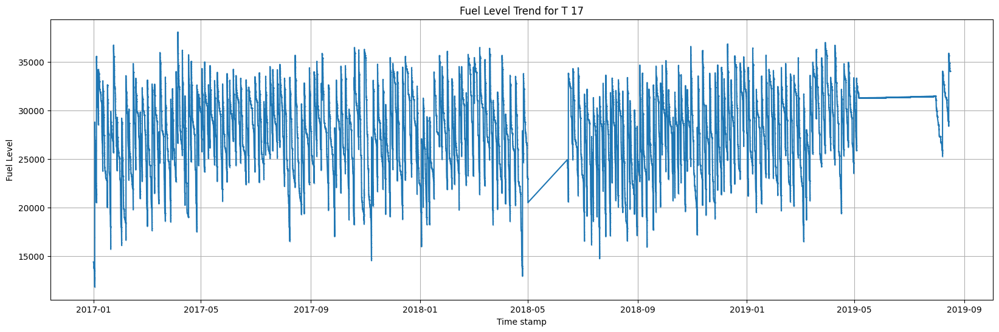

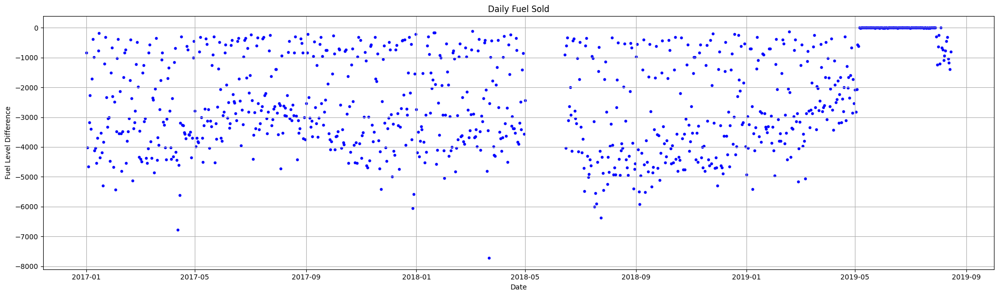

In [119]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 17")
plot_daily_fuel_sold(test_t17)

In [120]:
# 3. identify potentially problematic extremum values
test_t17[test_t17["Fuel Level Difference"] < -7000]

,Fuel Level Difference,Weekday,Is US Holiday
2018-03-22,-7715.0,Thursday,False


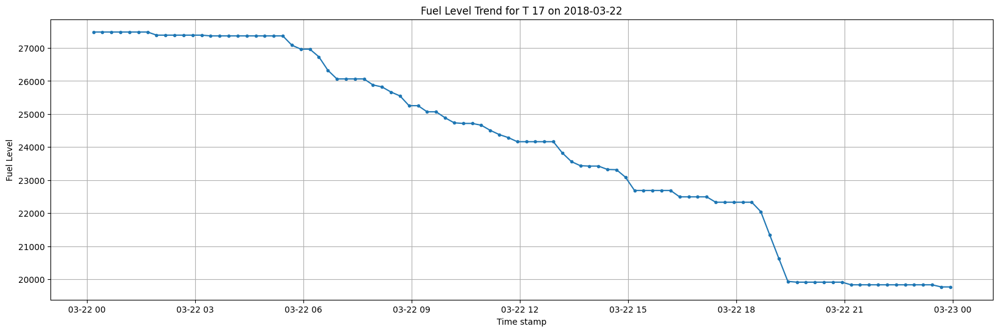

In [121]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 17", "2018-03-22")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [122]:
# 5. Organize and group the data
test_t17["Fuel Level Difference"].describe()

count     914.000000
mean    -2407.504376
std      1635.229215
min     -7715.000000
25%     -3717.000000
50%     -2695.000000
75%      -757.750000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [123]:
test_t17.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std     min      25%   
Weekday                                                                      
Friday                    130.0 -3088.984615  1404.487984 -5617.0 -4025.75   
Monday                    131.0 -2359.290076  1279.376053 -4595.0 -3259.50   
Saturday                  130.0 -1100.392308   723.704847 -3312.0 -1514.00   
Sunday                    131.0  -625.137405   667.024285 -3528.0  -732.00   
Thursday                  131.0 -3235.473282  1543.356160 -7715.0 -4330.50   
Tuesday                   131.0 -3273.305344  1535.508234 -6371.0 -4355.00   
Wednesday                 130.0 -3171.000000  1446.149263 -6772.0 -4109.75   

                                 
              50%      75%  max  
Weekday                          
Friday    -3327.5 -2633.25  0.0  
Monday    -2638.0 -1425.00  0.0  
Saturday   -977.0  -608.00  0.0  
Sunday     -465.0  -314.00  0.0  
Thursday  -3437.0 -2615.50  0.0  
Tuesday   -3615.0 -2735.50  0.0  
Wednesday -3478.5 -2644.75  0.0

In [124]:
test_t17.groupby("Is US Holiday").describe()

Fuel Level Difference                                    \
                              count         mean          std     min   
Is US Holiday                                                           
False                         890.0 -2397.280899  1636.278848 -7715.0   
True                           24.0 -2786.625000  1582.239300 -5418.0   

                                              
                   25%     50%      75%  max  
Is US Holiday                                 
False         -3705.25 -2695.0  -748.75  0.0  
True          -4151.25 -2661.0 -2106.50  0.0

In [125]:
# 6. Organize and determine threshold

updated_test_t17 = update_fuel_data(
    test_t17,
    tank.loc[tank["Tank ID"] == "T 17", "Tank Type"].iloc[0],
    fuel_groups["T 17"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 17", "Tank Capacity"].iloc[0],
    6000,
    "Sunday",
    7000,
    True,
)

# Use slicing to check if refueling follows the strategy
updated_test_t17.iloc[0:25]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-833.0,Sunday,False,0,14393.0,0.000000
2017-01-02,-4013.0,Monday,True,0,10380.0,0.000000
2017-01-03,-4664.0,Tuesday,False,0,5716.0,0.000000
2017-01-04,-3169.0,Wednesday,False,34284,36831.0,24705.517578
2017-01-05,-2271.0,Thursday,False,0,34560.0,0.000000
2017-01-06,-3397.0,Friday,False,0,31163.0,0.000000
2017-01-07,-1707.0,Saturday,False,0,29456.0,0.000000
2017-01-08,-386.0,Sunday,False,0,29070.0,0.000000
2017-01-09,-988.0,Monday,False,0,28082.0,0.000000
2017-01-10,-4122.0,Tuesday,False,0,23960.0,0.000000


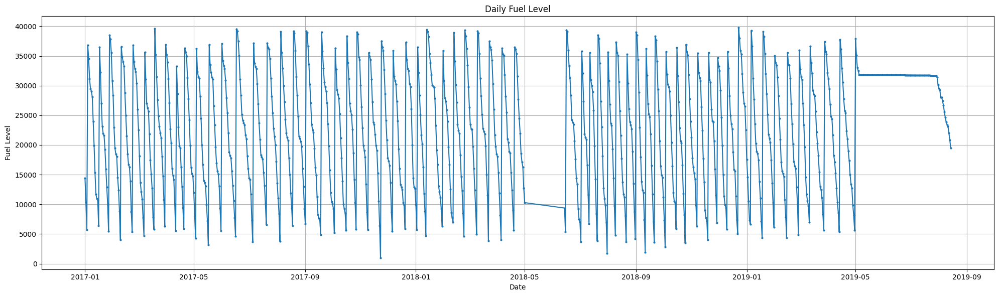

In [126]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t17)

In [127]:
# 8. Export the total Fuel cost
updated_test_t17["Fuel Cost"].sum()

1802083.7023162139

In [128]:
# 9. Import the results
update_tank_df(
    "T 17", "Sunday", True, 6000, 7000, round(updated_test_t17["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,<NA>,<NA>,<NA>,<NA>,<NA>
9,T 19,2,4,D,70000,<NA>,<NA>,<NA>,<NA>,<NA>


## T18

In [129]:
# 1. import functions to see the data
test_t18 = daily_fuel_sold("T 18")
test_t18

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-886.0,Sunday,False
2017-01-02,-3002.0,Monday,True
2017-01-03,-1807.0,Tuesday,False
2017-01-04,-2143.0,Wednesday,False
2017-01-05,-2846.0,Thursday,False
...,...,...,...
2019-08-11,-378.0,Sunday,False
2019-08-12,-1318.0,Monday,False
2019-08-13,-1446.0,Tuesday,False
2019-08-14,-1362.0,Wednesday,False


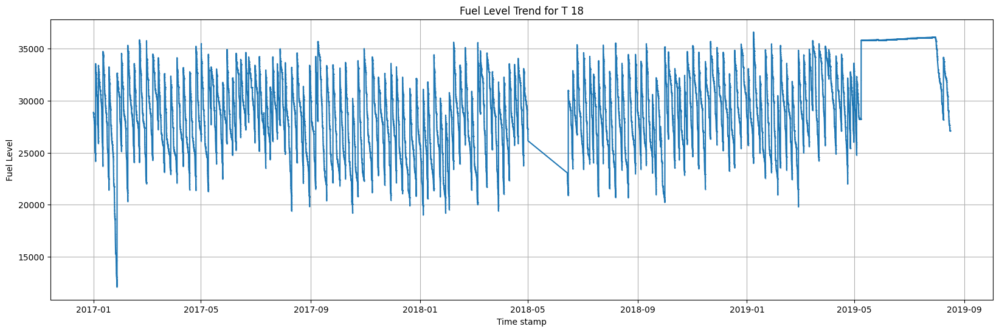

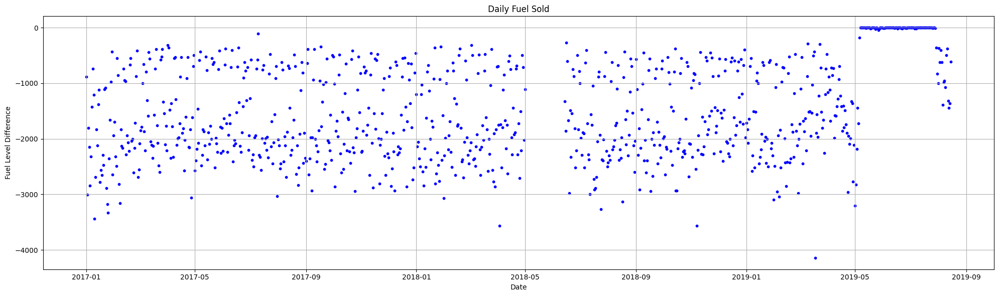

In [130]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 18")
plot_daily_fuel_sold(test_t18)

In [131]:
# 3. identify potentially problematic extremum values
test_t18[test_t18["Fuel Level Difference"] < -3500]

,Fuel Level Difference,Weekday,Is US Holiday
2018-04-03,-3562.0,Tuesday,False
2018-11-07,-3565.0,Wednesday,False
2019-03-18,-4141.0,Monday,False


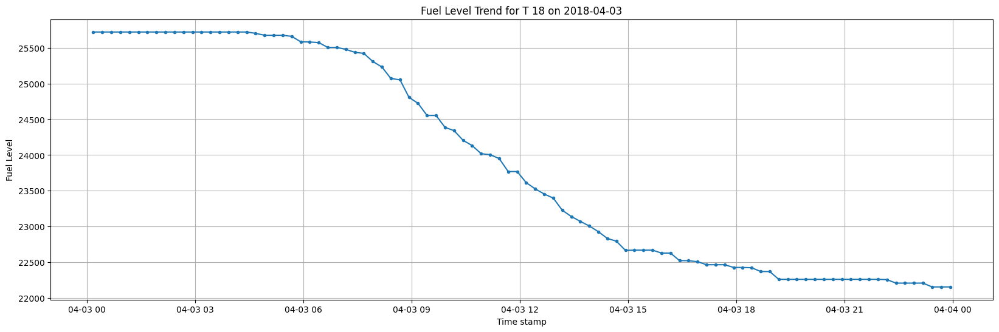

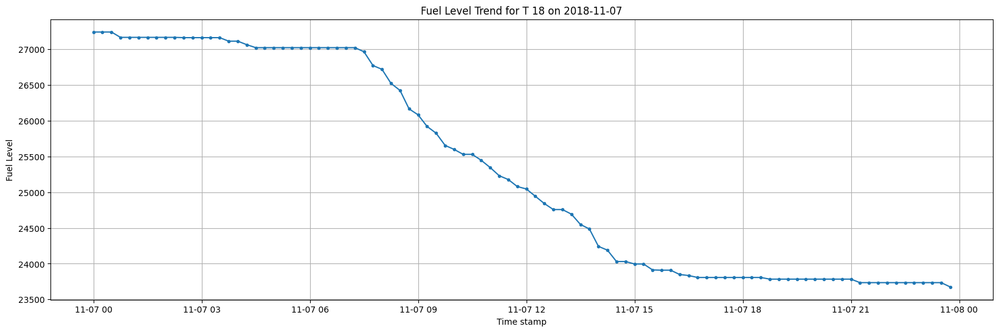

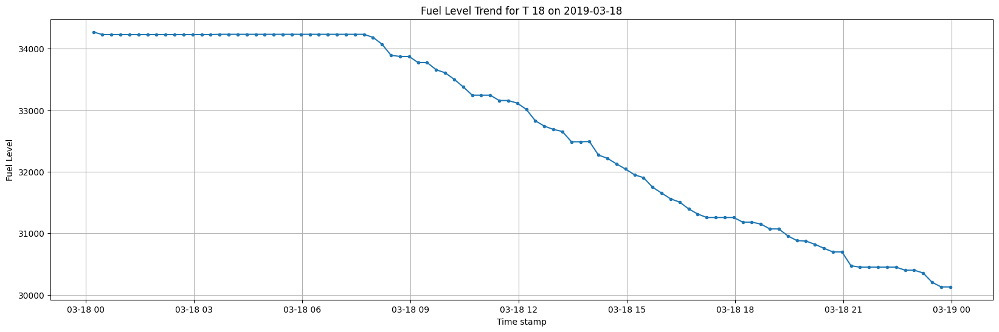

In [132]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 18", "2018-04-03")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 18", "2018-11-07")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 18", "2019-03-18")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [133]:
# 5. Organize and group the data
test_t18["Fuel Level Difference"].describe()

count     914.000000
mean    -1496.520788
std       870.710763
min     -4141.000000
25%     -2195.750000
50%     -1686.000000
75%      -705.750000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [134]:
test_t18.groupby("Weekday").describe()

Fuel Level Difference                                           \
                          count         mean         std     min     25%   
Weekday                                                                    
Friday                    130.0 -1737.561538  707.072828 -3134.0 -2200.5   
Monday                    131.0 -1768.122137  849.471592 -4141.0 -2348.5   
Saturday                  130.0  -735.600000  341.853670 -1749.0  -930.0   
Sunday                    131.0  -576.442748  298.382155 -1742.0  -721.5   
Thursday                  131.0 -1876.839695  775.916528 -3096.0 -2324.5   
Tuesday                   131.0 -1918.183206  806.663745 -3562.0 -2353.0   
Wednesday                 130.0 -1861.715385  794.400532 -3565.0 -2347.0   

                                 
              50%      75%  max  
Weekday                          
Friday    -1858.5 -1565.75  0.0  
Monday    -1976.0 -1281.50  0.0  
Saturday   -748.0  -564.00  0.0  
Sunday     -556.0  -414.50  0.0  
Thursday  -2067.0 -1681.00  0.0  
Tuesday   -2103.0 -1653.00  0.0  
Wednesday -1989.5 -1585.25  0.0

In [135]:
test_t18.groupby("Is US Holiday").describe()

Fuel Level Difference                                            \
                              count         mean         std     min      25%   
Is US Holiday                                                                   
False                         890.0 -1488.813483  871.417733 -4141.0 -2187.00   
True                           24.0 -1782.333333  809.910713 -3002.0 -2286.25   

                                     
                  50%      75%  max  
Is US Holiday                        
False         -1681.0  -697.75  0.0  
True          -1947.5 -1318.25  0.0

In [136]:
# 6. Organize and determine threshold

updated_test_t18 = update_fuel_data(
    test_t18,
    tank.loc[tank["Tank ID"] == "T 18", "Tank Type"].iloc[0],
    fuel_groups["T 18"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 18", "Tank Capacity"].iloc[0],
    3500,
    "Sunday",
    4000,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t16.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-1106.0,Saturday,False,0,5088.0,0.000000
2017-04-30,-821.0,Sunday,False,0,4267.0,0.000000
2017-05-01,-2475.0,Monday,False,0,1792.0,0.000000
2017-05-02,-2646.0,Tuesday,False,68208,67354.0,66019.504518
2017-05-03,-1832.0,Wednesday,False,0,65522.0,0.000000
2017-05-04,-1526.0,Thursday,False,0,63996.0,0.000000
2017-05-05,-2865.0,Friday,False,0,61131.0,0.000000


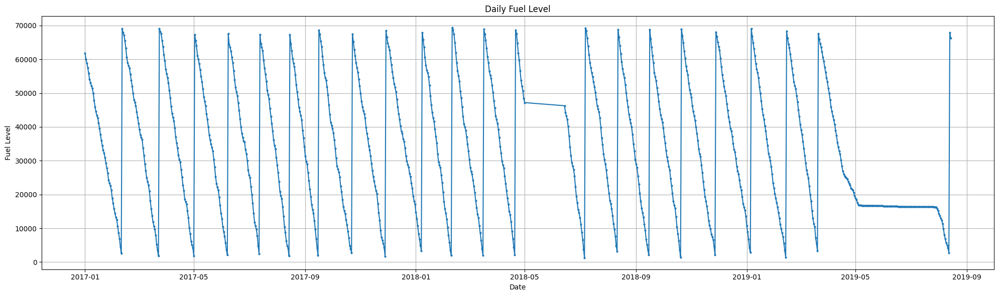

In [137]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t16)

In [138]:
# 8. Export the total Fuel cost
updated_test_t18["Fuel Cost"].sum()

1197326.768798539

In [139]:
# 9. Import the results
update_tank_df(
    "T 18", "Sunday", True, 3500, 4000, round(updated_test_t18["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,<NA>,<NA>,<NA>,<NA>,<NA>


## T19

In [140]:
# 1. import functions to see the data
test_t19 = daily_fuel_sold("T 19")
test_t19

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-988.0,Sunday,False
2017-01-02,-2644.0,Monday,True
2017-01-03,-4267.0,Tuesday,False
2017-01-04,-2661.0,Wednesday,False
2017-01-05,-2460.0,Thursday,False
...,...,...,...
2019-08-11,-594.0,Sunday,False
2019-08-12,-1825.0,Monday,False
2019-08-13,-2824.0,Tuesday,False
2019-08-14,-3451.0,Wednesday,False


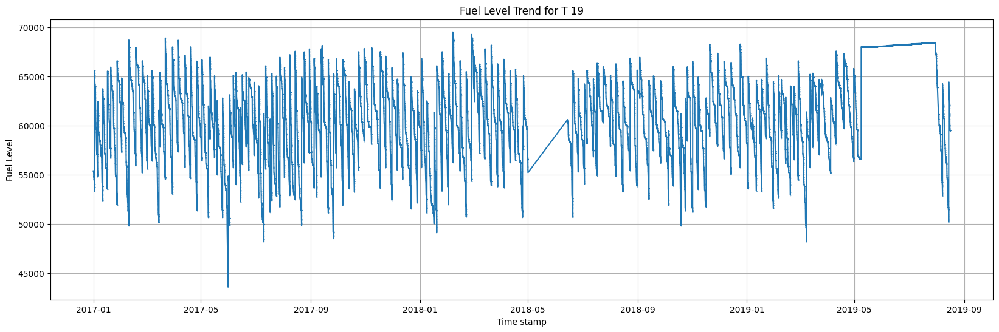

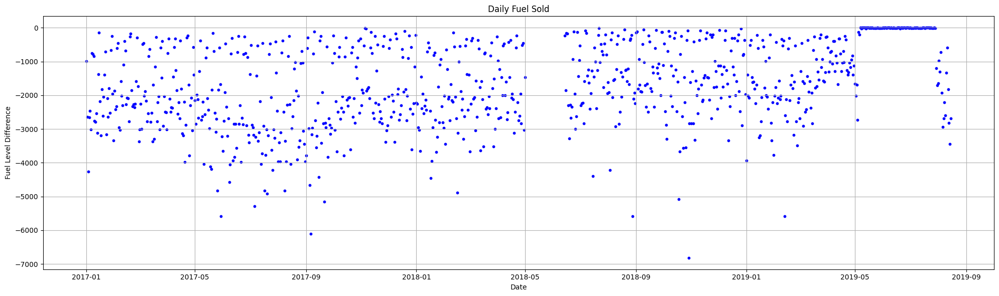

In [141]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 19")
plot_daily_fuel_sold(test_t19)

In [142]:
# 3. identify potentially problematic extremum values
test_t19[test_t19["Fuel Level Difference"] < -6000]

,Fuel Level Difference,Weekday,Is US Holiday
2017-09-06,-6110.0,Wednesday,False
2018-10-29,-6817.0,Monday,False


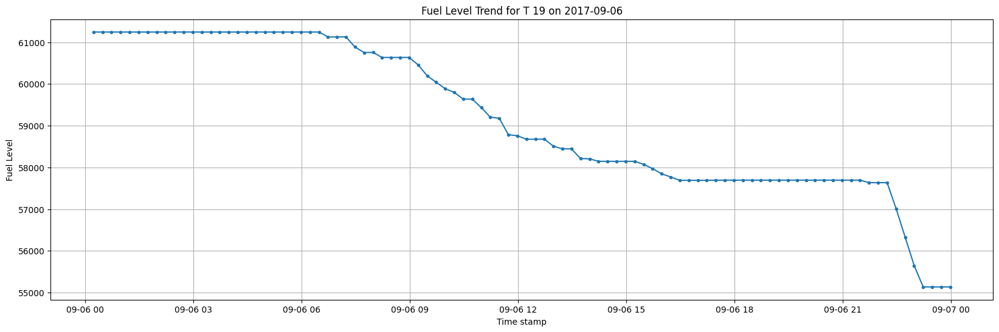

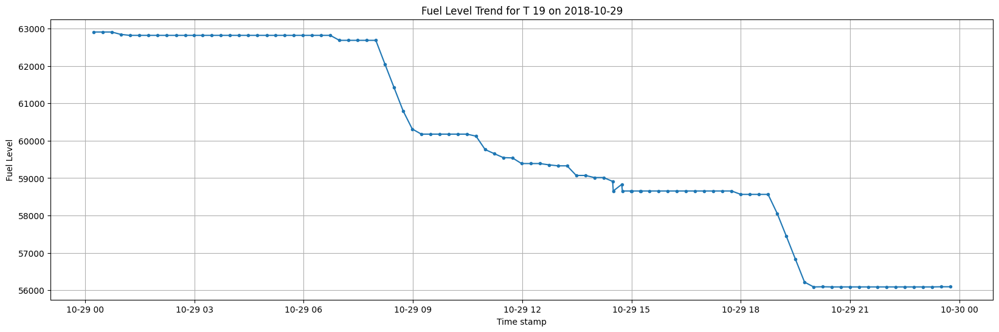

In [143]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 19", "2017-09-06")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 19", "2018-10-29")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [144]:
# 5. Organize and group the data
test_t19["Fuel Level Difference"].describe()

count     914.000000
mean    -1670.939825
std      1226.826788
min     -6817.000000
25%     -2534.500000
50%     -1686.500000
75%      -531.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [145]:
test_t19.groupby("Weekday").describe()

Fuel Level Difference                                             \
                          count         mean          std     min      25%   
Weekday                                                                      
Friday                    130.0 -2233.053846  1079.582013 -4822.0 -2961.25   
Monday                    131.0 -1779.091603  1087.421477 -6817.0 -2402.00   
Saturday                  130.0  -759.184615   580.339914 -2953.0 -1044.75   
Sunday                    131.0  -430.755725   543.243706 -4395.0  -522.00   
Thursday                  131.0 -2223.832061  1208.000880 -5285.0 -2845.00   
Tuesday                   131.0 -2206.274809  1247.177682 -5588.0 -2977.00   
Wednesday                 130.0 -2064.723077  1065.505514 -6110.0 -2713.50   

                                 
              50%      75%  max  
Weekday                          
Friday    -2339.5 -1610.00  0.0  
Monday    -1889.0 -1071.50  0.0  
Saturday   -662.5  -363.25  0.0  
Sunday     -314.0  -151.50  0.0  
Thursday  -2207.0 -1686.50  0.0  
Tuesday   -2256.0 -1398.50  0.0  
Wednesday -2156.0 -1541.00  0.0

In [146]:
test_t19.groupby("Is US Holiday").describe()

Fuel Level Difference                                            \
                              count         mean          std     min     25%   
Is US Holiday                                                                   
False                         890.0 -1664.986517  1231.916180 -6817.0 -2534.5   
True                           24.0 -1891.708333  1017.172401 -3937.0 -2521.0   

                                     
                  50%      75%  max  
Is US Holiday                        
False         -1669.0  -527.00  0.0  
True          -2116.5 -1681.25 -4.0

In [147]:
# 6. Organize and determine threshold

updated_test_t19 = update_fuel_data(
    test_t19,
    tank.loc[tank["Tank ID"] == "T 19", "Tank Type"].iloc[0],
    fuel_groups["T 19"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 19", "Tank Capacity"].iloc[0],
    5500,
    "Sunday",
    6000,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t19.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-571.0,Saturday,False,0,23128.0,0.0
2017-04-30,-1397.0,Sunday,False,0,21731.0,0.0
2017-05-01,-2158.0,Monday,False,0,19573.0,0.0
2017-05-02,-2847.0,Tuesday,False,0,16726.0,0.0
2017-05-03,-1987.0,Wednesday,False,0,14739.0,0.0
2017-05-04,-2124.0,Thursday,False,0,12615.0,0.0
2017-05-05,-2673.0,Friday,False,0,9942.0,0.0


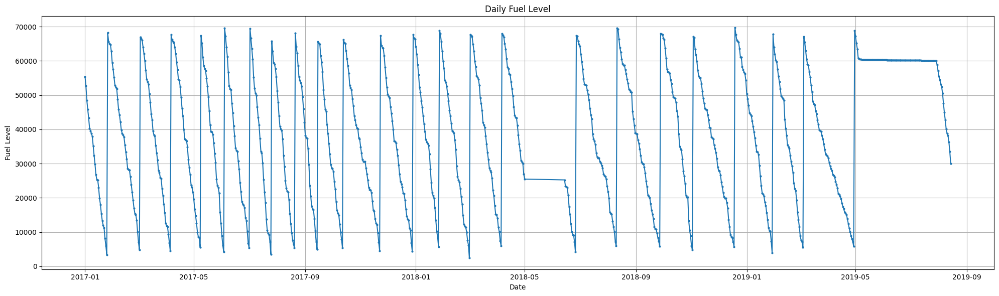

In [148]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t19)

In [149]:
# 8. Export the total Fuel cost
updated_test_t19["Fuel Cost"].sum()

1207883.248986893

In [150]:
# 9. Import the results
update_tank_df(
    "T 19", "Sunday", True, 5500, 6000, round(updated_test_t19["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T20

In [151]:
# 1. import functions to see the data
test_t20 = daily_fuel_sold("T 20")
test_t20

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,0.0,Sunday,False
2017-01-02,-1431.0,Monday,True
2017-01-03,-885.0,Tuesday,False
2017-01-04,-1999.0,Wednesday,False
2017-01-05,-1083.0,Thursday,False
...,...,...,...
2019-08-11,0.0,Sunday,False
2019-08-12,-118.0,Monday,False
2019-08-13,0.0,Tuesday,False
2019-08-14,0.0,Wednesday,False


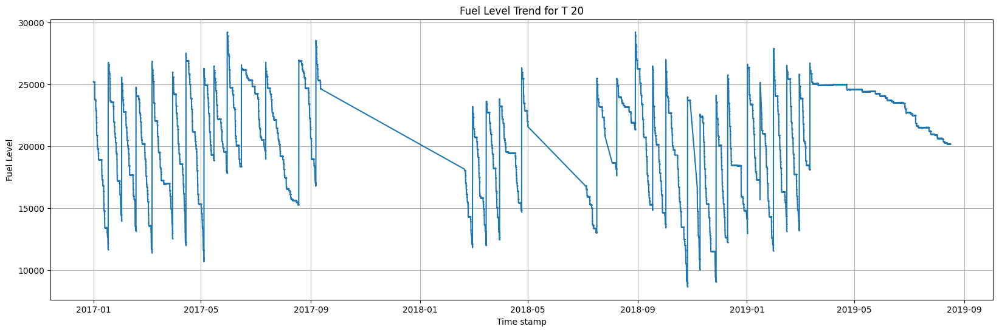

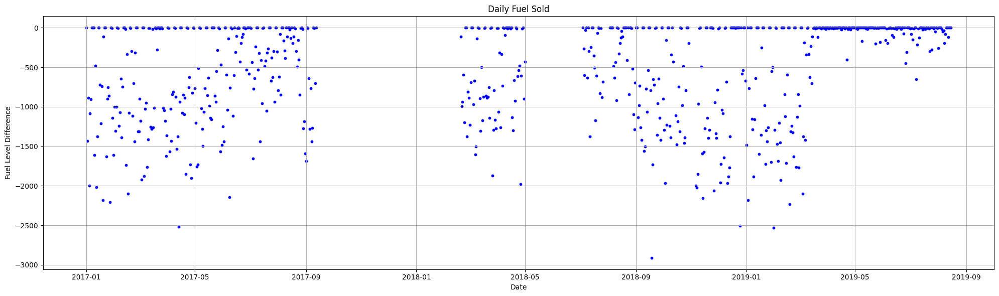

In [152]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 20")
plot_daily_fuel_sold(test_t20)

In [153]:
# 3. identify potentially problematic extremum values
test_t20[test_t20["Fuel Level Difference"] < -2500]

,Fuel Level Difference,Weekday,Is US Holiday
2017-04-13,-2517.0,Thursday,False
2018-09-18,-2911.0,Tuesday,False
2018-12-25,-2506.0,Tuesday,True
2019-01-31,-2529.0,Thursday,False


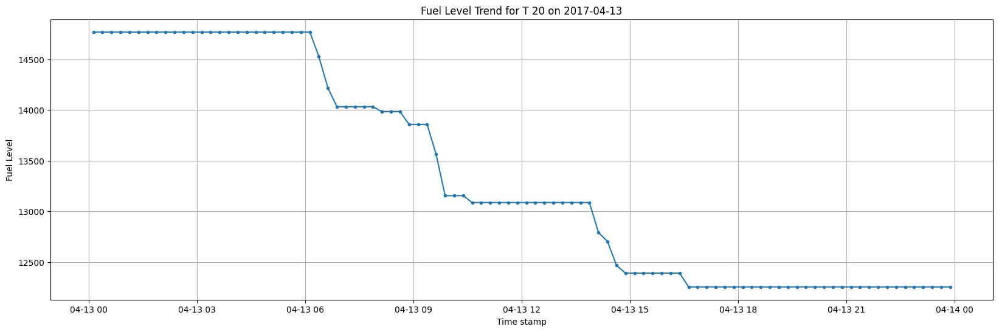

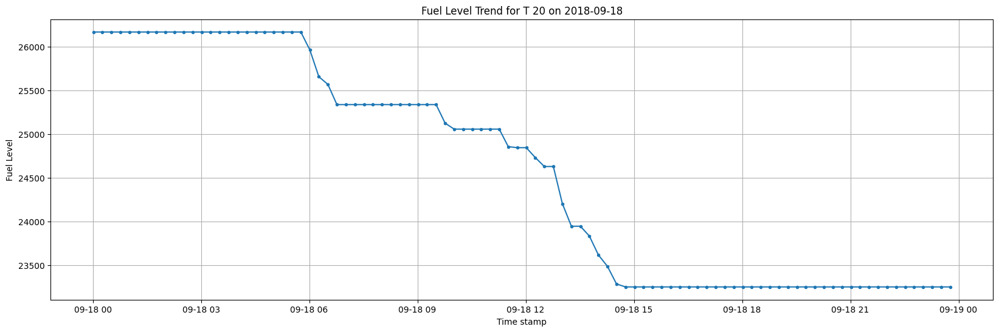

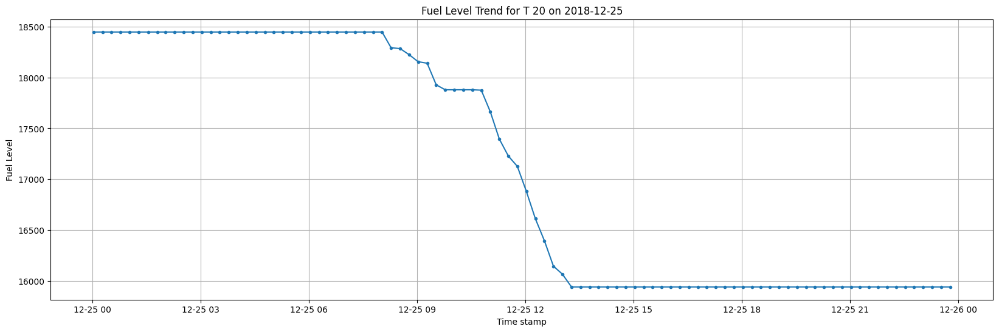

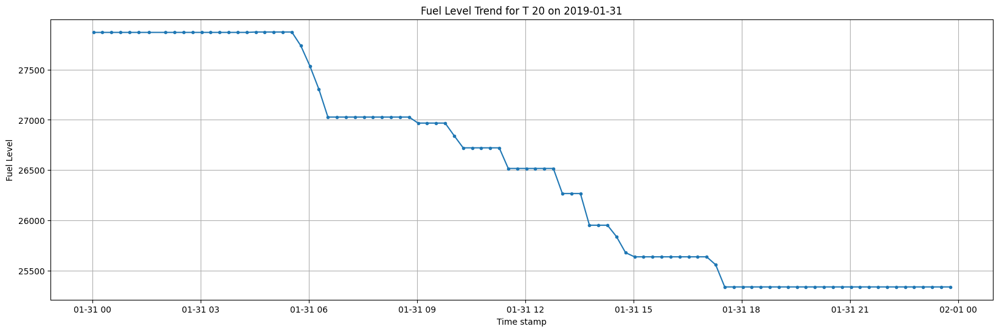

In [154]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 20", "2017-04-13")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 20", "2018-09-18")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 20", "2018-12-25")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 20", "2019-01-31")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [155]:
# 5. Organize and group the data
test_t20["Fuel Level Difference"].describe()

count     718.000000
mean     -516.566852
std       632.066247
min     -2911.000000
25%      -983.250000
50%      -146.000000
75%         0.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [156]:
test_t20.groupby("Weekday").describe()

Fuel Level Difference                                           \
                          count        mean         std     min      25%   
Weekday                                                                    
Friday                    102.0 -652.323529  575.366042 -2210.0 -1011.25   
Monday                    104.0 -644.384615  622.781348 -2233.0 -1086.50   
Saturday                  101.0   -1.594059    4.214684   -27.0     0.00   
Sunday                    102.0   -1.764706    3.327582   -16.0    -3.75   
Thursday                  103.0 -833.456311  716.635559 -2529.0 -1389.50   
Tuesday                   104.0 -776.076923  650.574708 -2911.0 -1284.00   
Wednesday                 102.0 -690.617647  623.372861 -2154.0 -1176.00   

                               
             50%     75%  max  
Weekday                        
Friday    -666.0  -79.25  0.0  
Monday    -603.5  -12.00  0.0  
Saturday     0.0    0.00  0.0  
Sunday       0.0    0.00  0.0  
Thursday  -700.0 -138.50  0.0  
Tuesday   -733.0 -120.25  0.0  
Wednesday -644.0  -11.25  0.0

In [157]:
test_t20.groupby("Is US Holiday").describe()

Fuel Level Difference                                           \
                              count        mean         std     min      25%   
Is US Holiday                                                                  
False                         700.0 -506.067143  624.924744 -2911.0  -959.25   
True                           18.0 -924.888889  781.690166 -2506.0 -1470.75   

                                   
                 50%     75%  max  
Is US Holiday                      
False         -123.5    0.00  0.0  
True          -853.5 -187.75  0.0

In [158]:
# 6. Organize and determine threshold

updated_test_t20 = update_fuel_data(
    test_t20,
    tank.loc[tank["Tank ID"] == "T 20", "Tank Type"].iloc[0],
    fuel_groups["T 20"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 20", "Tank Capacity"].iloc[0],
    2300,
    "Saturday",
    2500,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t20.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,0.0,Saturday,False,0,17457.0,0.0
2017-04-30,-4.0,Sunday,False,0,17453.0,0.0
2017-05-01,-768.0,Monday,False,0,16685.0,0.0
2017-05-02,-1204.0,Tuesday,False,0,15481.0,0.0
2017-05-03,-1757.0,Wednesday,False,0,13724.0,0.0
2017-05-04,-1733.0,Thursday,False,0,11991.0,0.0
2017-05-05,-515.0,Friday,False,0,11476.0,0.0


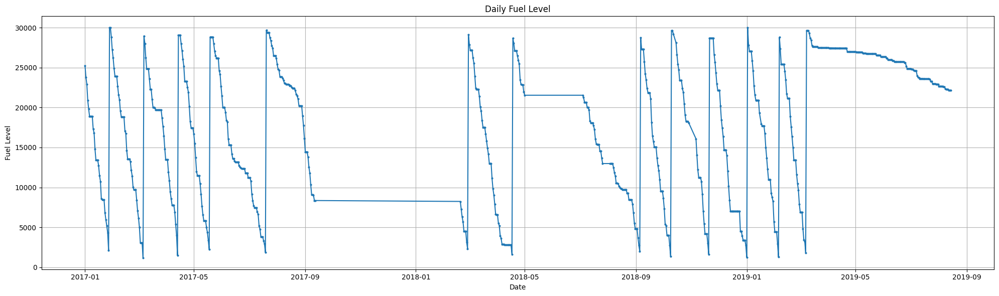

In [159]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t20)

In [160]:
# 8. Export the total Fuel cost
updated_test_t20["Fuel Cost"].sum()

316108.1266912876

In [161]:
# 9. Import the results
update_tank_df(
    "T 20", "Saturday", True, 2300, 2500, round(updated_test_t20["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T22

In [162]:
# 1. import functions to see the data
test_t22 = daily_fuel_sold("T 22")
test_t22

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4.0,Sunday,False
2017-01-02,-2403.0,Monday,True
2017-01-03,-3150.0,Tuesday,False
2017-01-04,-2222.0,Wednesday,False
2017-01-05,-2249.0,Thursday,False
...,...,...,...
2019-08-11,-4.0,Sunday,False
2019-08-12,-2415.0,Monday,False
2019-08-13,-2548.0,Tuesday,False
2019-08-14,-2381.0,Wednesday,False


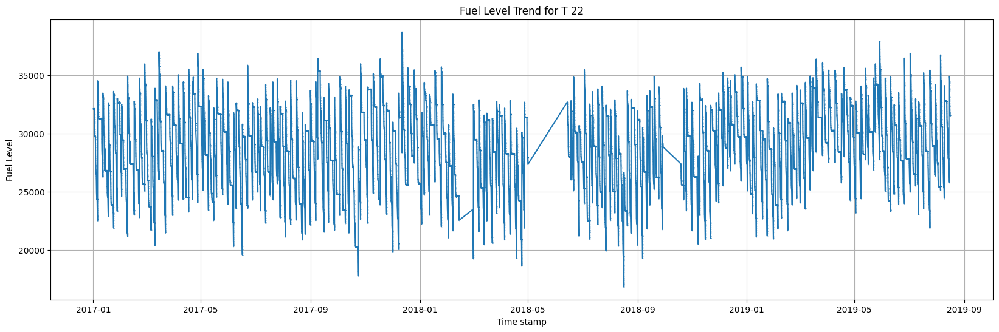

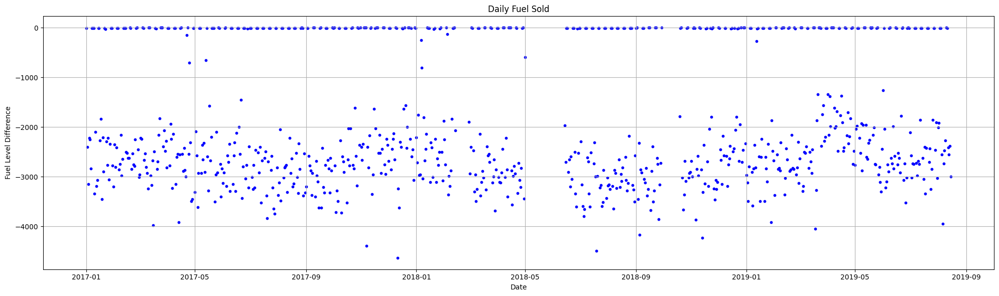

In [163]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 22")
plot_daily_fuel_sold(test_t22)

In [164]:
# 3. identify potentially problematic extremum values
test_t22[test_t22["Fuel Level Difference"] < -4500]

,Fuel Level Difference,Weekday,Is US Holiday
2017-12-11,-4629.0,Monday,False


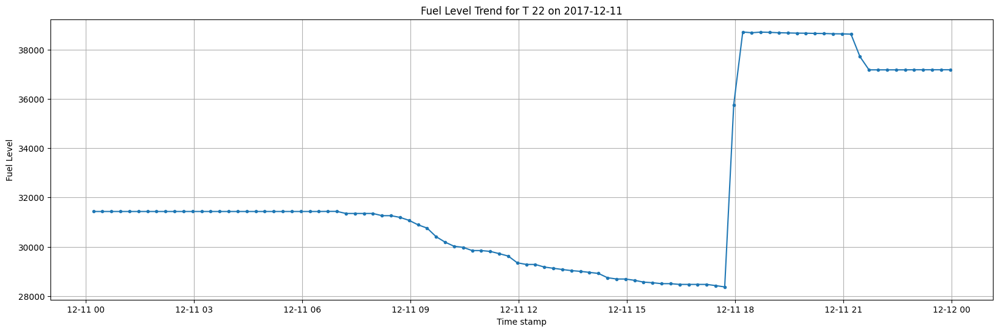

In [165]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 22", "2017-12-11")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [166]:
# 5. Organize and group the data
test_t22["Fuel Level Difference"].describe()

count     881.000000
mean    -1880.434733
std      1343.830250
min     -4629.000000
25%     -2911.000000
50%     -2441.000000
75%        -8.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [167]:
test_t22.groupby("Weekday").describe()

Fuel Level Difference                                            \
                          count         mean         std     min      25%   
Weekday                                                                     
Friday                    126.0 -2556.444444  684.711379 -3744.0 -2934.25   
Monday                    126.0 -2474.277778  965.667078 -4629.0 -3009.75   
Saturday                  126.0   -24.579365  129.219092 -1256.0    -7.00   
Sunday                    126.0   -11.706349   72.381773  -806.0    -7.00   
Thursday                  126.0 -2765.801587  675.783066 -4493.0 -3193.00   
Tuesday                   126.0 -2714.563492  721.633619 -4388.0 -3165.25   
Wednesday                 125.0 -2621.552000  683.907458 -4164.0 -3070.00   

                                 
              50%      75%  max  
Weekday                          
Friday    -2665.0 -2312.75  0.0  
Monday    -2663.5 -2299.50  0.0  
Saturday     -4.0     0.00  0.0  
Sunday       -4.0     0.00  0.0  
Thursday  -2811.5 -2425.75 -3.0  
Tuesday   -2772.5 -2490.50  0.0  
Wednesday -2684.0 -2306.00  0.0

In [168]:
test_t22.groupby("Is US Holiday").describe()

Fuel Level Difference                                    \
                              count         mean          std     min   
Is US Holiday                                                           
False                         859.0 -1864.852154  1349.675132 -4629.0   
True                           22.0 -2488.863636   922.445161 -3596.0   

                                             
                   25%     50%     75%  max  
Is US Holiday                                
False         -2911.00 -2441.0    -8.0  0.0  
True          -2946.25 -2738.5 -2249.0 -4.0

In [169]:
# 6. Organize and determine threshold

updated_test_t22 = update_fuel_data(
    test_t22,
    tank.loc[tank["Tank ID"] == "T 22", "Tank Type"].iloc[0],
    fuel_groups["T 22"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 22", "Tank Capacity"].iloc[0],
    4000,
    "Sunday",
    4500,
    True,
)

# Use slicing to check if refueling follows the strategy
updated_test_t16.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-1106.0,Saturday,False,0,5088.0,0.000000
2017-04-30,-821.0,Sunday,False,0,4267.0,0.000000
2017-05-01,-2475.0,Monday,False,0,1792.0,0.000000
2017-05-02,-2646.0,Tuesday,False,68208,67354.0,66019.504518
2017-05-03,-1832.0,Wednesday,False,0,65522.0,0.000000
2017-05-04,-1526.0,Thursday,False,0,63996.0,0.000000
2017-05-05,-2865.0,Friday,False,0,61131.0,0.000000


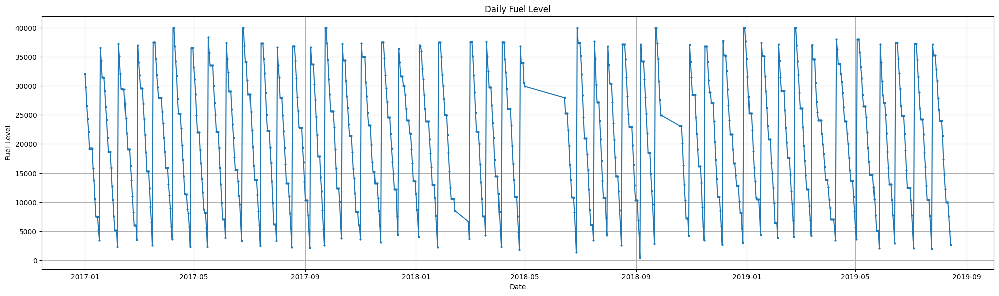

In [170]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t22)

In [171]:
# 8. Export the total Fuel cost
updated_test_t22["Fuel Cost"].sum()

1388584.4907067008

In [172]:
# 9. Import the results
update_tank_df(
    "T 22", "Sunday", True, 4000, 4500, round(updated_test_t22["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T23

In [173]:
# 1. import functions to see the data
test_t23 = daily_fuel_sold("T 23")
test_t23

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-12.0,Sunday,False
2017-01-02,-3763.0,Monday,True
2017-01-03,-2502.0,Tuesday,False
2017-01-04,-2958.0,Wednesday,False
2017-01-05,-3092.0,Thursday,False
...,...,...,...
2019-08-11,-3.0,Sunday,False
2019-08-12,-4331.0,Monday,False
2019-08-13,-3119.0,Tuesday,False
2019-08-14,-2567.0,Wednesday,False


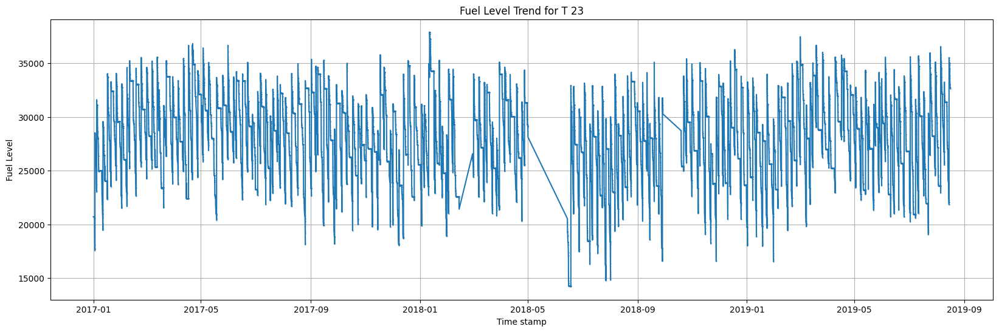

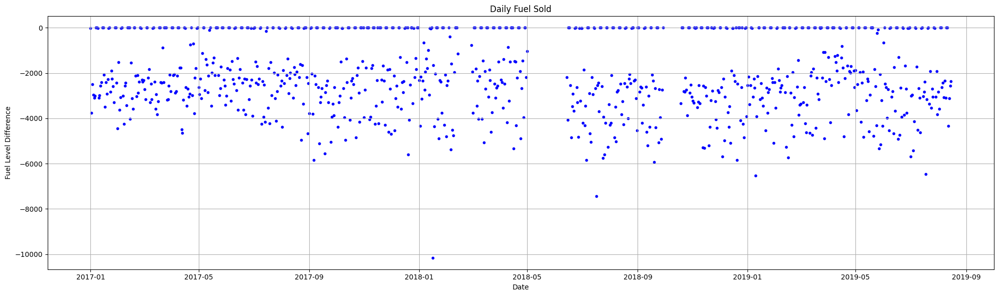

In [174]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 23")
plot_daily_fuel_sold(test_t23)

In [175]:
# 3. identify potentially problematic extremum values
test_t23[test_t23["Fuel Level Difference"] < -6200]

,Fuel Level Difference,Weekday,Is US Holiday
2018-01-16,-10160.0,Tuesday,False
2018-07-17,-7446.0,Tuesday,False
2019-01-10,-6526.0,Thursday,False
2019-07-18,-6454.0,Thursday,False


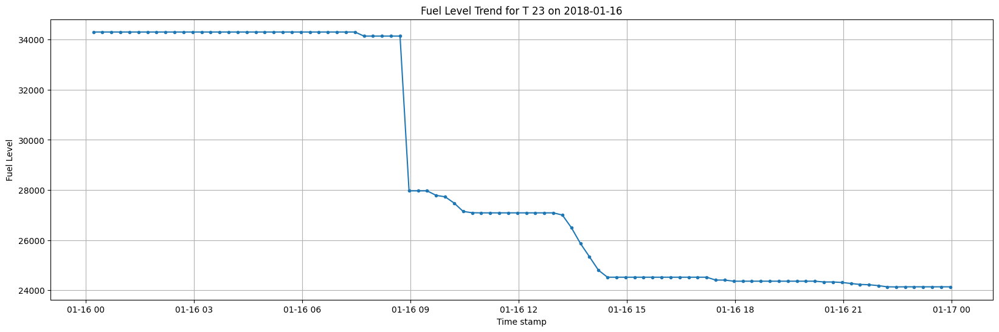

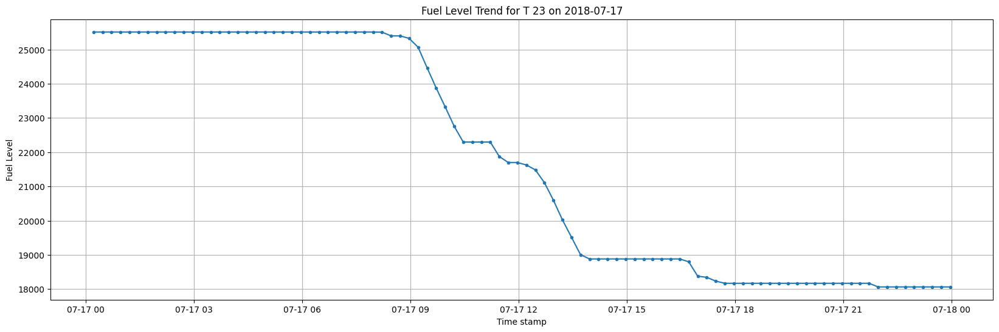

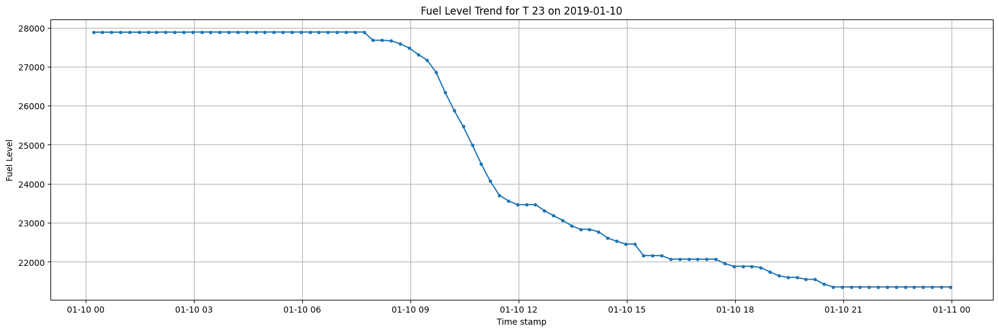

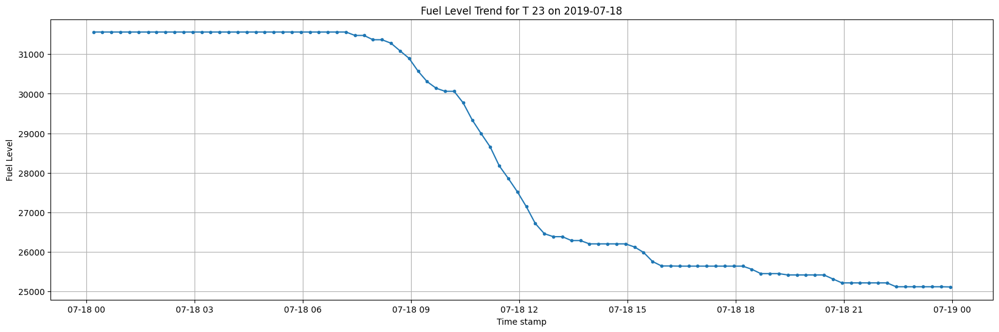

In [176]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 23", "2018-01-16")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 23", "2018-07-17")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 23", "2019-01-10")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 23", "2019-07-18")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [177]:
# 5. Organize and group the data
test_t23["Fuel Level Difference"].describe()

count      881.000000
mean     -2077.068104
std       1688.380913
min     -10160.000000
25%      -3172.000000
50%      -2297.000000
75%         -7.000000
max          0.000000
Name: Fuel Level Difference, dtype: float64

In [178]:
test_t23.groupby("Weekday").describe()

Fuel Level Difference                                              \
                          count         mean          std      min      25%   
Weekday                                                                       
Friday                    126.0 -2903.738095  1079.919739  -5841.0 -3584.00   
Monday                    126.0 -2699.619048  1401.940939  -5693.0 -3423.75   
Saturday                  126.0   -40.246032   216.467704  -2135.0    -7.00   
Sunday                    126.0   -28.325397   246.718068  -2748.0    -4.00   
Thursday                  126.0 -2920.277778  1189.481949  -6526.0 -3394.50   
Tuesday                   126.0 -2890.722222  1412.977637 -10160.0 -3614.75   
Wednesday                 125.0 -3064.384000  1256.666839  -5936.0 -3955.00   

                                 
              50%      75%  max  
Weekday                          
Friday    -2933.5 -2271.25  0.0  
Monday    -2616.0 -2007.75  0.0  
Saturday     -4.0     0.00  0.0  
Sunday       -3.0     0.00  0.0  
Thursday  -2716.0 -2282.75  0.0  
Tuesday   -2630.5 -2052.00  0.0  
Wednesday -2892.0 -2252.00  0.0

In [179]:
test_t23.groupby("Is US Holiday").describe()

Fuel Level Difference                                     \
                              count         mean          std      min   
Is US Holiday                                                            
False                         859.0 -2057.123399  1689.636552 -10160.0   
True                           22.0 -2855.818182  1470.195246  -5413.0   

                                             
                   25%     50%     75%  max  
Is US Holiday                                
False         -3166.50 -2271.0    -4.0  0.0  
True          -3654.75 -2581.5 -2171.5  0.0

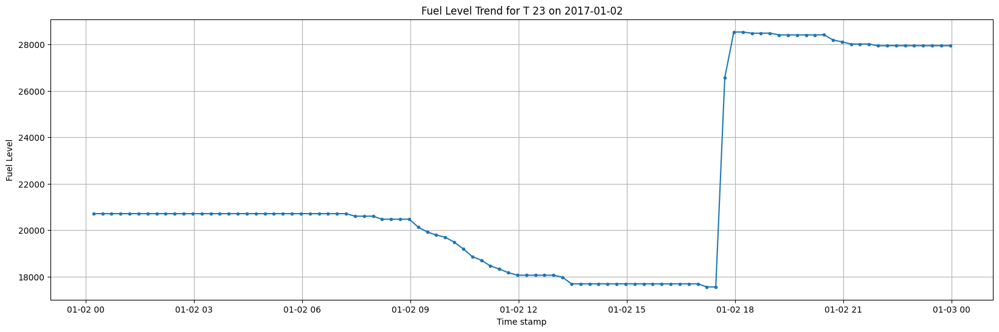

In [180]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 23", "2017-01-02")

In [181]:
# 6. Organize and determine threshold

updated_test_t23 = update_fuel_data(
    test_t23,
    tank.loc[tank["Tank ID"] == "T 23", "Tank Type"].iloc[0],
    fuel_groups["T 23"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 23", "Tank Capacity"].iloc[0],
    6000,
    "Sunday",
    6500,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t23.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-8.0,Saturday,False,0,35998.0,0.0
2017-04-30,-3.0,Sunday,False,0,35995.0,0.0
2017-05-01,-2639.0,Monday,False,0,33356.0,0.0
2017-05-02,-2949.0,Tuesday,False,0,30407.0,0.0
2017-05-03,-2256.0,Wednesday,False,0,28151.0,0.0
2017-05-04,-3123.0,Thursday,False,0,25028.0,0.0
2017-05-05,-1124.0,Friday,False,0,23904.0,0.0


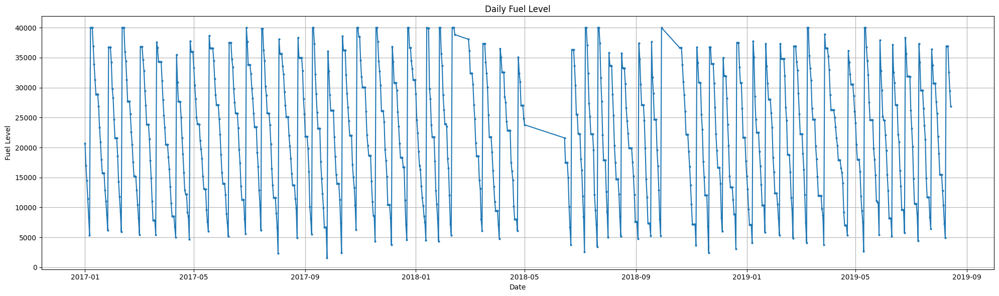

In [182]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t23)

In [183]:
# 8. Export the total Fuel cost
updated_test_t23["Fuel Cost"].sum()

1411101.7683383208

In [184]:
# 9. Import the results
update_tank_df(
    "T 23", "Sunday", True, 6000, 6500, round(updated_test_t23["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


T24

In [185]:
# 1. import functions to see the data
test_t24 = daily_fuel_sold("T 24")
test_t24[:30]

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-8.0,Sunday,False
2017-01-02,-2459.0,Monday,True
2017-01-03,-1904.0,Tuesday,False
2017-01-04,-1825.0,Wednesday,False
2017-01-05,-1343.0,Thursday,False
2017-01-06,-1528.0,Friday,False
2017-01-07,0.0,Saturday,False
2017-01-08,-15.0,Sunday,False
2017-01-09,-15.0,Monday,False
2017-01-10,-1862.0,Tuesday,False


In [186]:
fuel_groups["T 24"][2100:2120]

,Tank ID,Fuel Level,Time stamp
579525,T 24,12114.0,2017-01-31 19:41:00
579526,T 24,12114.0,2017-01-31 20:11:00
579527,T 24,12053.0,2017-01-31 20:26:00
579528,T 24,12034.0,2017-01-31 20:56:00
579529,T 24,12031.0,2017-01-31 21:11:00
579530,T 24,12031.0,2017-01-31 21:41:00
579531,T 24,12031.0,2017-01-31 21:56:00
579532,T 24,12031.0,2017-01-31 22:26:00
579533,T 24,12031.0,2017-01-31 22:41:00
579534,T 24,12031.0,2017-01-31 23:11:00


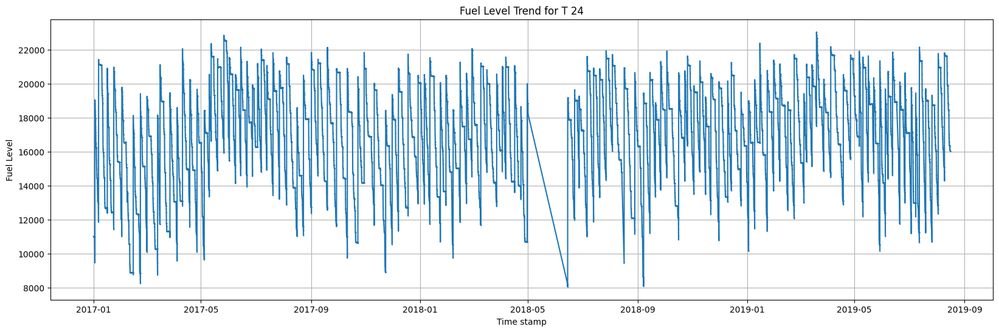

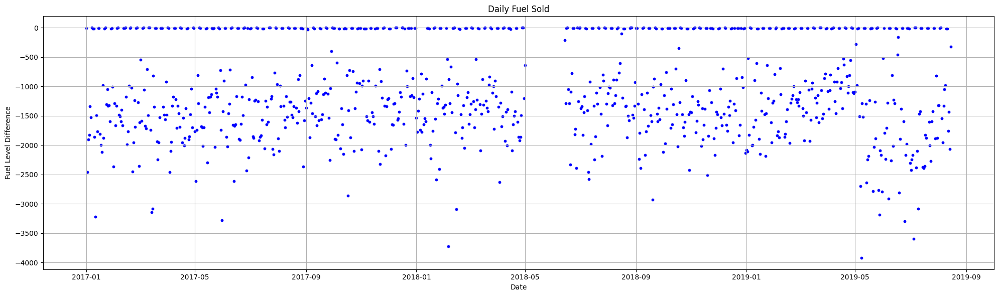

In [187]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 24")
plot_daily_fuel_sold(test_t24)

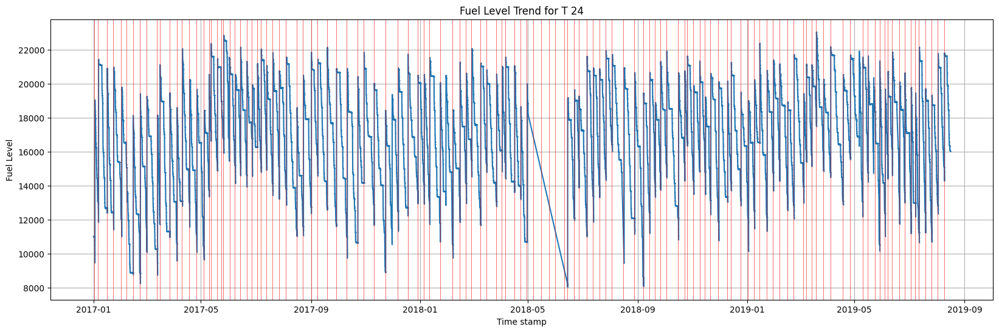

In [188]:
# Check the correlation between fuel_level and invoice data
time_stamp = fuel_groups["T 24"]["Time stamp"]
fuel_level = fuel_groups["T 24"]["Fuel Level"]

# plot the figure
plt.figure(figsize=(20, 6))
plt.plot(time_stamp, fuel_level, marker="o", linestyle="-", markersize=0.1)
plt.title(f"Fuel Level Trend for T 24")
plt.xlabel("Time stamp")
plt.ylabel("Fuel Level")
plt.grid(True)

for date in invoice[
    (invoice["Invoice Gas Station Location"] == 5) & (invoice["Fuel Type"] == "D")
]["Invoice Date"]:
    plt.axvline(x=date, color="red", linestyle="-", linewidth=0.4)

plt.show()

In [189]:
# 3. identify potentially problematic extremum values
test_t24[test_t24["Fuel Level Difference"] < -3500]

,Fuel Level Difference,Weekday,Is US Holiday
2018-02-05,-3724.0,Monday,False
2019-05-08,-3921.0,Wednesday,False
2019-07-05,-3600.0,Friday,False


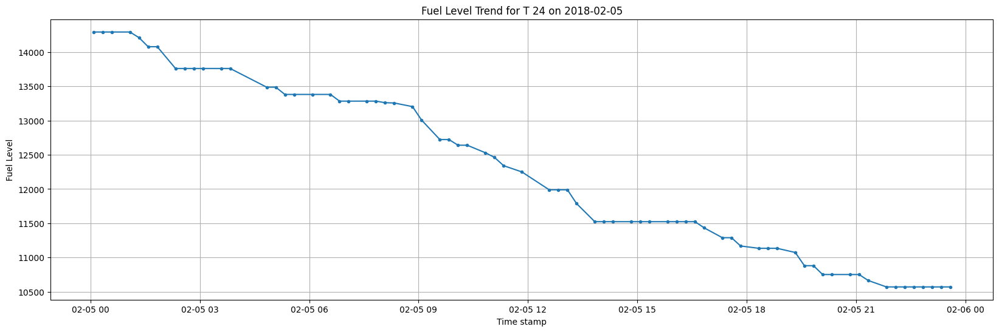

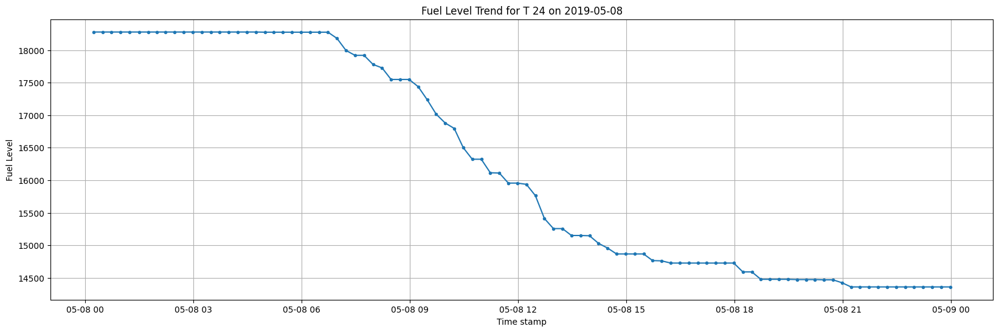

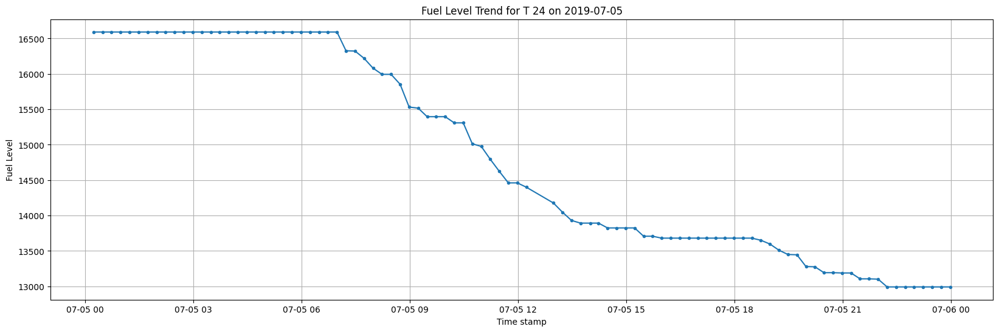

In [190]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 24", "2018-02-05")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 24", "2019-05-08")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 24", "2019-07-05")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

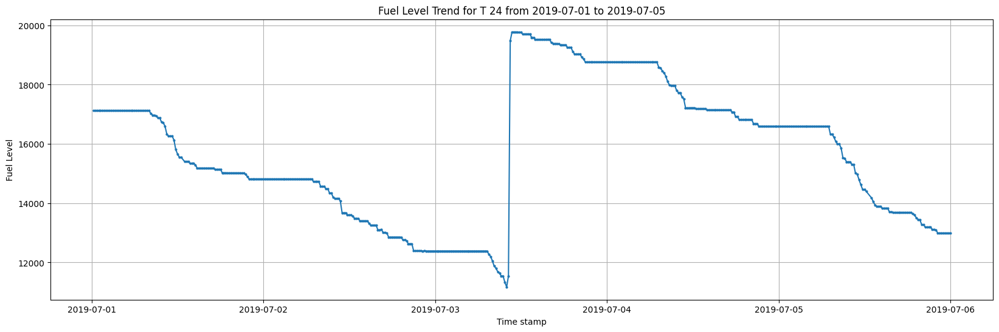

In [191]:
plot_fuel_level_for_specific_time_range(fuel_groups, "T 24", "2019-07-01", "2019-07-05")

In [192]:
# 5. Organize and group the data
test_t24["Fuel Level Difference"].describe()

count     913.000000
mean    -1042.697700
std       829.474783
min     -3921.000000
25%     -1639.000000
50%     -1196.000000
75%       -11.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [193]:
test_t24.groupby("Weekday").describe()

Fuel Level Difference                                           \
                          count         mean         std     min     25%   
Weekday                                                                    
Friday                    130.0 -1283.323077  500.910972 -3600.0 -1509.5   
Monday                    131.0 -1349.007634  661.411341 -3724.0 -1777.0   
Saturday                  130.0   -20.400000   96.788237  -787.0    -8.0   
Sunday                    131.0   -23.458015  161.152067 -1775.0    -8.0   
Thursday                  131.0 -1181.786260  476.440068 -2396.0 -1469.0   
Tuesday                   131.0 -1712.824427  604.133919 -3297.0 -2085.5   
Wednesday                 129.0 -1732.651163  573.926874 -3921.0 -2010.0   

                                
              50%     75%  max  
Weekday                         
Friday    -1291.0  -996.0 -4.0  
Monday    -1348.0 -1055.5  0.0  
Saturday     -4.0    -3.0  0.0  
Sunday       -4.0    -3.0  0.0  
Thursday  -1182.0  -899.0  0.0  
Tuesday   -1707.0 -1372.0 -3.0  
Wednesday -1673.0 -1389.0 -3.0

In [194]:
test_t24.groupby("Is US Holiday").describe()

Fuel Level Difference                                            \
                              count         mean         std     min      25%   
Is US Holiday                                                                   
False                         889.0 -1031.327334  829.222655 -3921.0 -1609.00   
True                           24.0 -1463.875000  737.556030 -2767.0 -1977.25   

                                    
                  50%     75%  max  
Is US Holiday                       
False         -1182.0   -11.0  0.0  
True          -1573.5 -1135.5 -4.0

In [195]:
# 6. Organize and determine threshold

updated_test_t24 = update_fuel_data(
    test_t24,
    tank.loc[tank["Tank ID"] == "T 24", "Tank Type"].iloc[0],
    fuel_groups["T 24"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 24", "Tank Capacity"].iloc[0],
    3000,
    "Saturday",
    3500,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t24.iloc[:30]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-01-01,-8.0,Sunday,False,0,11009.0,0.000000
2017-01-02,-2459.0,Monday,True,0,8550.0,0.000000
2017-01-03,-1904.0,Tuesday,False,0,6646.0,0.000000
2017-01-04,-1825.0,Wednesday,False,0,4821.0,0.000000
2017-01-05,-1343.0,Thursday,False,0,3478.0,0.000000
2017-01-06,-1528.0,Friday,False,21522,23472.0,15724.266474
2017-01-07,0.0,Saturday,False,0,23472.0,0.000000
2017-01-08,-15.0,Sunday,False,0,23457.0,0.000000
2017-01-09,-15.0,Monday,False,0,23442.0,0.000000
2017-01-10,-1862.0,Tuesday,False,0,21580.0,0.000000


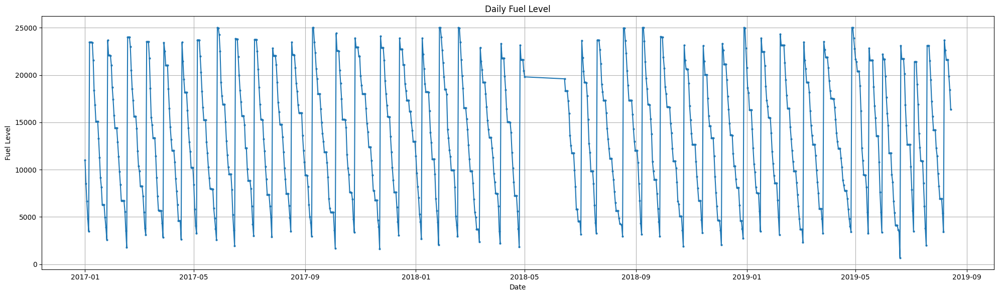

In [196]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t24)

In [197]:
# 8. Export the total Fuel cost
updated_test_t24["Fuel Cost"].sum()

738949.1767937981

In [198]:
invoice[(invoice["Invoice Gas Station Location"] == 5) & (invoice["Fuel Type"] == "D")][
    "Amount Purchased"
].sum()

994680.8294699999

In [199]:
invoice[(invoice["Invoice Gas Station Location"] == 5) & (invoice["Fuel Type"] == "D")]

,Invoice Date,Invoice ID,Invoice Gas Station Location,Amount Purchased,Gross Purchase Cost,Fuel Type,Unit Price,Unit Price Before Discount,Cumulative Inflation Rate,Adjusted Gross Purchase Cost,Month
7,2017-01-02,10005.0,5,9573.30189,7156.864,D,0.747586,0.747586,1.000000,7156.864000,2017-01
30,2017-01-06,10027.0,5,9490.02287,7094.608,D,0.747586,0.747586,1.000000,7094.608000,2017-01
55,2017-01-16,10051.0,5,8710.22841,6511.648,D,0.747586,0.747586,1.000000,6511.648000,2017-01
80,2017-01-23,10075.0,5,9459.73959,7071.968,D,0.747586,0.747586,1.000000,7071.968000,2017-01
111,2017-02-01,10106.0,5,8717.79923,6517.296,D,0.747585,0.747585,1.002000,6504.287425,2017-02
...,...,...,...,...,...,...,...,...,...,...,...
2792,2019-07-12,12751.0,5,11397.86951,6296.608,D,0.552437,0.552437,1.057392,5954.847168,2019-07
2811,2019-07-19,12770.0,5,8661.01808,4894.128,D,0.565075,0.565075,1.057392,4628.489539,2019-07
2826,2019-07-26,12785.0,5,8581.52447,4709.568,D,0.548803,0.548803,1.057392,4453.946897,2019-07
2844,2019-08-02,12803.0,5,9319.67942,5198.560,D,0.557805,0.557805,1.056335,4921.319210,2019-08


In [200]:
# 9. Import the results
update_tank_df(
    "T 24", "Saturday", True, 3000, 3500, round(updated_test_t24["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T25

In [201]:
# 1. import functions to see the data
test_t25 = daily_fuel_sold("T 25")
test_t25

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-8.0,Sunday,False
2017-01-02,-3043.0,Monday,True
2017-01-03,-2385.0,Tuesday,False
2017-01-04,-2922.0,Wednesday,False
2017-01-05,-2499.0,Thursday,False
...,...,...,...
2019-08-11,-12.0,Sunday,False
2019-08-12,-1836.0,Monday,False
2019-08-13,-2623.0,Tuesday,False
2019-08-14,-1745.0,Wednesday,False


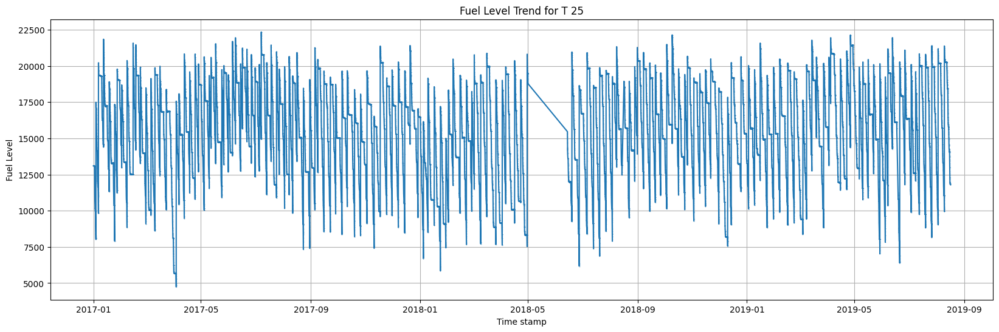

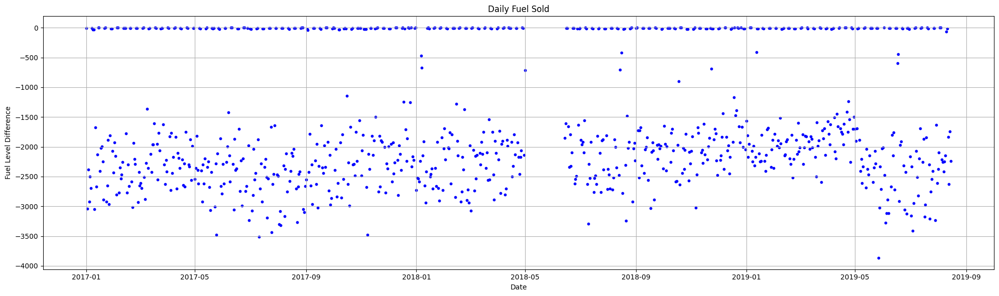

In [202]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 25")
plot_daily_fuel_sold(test_t25)

In [203]:
# 3. identify potentially problematic extremum values
test_t25[test_t25["Fuel Level Difference"] < -3500]

,Fuel Level Difference,Weekday,Is US Holiday
2017-07-11,-3513.0,Tuesday,False
2019-05-27,-3864.0,Monday,True


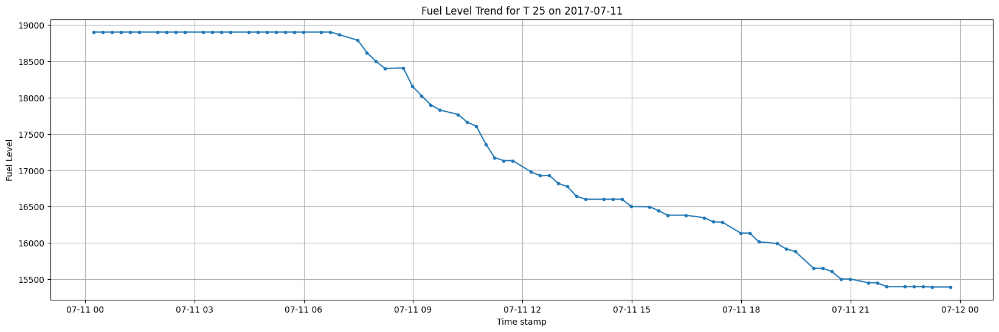

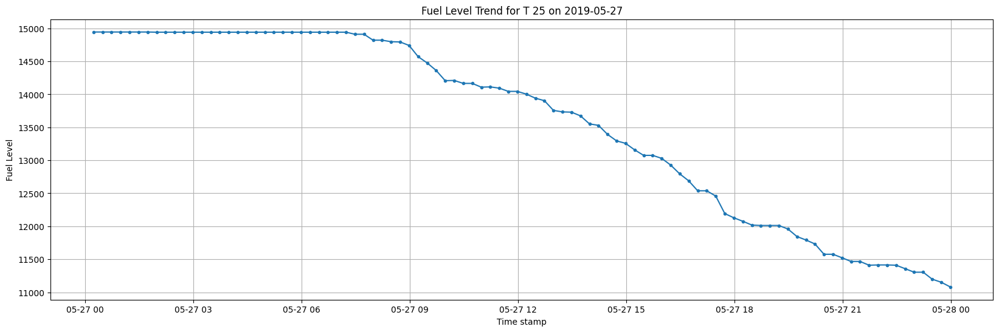

In [204]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 25", "2017-07-11")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 25", "2019-05-27")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [205]:
# 5. Organize and group the data
test_t25["Fuel Level Difference"].describe()

count     913.000000
mean    -1536.927711
std      1106.469708
min     -3864.000000
25%     -2374.000000
50%     -1938.000000
75%       -12.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [206]:
test_t25.groupby("Weekday").describe()

Fuel Level Difference                                           \
                          count         mean         std     min     25%   
Weekday                                                                    
Friday                    130.0 -2114.823077  597.404392 -3320.0 -2415.0   
Monday                    131.0 -1958.603053  809.668951 -3864.0 -2432.0   
Saturday                  130.0   -29.730769  183.124509 -2010.0   -11.0   
Sunday                    131.0   -12.145038   58.350548  -670.0   -11.0   
Thursday                  131.0 -2172.152672  577.471457 -3479.0 -2508.0   
Tuesday                   131.0 -2323.633588  632.431428 -3513.0 -2713.5   
Wednesday                 129.0 -2149.666667  531.794123 -3479.0 -2464.0   

                                
              50%     75%  max  
Weekday                         
Friday    -2148.0 -1848.5  0.0  
Monday    -2108.0 -1802.5  0.0  
Saturday     -6.5    -4.0  0.0  
Sunday       -6.0     0.0  0.0  
Thursday  -2185.0 -1908.0 -3.0  
Tuesday   -2404.0 -2042.5  0.0  
Wednesday -2141.0 -1885.0  0.0

In [207]:
test_t25.groupby("Is US Holiday").describe()

Fuel Level Difference                                            \
                              count         mean          std     min     25%   
Is US Holiday                                                                   
False                         889.0 -1523.066367  1106.805789 -3513.0 -2370.0   
True                           24.0 -2050.375000   982.989885 -3864.0 -2623.0   

                                     
                  50%      75%  max  
Is US Holiday                        
False         -1938.0   -12.00  0.0  
True          -2146.0 -1827.75 -3.0

In [208]:
# 6. Organize and determine threshold

updated_test_t25 = update_fuel_data(
    test_t25,
    tank.loc[tank["Tank ID"] == "T 25", "Tank Type"].iloc[0],
    fuel_groups["T 25"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 25", "Tank Capacity"].iloc[0],
    3500,
    "Sunday",
    3500,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t25.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-7.0,Saturday,False,0,4597.0,0.000000
2017-04-30,-8.0,Sunday,False,0,4589.0,0.000000
2017-05-01,-2540.0,Monday,False,0,2049.0,0.000000
2017-05-02,-2358.0,Tuesday,False,22951,22642.0,22673.623099
2017-05-03,-1817.0,Wednesday,False,0,20825.0,0.000000
2017-05-04,-2388.0,Thursday,False,0,18437.0,0.000000
2017-05-05,-2616.0,Friday,False,0,15821.0,0.000000


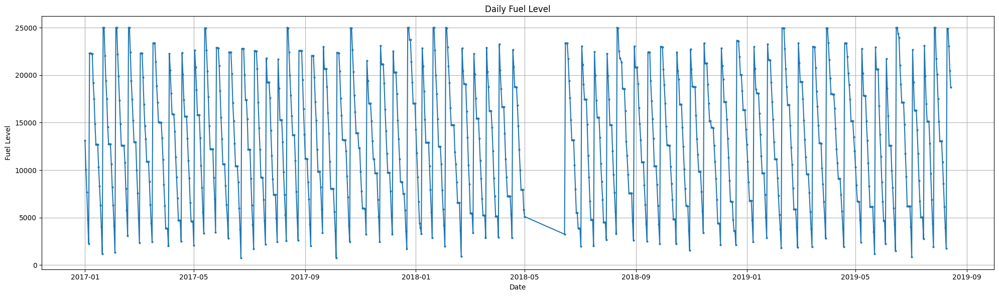

In [209]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t25)

In [210]:
# 8. Export the total Fuel cost
updated_test_t25["Fuel Cost"].sum()

1213768.921599662

In [211]:
# 9. Import the results
update_tank_df(
    "T 25", "Sunday", True, 3500, 3500, round(updated_test_t25["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


T26

In [212]:
# 1. import functions to see the data
test_t26 = daily_fuel_sold("T 26")
test_t26

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,0.0,Sunday,False
2017-01-02,-477.0,Monday,True
2017-01-03,-125.0,Tuesday,False
2017-01-04,0.0,Wednesday,False
2017-01-05,-140.0,Thursday,False
...,...,...,...
2019-08-11,0.0,Sunday,False
2019-08-12,-212.0,Monday,False
2019-08-13,-79.0,Tuesday,False
2019-08-14,-212.0,Wednesday,False


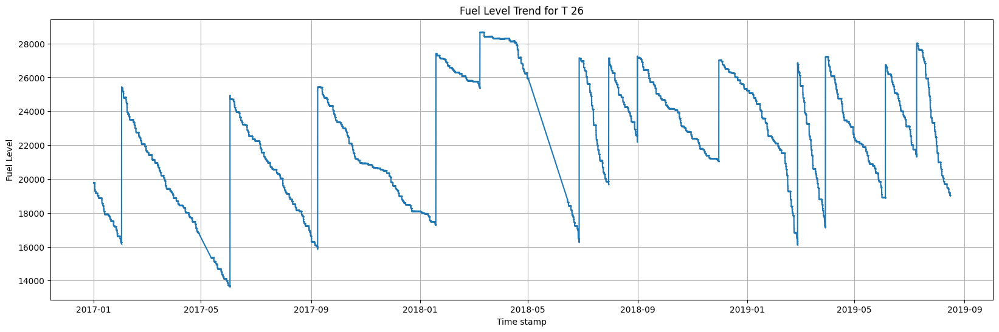

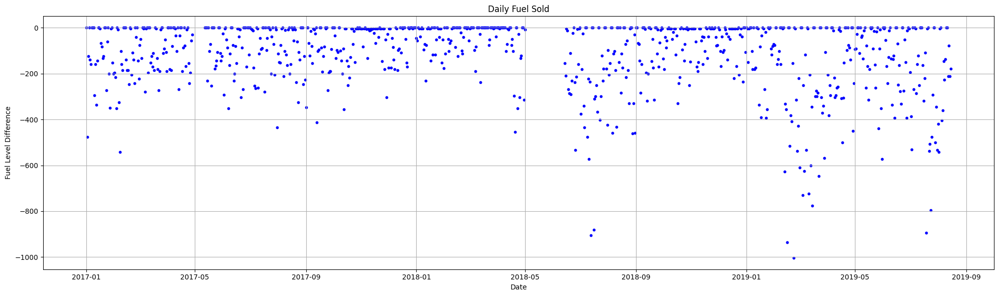

In [213]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 26")
plot_daily_fuel_sold(test_t26)

In [214]:
# 3. identify potentially problematic extremum values
test_t26[test_t26["Fuel Level Difference"] < -900]

,Fuel Level Difference,Weekday,Is US Holiday
2018-07-13,-904.0,Friday,False
2019-02-15,-935.0,Friday,False
2019-02-22,-1003.0,Friday,False


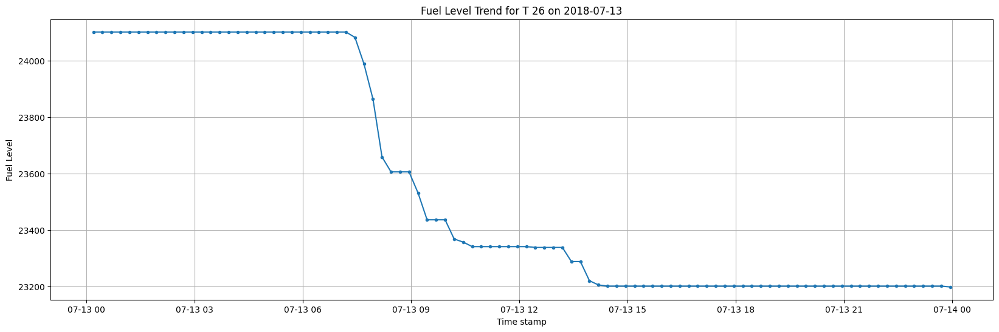

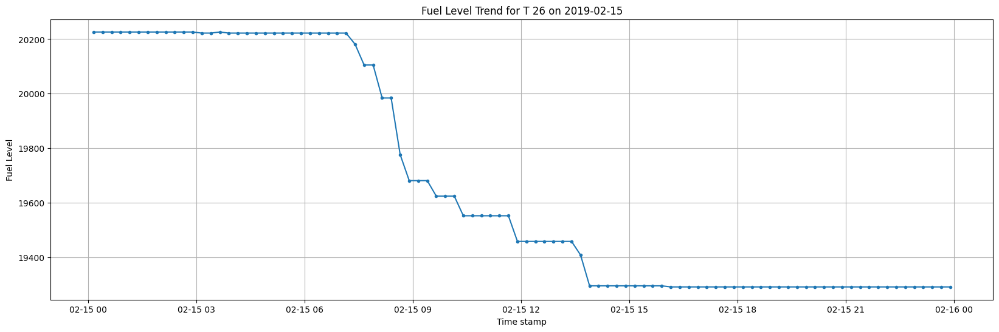

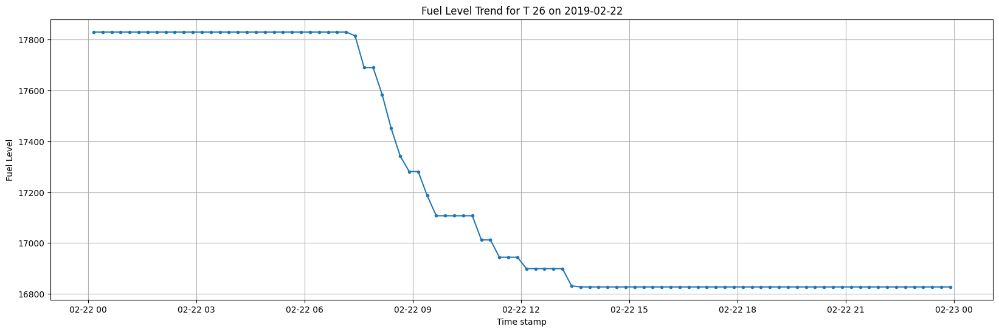

In [215]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 26", "2018-07-13")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 26", "2019-02-15")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 26", "2019-02-22")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [216]:
# 5. Organize and group the data
test_t26["Fuel Level Difference"].describe()

count     901.000000
mean     -112.403996
std       152.422720
min     -1003.000000
25%      -174.000000
50%       -53.000000
75%         0.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [217]:
test_t26.groupby("Weekday").describe()

Fuel Level Difference                                                \
                          count        mean         std     min    25%    50%   
Weekday                                                                         
Friday                    129.0 -185.302326  202.704280 -1003.0 -235.0 -140.0   
Monday                    129.0 -156.348837  170.196883  -882.0 -231.0 -110.0   
Saturday                  128.0   -1.929688    4.841070   -40.0   -4.0    0.0   
Sunday                    129.0   -1.635659    2.680771   -12.0   -4.0    0.0   
Thursday                  129.0 -140.527132  121.057971  -568.0 -227.0 -110.0   
Tuesday                   129.0 -147.387597  140.995030  -628.0 -231.0 -103.0   
Wednesday                 128.0 -153.156250  152.816778  -795.0 -197.0 -125.0   

                       
             75%  max  
Weekday                
Friday    -42.00  0.0  
Monday     -4.00  0.0  
Saturday    0.00  0.0  
Sunday      0.00  0.0  
Thursday  -42.00  0.0  
Tuesday   -35.00  0.0  
Wednesday -40.25  0.0

In [218]:
test_t26.groupby("Is US Holiday").describe()

Fuel Level Difference                                          \
                              count        mean         std     min     25%   
Is US Holiday                                                                 
False                         877.0 -112.659065  152.316928 -1003.0 -175.00   
True                           24.0 -103.083333  159.303352  -515.0 -101.75   

                               
                50%  75%  max  
Is US Holiday                  
False         -53.0  0.0  0.0  
True          -28.0 -4.0  0.0

In [219]:
# 6. Organize and determine threshold

updated_test_t26 = update_fuel_data(
    test_t26,
    tank.loc[tank["Tank ID"] == "T 26", "Tank Type"].iloc[0],
    fuel_groups["T 26"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 26", "Tank Capacity"].iloc[0],
    800,
    "Sunday",
    900,
    False,
)
# Use slicing to check if refueling follows the strategy
updated_test_t26.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-05-12,0.0,Friday,False,0,7410.0,0.0
2017-05-13,0.0,Saturday,False,0,7410.0,0.0
2017-05-14,0.0,Sunday,False,0,7410.0,0.0
2017-05-15,-231.0,Monday,False,0,7179.0,0.0
2017-05-16,0.0,Tuesday,False,0,7179.0,0.0
2017-05-17,-102.0,Wednesday,False,0,7077.0,0.0
2017-05-18,-72.0,Thursday,False,0,7005.0,0.0


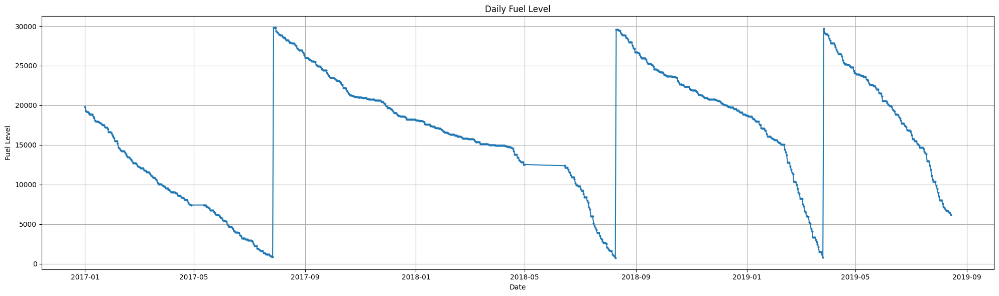

In [220]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t26)

In [221]:
# 8. Export the total Fuel cost
updated_test_t26["Fuel Cost"].sum()

70632.81584514712

In [222]:
# 9. Import the results
update_tank_df(
    "T 26", "Sunday", False, 800, 900, round(updated_test_t26["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T27

In [223]:
# 1. import functions to see the data
test_t27 = daily_fuel_sold("T 27")
test_t27

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4.0,Sunday,False
2017-01-02,-651.0,Monday,True
2017-01-03,-451.0,Tuesday,False
2017-01-04,-586.0,Wednesday,False
2017-01-05,-530.0,Thursday,False
...,...,...,...
2019-08-11,0.0,Sunday,False
2019-08-12,-431.0,Monday,False
2019-08-13,-447.0,Tuesday,False
2019-08-14,-102.0,Wednesday,False


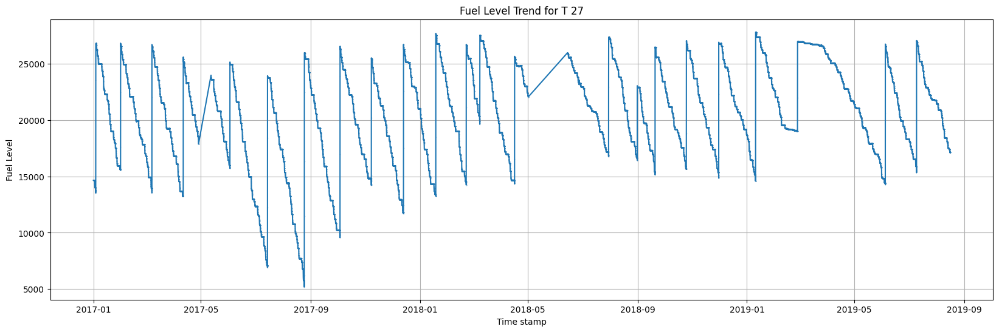

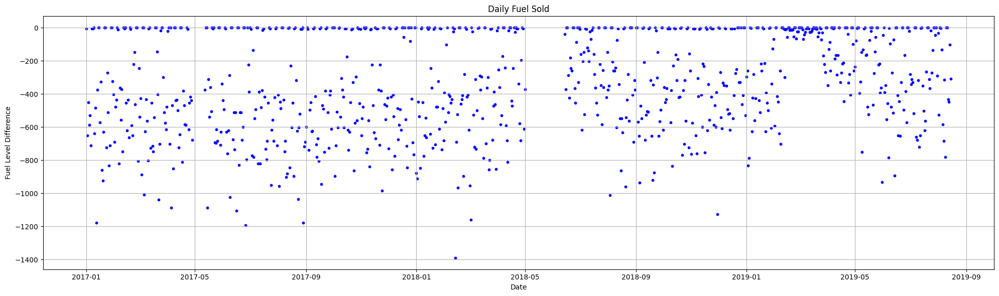

In [224]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 27")
plot_daily_fuel_sold(test_t27)

In [225]:
# 3. identify potentially problematic extremum values
test_t27[test_t27["Fuel Level Difference"] < -1200]

,Fuel Level Difference,Weekday,Is US Holiday
2018-02-13,-1389.0,Tuesday,False


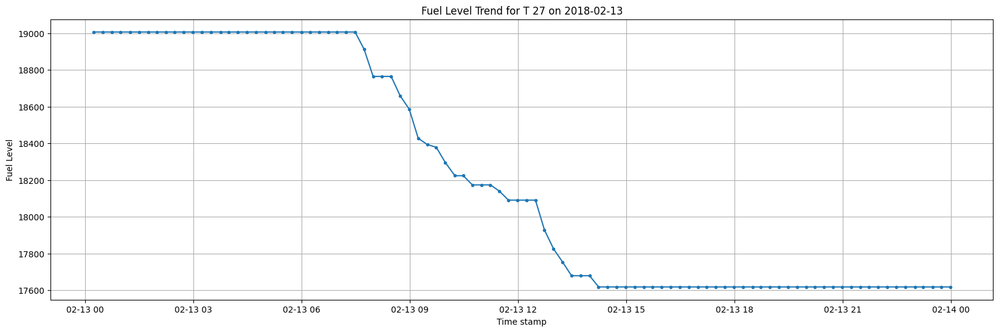

In [226]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 27", "2018-02-13")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [227]:
# 5. Organize and group the data
test_t27["Fuel Level Difference"].describe()

count     901.000000
mean     -324.924528
std       301.206830
min     -1389.000000
25%      -557.000000
50%      -318.000000
75%        -4.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [228]:
test_t27.groupby("Weekday").describe()

Fuel Level Difference                                          \
                          count        mean         std     min     25%   
Weekday                                                                   
Friday                    129.0 -517.604651  276.676973 -1158.0 -711.00   
Monday                    129.0 -402.062016  288.989018 -1193.0 -617.00   
Saturday                  128.0   -3.585938   12.132164  -102.0   -4.00   
Sunday                    129.0   -3.224806    9.349332   -95.0   -4.00   
Thursday                  129.0 -441.782946  244.319142 -1177.0 -583.00   
Tuesday                   129.0 -440.054264  242.505583 -1389.0 -617.00   
Wednesday                 128.0 -464.750000  248.911267 -1086.0 -633.75   

                              
             50%    75%  max  
Weekday                       
Friday    -523.0 -371.0  0.0  
Monday    -405.0 -163.0  0.0  
Saturday     0.0    0.0  0.0  
Sunday       0.0    0.0  0.0  
Thursday  -454.0 -280.0  0.0  
Tuesday   -436.0 -306.0  0.0  
Wednesday -477.0 -279.0  0.0

In [229]:
test_t27.groupby("Is US Holiday").describe()

Fuel Level Difference                                          \
                              count        mean         std     min     25%   
Is US Holiday                                                                 
False                         877.0 -323.375143  301.913792 -1389.0 -553.00   
True                           24.0 -381.541667  273.850480  -878.0 -576.75   

                                   
                 50%     75%  max  
Is US Holiday                      
False         -318.0   -4.00  0.0  
True          -355.5 -184.75  0.0

In [230]:
# 6. Organize and determine threshold

updated_test_t27 = update_fuel_data(
    test_t27,
    tank.loc[tank["Tank ID"] == "T 27", "Tank Type"].iloc[0],
    fuel_groups["T 27"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 27", "Tank Capacity"].iloc[0],
    1100,
    "Sunday",
    1200,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t27.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-05-12,-375.0,Friday,False,0,25377.0,0.0
2017-05-13,0.0,Saturday,False,0,25377.0,0.0
2017-05-14,0.0,Sunday,False,0,25377.0,0.0
2017-05-15,-1087.0,Monday,False,0,24290.0,0.0
2017-05-16,-310.0,Tuesday,False,0,23980.0,0.0
2017-05-17,-537.0,Wednesday,False,0,23443.0,0.0
2017-05-18,-360.0,Thursday,False,0,23083.0,0.0


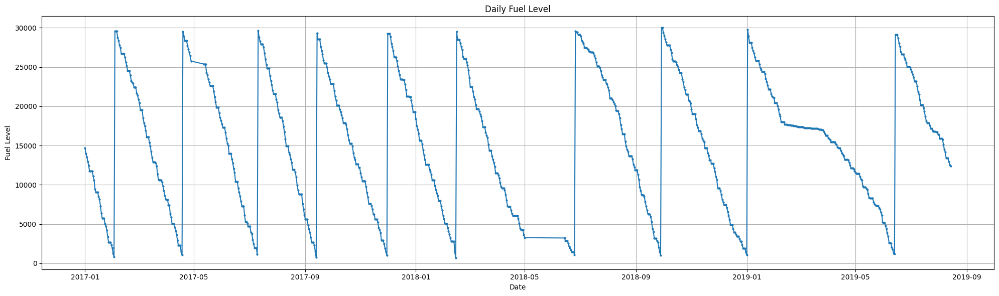

In [231]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t27)

In [232]:
# 8. Export the total Fuel cost
updated_test_t27["Fuel Cost"].sum()

259322.02838187045

In [233]:
# 9. Import the results
update_tank_df(
    "T 27", "Sunday", True, 1100, 1200, round(updated_test_t27["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T28

In [234]:
# 1. import functions to see the data
test_t28 = daily_fuel_sold("T 28")
test_t28

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4.0,Sunday,False
2017-01-02,-4.0,Monday,True
2017-01-03,-87.0,Tuesday,False
2017-01-04,-132.0,Wednesday,False
2017-01-05,0.0,Thursday,False
...,...,...,...
2019-08-11,0.0,Sunday,False
2019-08-12,0.0,Monday,False
2019-08-13,0.0,Tuesday,False
2019-08-14,-201.0,Wednesday,False


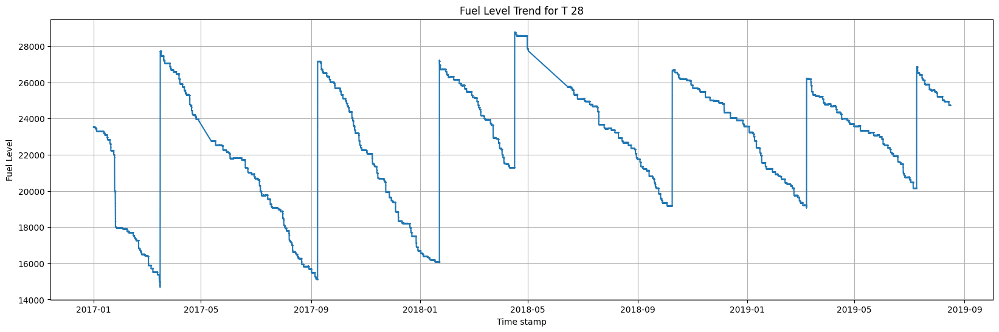

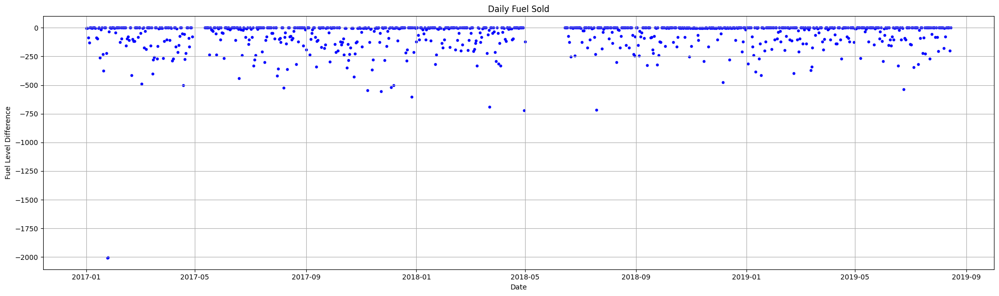

In [235]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 28")
plot_daily_fuel_sold(test_t28)

In [236]:
# 3. identify potentially problematic extremum values
test_t28[test_t28["Fuel Level Difference"] < -700]

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-24,-2006.0,Tuesday,False
2017-01-25,-2003.0,Wednesday,False
2018-04-30,-719.0,Monday,False
2018-07-19,-715.0,Thursday,False


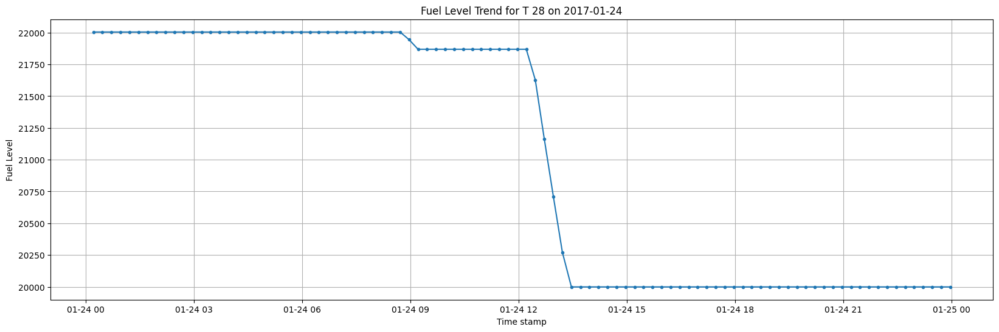

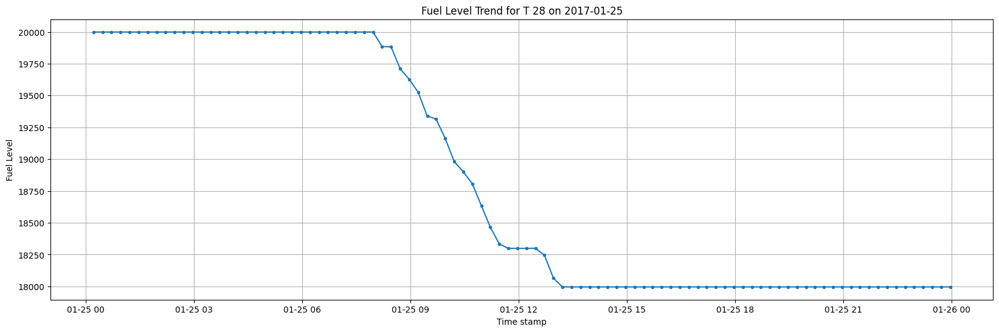

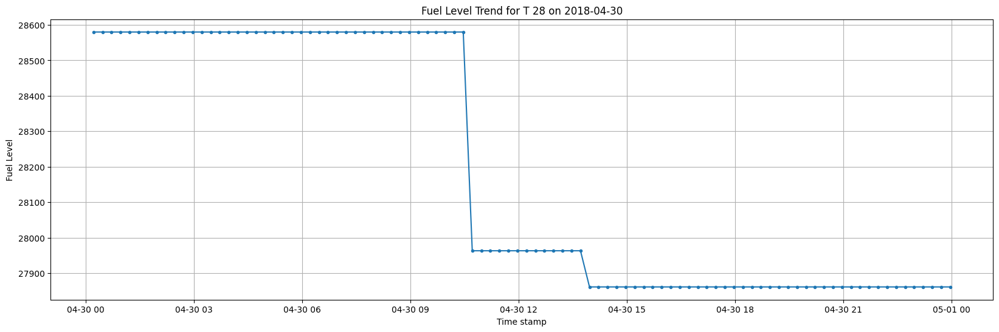

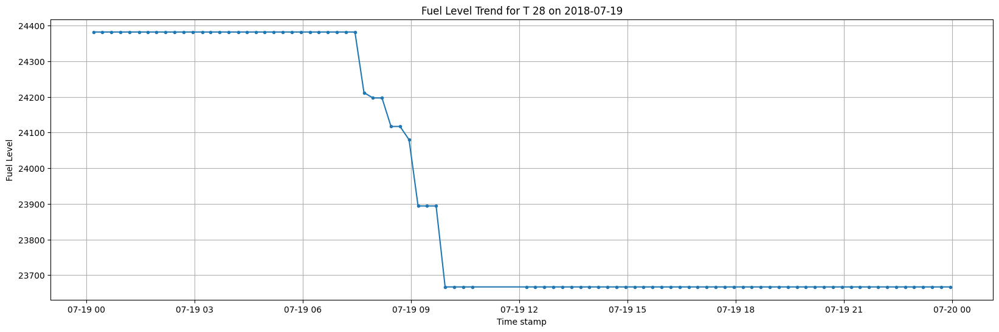

In [237]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 28", "2017-01-24")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 28", "2017-01-25")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 28", "2018-04-30")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 28", "2018-07-19")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [238]:
# 5. Organize and group the data
test_t28["Fuel Level Difference"].describe()

count     901.000000
mean      -68.566038
std       143.672085
min     -2006.000000
25%      -102.000000
50%        -4.000000
75%         0.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [239]:
test_t28.groupby("Weekday").describe()

Fuel Level Difference                                               \
                          count       mean         std     min     25%   50%   
Weekday                                                                        
Friday                    129.0 -80.038760  120.990728  -689.0 -121.00  -4.0   
Monday                    129.0 -95.356589  140.024987  -719.0 -140.00 -15.0   
Saturday                  128.0  -3.640625   26.063440  -291.0    0.00   0.0   
Sunday                    129.0  -3.403101   11.350605  -103.0   -4.00   0.0   
Thursday                  129.0 -99.085271  130.621892  -715.0 -140.00 -49.0   
Tuesday                   129.0 -99.240310  198.430473 -2006.0 -147.00 -49.0   
Wednesday                 128.0 -98.929688  204.495776 -2003.0 -134.75 -31.0   

                     
           75%  max  
Weekday              
Friday     0.0  0.0  
Monday     0.0  0.0  
Saturday   0.0  0.0  
Sunday     0.0  0.0  
Thursday   0.0  0.0  
Tuesday    0.0  0.0  
Wednesday  0.0  0.0

In [240]:
test_t28.groupby("Is US Holiday").describe()

Fuel Level Difference                                          \
                              count        mean         std     min     25%   
Is US Holiday                                                                 
False                         877.0  -67.700114  143.630917 -2006.0  -99.00   
True                           24.0 -100.208333  144.624545  -556.0 -131.75   

                               
                50%  75%  max  
Is US Holiday                  
False          -4.0  0.0  0.0  
True          -15.5  0.0  0.0

In [241]:
# 6. Organize and determine threshold

updated_test_t28 = update_fuel_data(
    test_t28,
    tank.loc[tank["Tank ID"] == "T 28", "Tank Type"].iloc[0],
    fuel_groups["T 28"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 28", "Tank Capacity"].iloc[0],
    750,
    "Sunday",
    750,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t28.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-05-12,0.0,Friday,False,0,10757.0,0.0
2017-05-13,0.0,Saturday,False,0,10757.0,0.0
2017-05-14,0.0,Sunday,False,0,10757.0,0.0
2017-05-15,0.0,Monday,False,0,10757.0,0.0
2017-05-16,0.0,Tuesday,False,0,10757.0,0.0
2017-05-17,-235.0,Wednesday,False,0,10522.0,0.0
2017-05-18,0.0,Thursday,False,0,10522.0,0.0


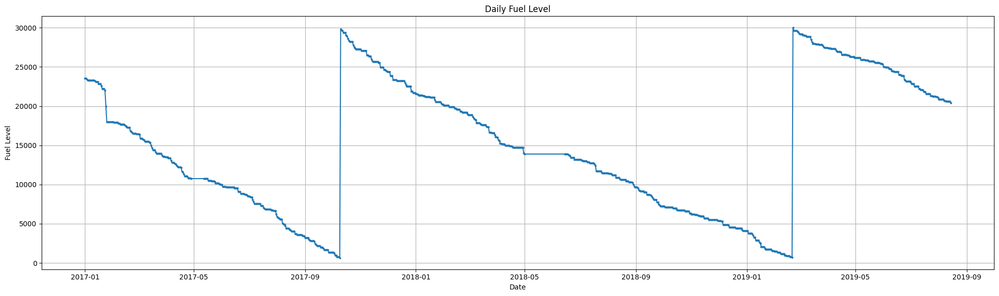

In [242]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t28)

In [243]:
# 8. Export the total Fuel cost
updated_test_t28["Fuel Cost"].sum()

48418.24841124588

In [244]:
# 9. Import the results
update_tank_df(
    "T 28", "Sunday", True, 750, 750, round(updated_test_t28["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T29

In [245]:
# 1. import functions to see the data
test_t29 = daily_fuel_sold("T 29")
test_t29

,Fuel Level Difference,Weekday,Is US Holiday
2017-06-05,0.0,Monday,False
2017-06-27,-64.0,Tuesday,False
2017-06-28,-35.0,Wednesday,False
2017-06-29,-177.0,Thursday,False
2017-06-30,-36.0,Friday,False
...,...,...,...
2019-08-11,-85.0,Sunday,False
2019-08-12,-96.0,Monday,False
2019-08-13,-10.0,Tuesday,False
2019-08-14,0.0,Wednesday,False


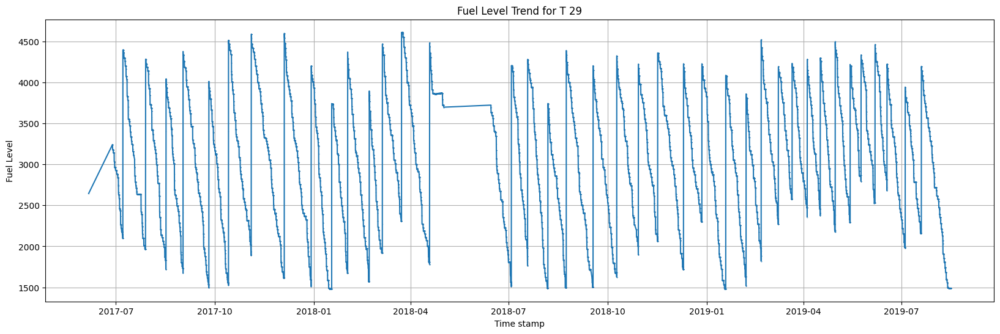

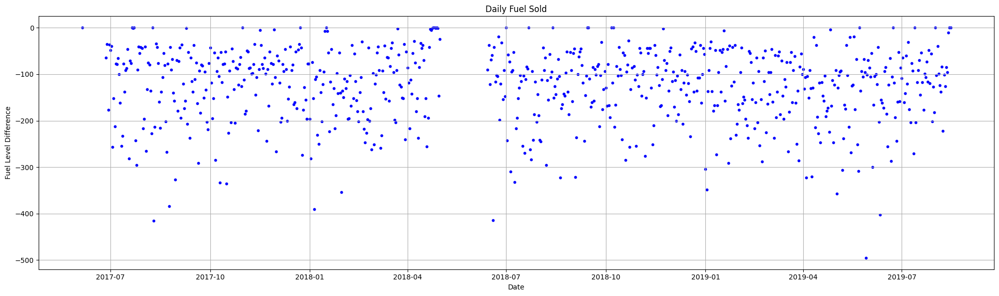

In [246]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 29")
plot_daily_fuel_sold(test_t29)

In [247]:
# 3. identify potentially problematic extremum values
test_t29[test_t29["Fuel Level Difference"] < -400]

,Fuel Level Difference,Weekday,Is US Holiday
2017-08-10,-415.0,Thursday,False
2018-06-19,-414.0,Tuesday,False
2019-05-29,-495.0,Wednesday,False
2019-06-11,-402.0,Tuesday,False


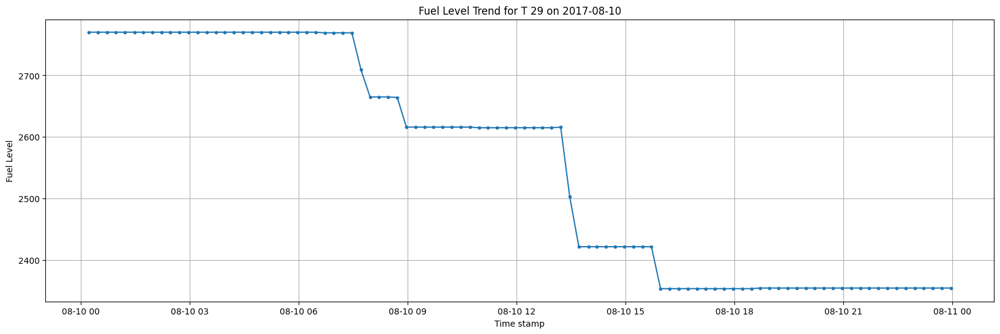

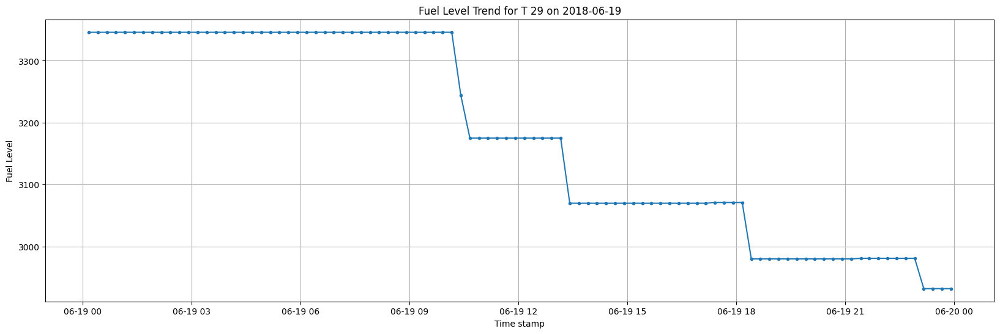

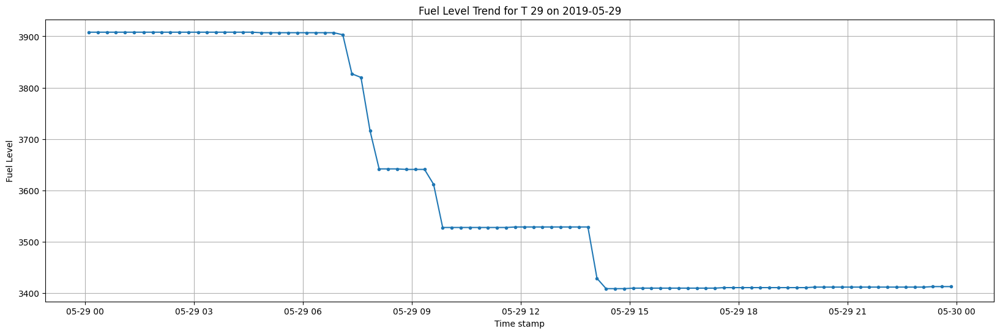

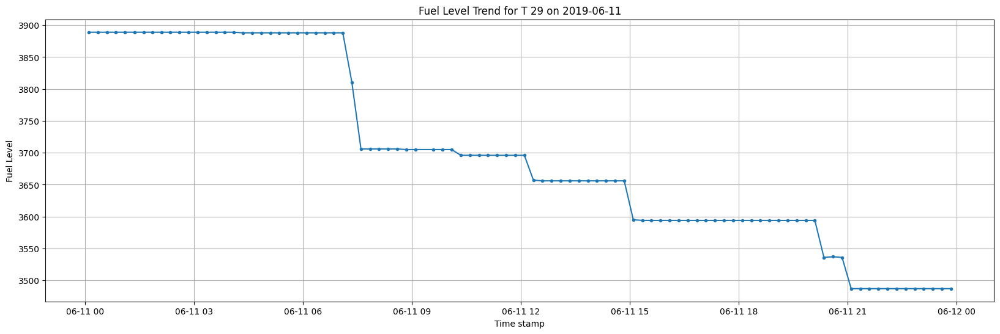

In [248]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 29", "2017-08-10")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 29", "2018-06-19")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 29", "2019-05-29")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 29", "2019-06-11")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [249]:
# 5. Organize and group the data
test_t29["Fuel Level Difference"].describe()

count    737.000000
mean    -125.686567
std       79.643658
min     -495.000000
25%     -170.000000
50%     -111.000000
75%      -68.000000
max        0.000000
Name: Fuel Level Difference, dtype: float64

In [250]:
test_t29.groupby("Weekday").describe()

Fuel Level Difference                                               \
                          count        mean        std    min     25%    50%   
Weekday                                                                        
Friday                    104.0 -126.538462  77.428818 -391.0 -177.50 -116.5   
Monday                    106.0 -139.783019  76.047229 -335.0 -190.00 -131.0   
Saturday                  105.0  -82.209524  45.155010 -237.0 -111.00  -80.0   
Sunday                    105.0  -80.828571  44.842128 -207.0 -102.00  -81.0   
Thursday                  106.0 -130.367925  83.455414 -415.0 -166.75 -116.0   
Tuesday                   106.0 -178.358491  87.484659 -414.0 -237.00 -180.0   
Wednesday                 105.0 -141.047619  84.101745 -495.0 -194.00 -129.0   

                        
              75%  max  
Weekday                 
Friday     -67.50  0.0  
Monday     -87.50  0.0  
Saturday   -45.00  0.0  
Sunday     -50.00  0.0  
Thursday   -76.25  0.0  
Tuesday   -114.25  0.0  
Wednesday  -79.00  0.0

In [251]:
test_t29.groupby("Is US Holiday").describe()

Fuel Level Difference                                       \
                              count        mean        std    min    25%   
Is US Holiday                                                              
False                         717.0 -125.315202  79.365490 -495.0 -169.0   
True                           20.0 -139.000000  90.288427 -321.0 -194.5   

                                 
                 50%   75%  max  
Is US Holiday                    
False         -110.0 -66.0  0.0  
True          -120.0 -77.5  0.0

In [252]:
# 6. Organize and determine threshold

updated_test_t29 = update_fuel_data(
    test_t29,
    tank.loc[tank["Tank ID"] == "T 29", "Tank Type"].iloc[0],
    fuel_groups["T 29"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 29", "Tank Capacity"].iloc[0],
    400,
    "Sunday",
    400,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t29.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-10-22,-72.0,Sunday,False,0,1559.0,0.0
2017-10-23,-132.0,Monday,False,0,1427.0,0.0
2017-10-24,-205.0,Tuesday,False,0,1222.0,0.0
2017-10-25,-86.0,Wednesday,False,0,1136.0,0.0
2017-10-26,-88.0,Thursday,False,0,1048.0,0.0
2017-10-27,-123.0,Friday,False,0,925.0,0.0
2017-10-28,-78.0,Saturday,False,0,847.0,0.0


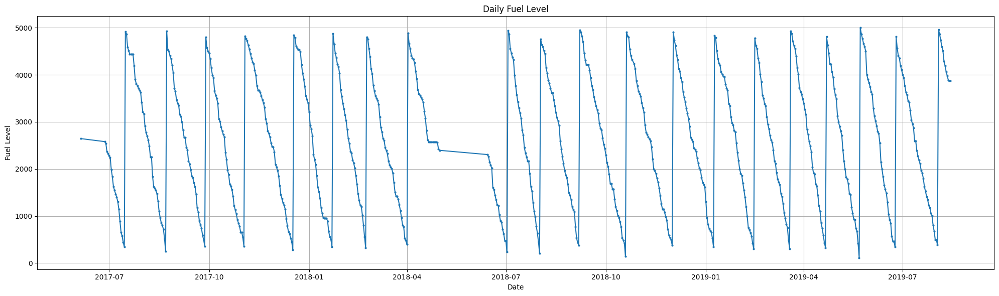

In [253]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t29)

In [254]:
# 8. Export the total Fuel cost
updated_test_t29["Fuel Cost"].sum()

80232.88680515898

In [255]:
# 9. Import the results
update_tank_df(
    "T 29", "Sunday", True, 400, 400, round(updated_test_t29["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T30

In [256]:
# 1. import functions to see the data
test_t30 = daily_fuel_sold("T 30")
test_t30

,Fuel Level Difference,Weekday,Is US Holiday
2017-06-05,0.0,Monday,False
2017-06-27,0.0,Tuesday,False
2017-06-28,0.0,Wednesday,False
2017-06-29,0.0,Thursday,False
2017-06-30,-1.0,Friday,False
...,...,...,...
2019-08-11,-2.0,Sunday,False
2019-08-12,-2.0,Monday,False
2019-08-13,-81.0,Tuesday,False
2019-08-14,-1.0,Wednesday,False


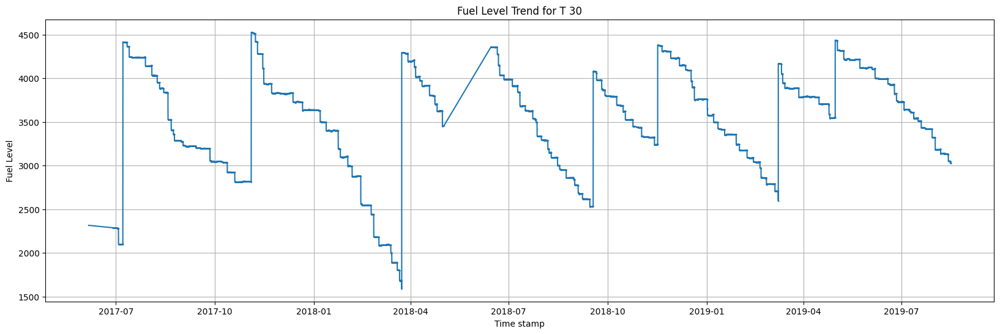

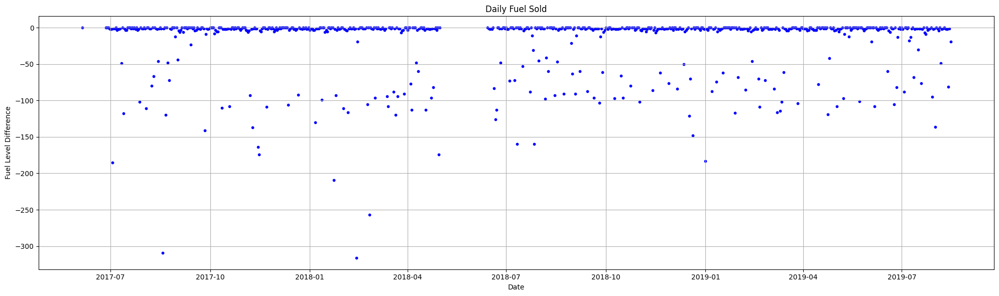

In [257]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 30")
plot_daily_fuel_sold(test_t30)

In [258]:
# 3. identify potentially problematic extremum values
test_t30[test_t30["Fuel Level Difference"] < -200]

,Fuel Level Difference,Weekday,Is US Holiday
2017-08-18,-309.0,Friday,False
2018-01-23,-209.0,Tuesday,False
2018-02-13,-316.0,Tuesday,False
2018-02-25,-257.0,Sunday,False


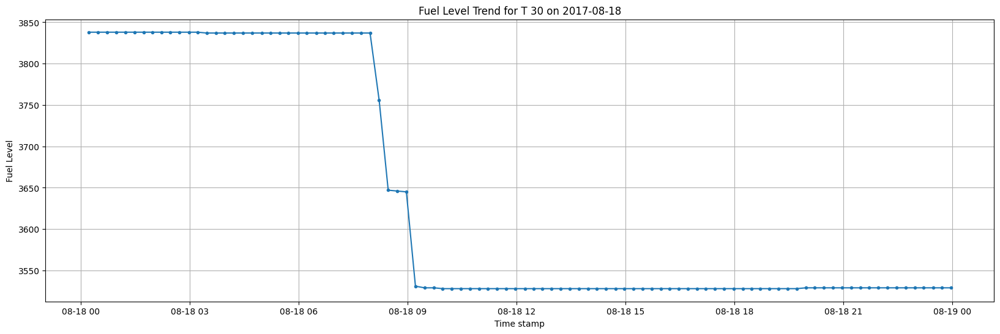

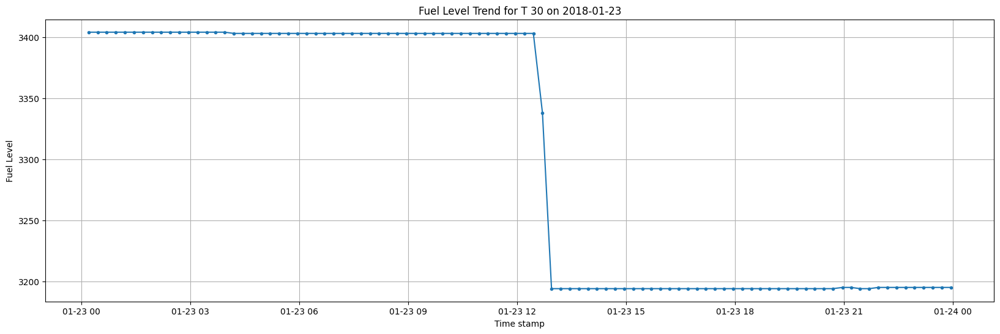

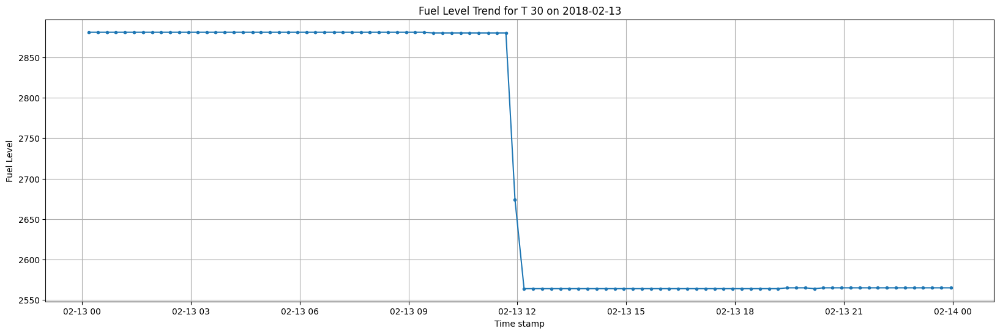

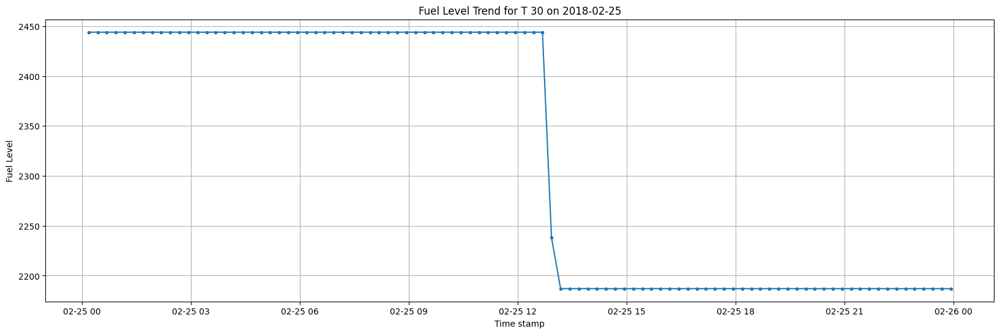

In [259]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 30", "2017-08-18")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 30", "2018-01-23")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 30", "2018-02-13")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 30", "2018-02-25")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [260]:
# 5. Organize and group the data
test_t30["Fuel Level Difference"].describe()

count    737.000000
mean     -17.146540
std       40.222009
min     -316.000000
25%       -3.000000
50%       -1.000000
75%        0.000000
max        0.000000
Name: Fuel Level Difference, dtype: float64

In [261]:
test_t30.groupby("Weekday").describe()

Fuel Level Difference                                                \
                          count       mean        std    min    25%  50%  75%   
Weekday                                                                         
Friday                    104.0 -17.903846  44.326354 -309.0  -3.00 -1.0  0.0   
Monday                    106.0 -21.471698  41.882422 -185.0  -6.75 -1.0  0.0   
Saturday                  105.0  -2.390476  12.651007 -130.0  -2.00 -1.0  0.0   
Sunday                    105.0  -3.609524  25.002498 -257.0  -2.00 -1.0  0.0   
Thursday                  106.0 -27.103774  43.955590 -148.0 -55.50 -1.0  0.0   
Tuesday                   106.0 -24.179245  51.443320 -316.0 -10.50 -1.0  0.0   
Wednesday                 105.0 -23.171429  41.374801 -174.0 -12.00 -2.0 -1.0   

                
           max  
Weekday         
Friday     0.0  
Monday     0.0  
Saturday   0.0  
Sunday     0.0  
Thursday   0.0  
Tuesday    0.0  
Wednesday  0.0

In [262]:
test_t30.groupby("Is US Holiday").describe()

Fuel Level Difference                                          \
                              count       mean        std    min   25%  50%   
Is US Holiday                                                                 
False                         717.0 -17.104603  40.084289 -316.0 -3.00 -1.0   
True                           20.0 -18.650000  46.014042 -183.0 -3.25 -1.5   

                         
               75%  max  
Is US Holiday            
False          0.0  0.0  
True           0.0  0.0

In [263]:
# 6. Organize and determine threshold

updated_test_t30 = update_fuel_data(
    test_t30,
    tank.loc[tank["Tank ID"] == "T 30", "Tank Type"].iloc[0],
    fuel_groups["T 30"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 30", "Tank Capacity"].iloc[0],
    200,
    "Saturday",
    250,
    False,
)

# Use slicing to check if refueling follows the strategy
updated_test_t30.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-10-22,0.0,Sunday,False,0,448.0,0.0
2017-10-23,-2.0,Monday,False,0,446.0,0.0
2017-10-24,0.0,Tuesday,False,0,446.0,0.0
2017-10-25,-1.0,Wednesday,False,0,445.0,0.0
2017-10-26,0.0,Thursday,False,0,445.0,0.0
2017-10-27,0.0,Friday,False,0,445.0,0.0
2017-10-28,-1.0,Saturday,False,0,444.0,0.0


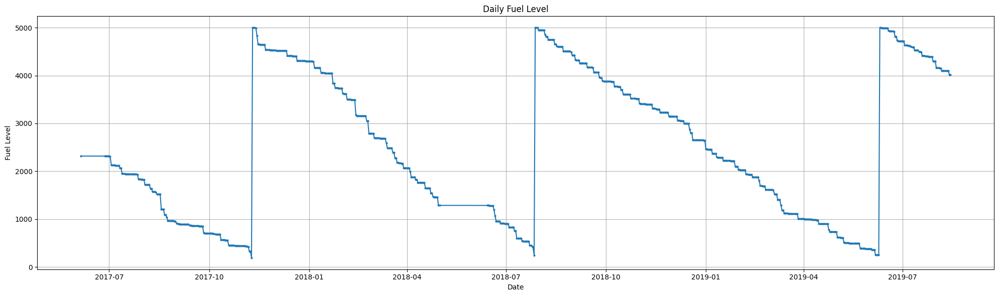

In [264]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t30)

In [265]:
# 8. Export the total Fuel cost
updated_test_t30["Fuel Cost"].sum()

11033.824826991979

In [266]:
# 9. Import the results
update_tank_df(
    "T 30", "Saturday", False, 200, 250, round(updated_test_t30["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T31

In [267]:
# 1. import functions to see the data
test_t31 = daily_fuel_sold("T 31")
test_t31

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4.0,Sunday,False
2017-01-02,-151.0,Monday,True
2017-01-03,-409.0,Tuesday,False
2017-01-04,-87.0,Wednesday,False
2017-01-05,-72.0,Thursday,False
...,...,...,...
2019-08-11,-31.0,Sunday,False
2019-08-12,-204.0,Monday,False
2019-08-13,-64.0,Tuesday,False
2019-08-14,-42.0,Wednesday,False


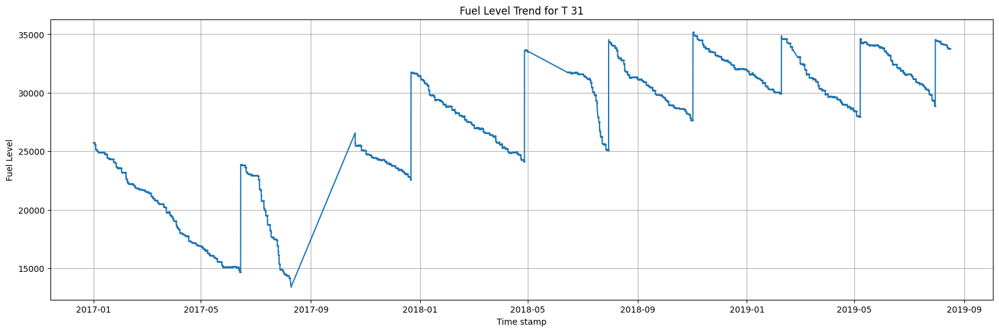

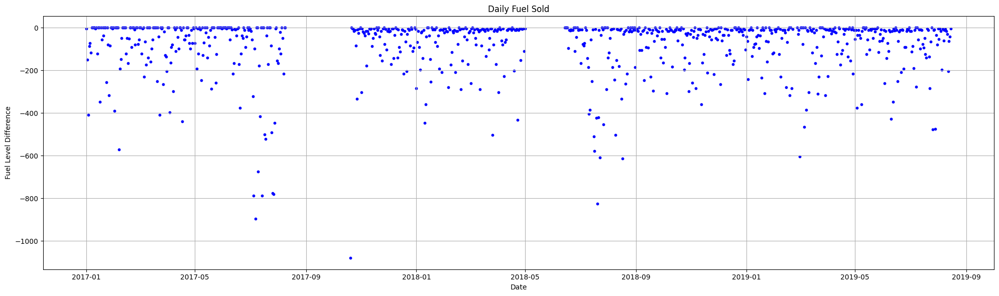

In [268]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 31")
plot_daily_fuel_sold(test_t31)

In [269]:
# 3. identify potentially problematic extremum values
test_t31[test_t31["Fuel Level Difference"] < -800]

,Fuel Level Difference,Weekday,Is US Holiday
2017-07-07,-897.0,Friday,False
2017-10-20,-1079.0,Friday,False
2018-07-20,-825.0,Friday,False


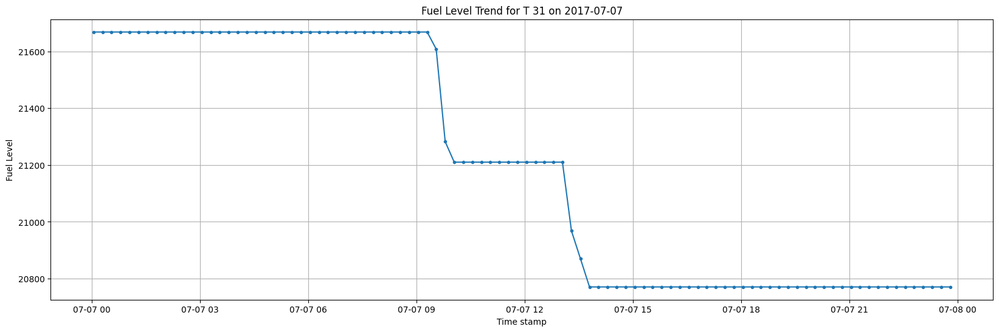

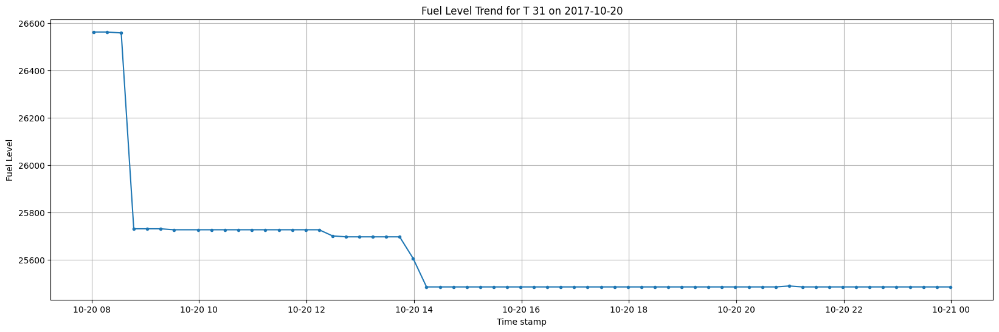

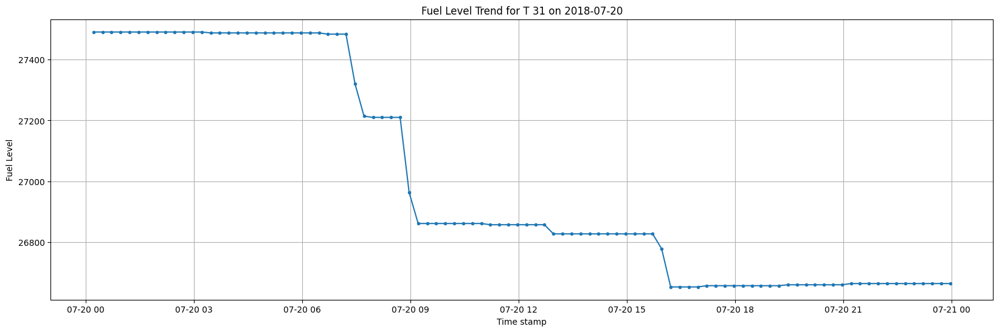

In [270]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 31", "2017-07-07")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 31", "2017-10-20")
plot_fuel_level_for_specific_time_range(fuel_groups, "T 31", "2018-07-20")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [271]:
# 5. Organize and group the data
test_t31["Fuel Level Difference"].describe()

count     839.000000
mean      -80.153754
std       134.336801
min     -1079.000000
25%      -100.500000
50%       -15.000000
75%        -4.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [272]:
test_t31.groupby("Weekday").describe()

Fuel Level Difference                                          \
                          count        mean         std     min     25%   
Weekday                                                                   
Friday                    119.0 -132.008403  191.666929 -1079.0 -155.00   
Monday                    120.0 -167.108333  147.276325  -674.0 -250.00   
Saturday                  119.0  -13.647059   45.027033  -420.0  -11.00   
Sunday                    120.0   -9.350000   21.711883  -227.0  -11.25   
Thursday                  120.0  -77.733333  123.514483  -780.0 -107.00   
Tuesday                   121.0  -64.966942  110.570938  -579.0  -72.00   
Wednesday                 120.0  -96.266667  136.398498  -787.0 -106.00   

                              
             50%    75%  max  
Weekday                       
Friday     -64.0 -13.00  0.0  
Monday    -142.0 -38.00  0.0  
Saturday    -4.0   0.00  0.0  
Sunday      -7.0   0.00  0.0  
Thursday   -16.0  -6.25  0.0  
Tuesday    -12.0   0.00  0.0  
Wednesday  -55.0 -12.00  0.0

In [273]:
test_t31.groupby("Is US Holiday").describe()

Fuel Level Difference                                         \
                              count        mean         std     min    25%   
Is US Holiday                                                                
False                         817.0  -78.697674  134.093152 -1079.0  -98.0   
True                           22.0 -134.227273  135.282749  -359.0 -287.0   

                                 
                50%    75%  max  
Is US Holiday                    
False         -15.0  -4.00  0.0  
True          -85.5 -15.25  0.0

In [274]:
# 6. Organize and determine threshold

updated_test_t31 = update_fuel_data(
    test_t31,
    tank.loc[tank["Tank ID"] == "T 31", "Tank Type"].iloc[0],
    fuel_groups["T 31"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 31", "Tank Capacity"].iloc[0],
    800,
    "Sunday",
    800,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t31.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,0.0,Saturday,False,0,16849.0,0.0
2017-04-30,-4.0,Sunday,False,0,16845.0,0.0
2017-05-01,-72.0,Monday,False,0,16773.0,0.0
2017-05-02,0.0,Tuesday,False,0,16773.0,0.0
2017-05-03,-193.0,Wednesday,False,0,16580.0,0.0
2017-05-04,-4.0,Thursday,False,0,16576.0,0.0
2017-05-05,-121.0,Friday,False,0,16455.0,0.0


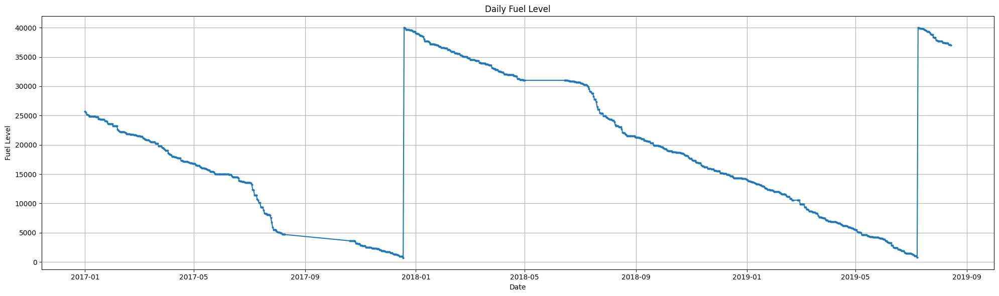

In [275]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t31)

In [276]:
# 8. Export the total Fuel cost
updated_test_t31["Fuel Cost"].sum()

55540.67412327649

In [277]:
# 9. Import the results
update_tank_df(
    "T 31", "Sunday", True, 800, 800, round(updated_test_t31["Fuel Cost"].sum(), 2)
)
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


## T32

In [278]:
# 1. import functions to see the data
test_t32 = daily_fuel_sold("T 32")
test_t32

,Fuel Level Difference,Weekday,Is US Holiday
2017-01-01,-4.0,Sunday,False
2017-01-02,-628.0,Monday,True
2017-01-03,-644.0,Tuesday,False
2017-01-04,-325.0,Wednesday,False
2017-01-05,-436.0,Thursday,False
...,...,...,...
2019-08-11,-121.0,Sunday,False
2019-08-12,-287.0,Monday,False
2019-08-13,-462.0,Tuesday,False
2019-08-14,-708.0,Wednesday,False


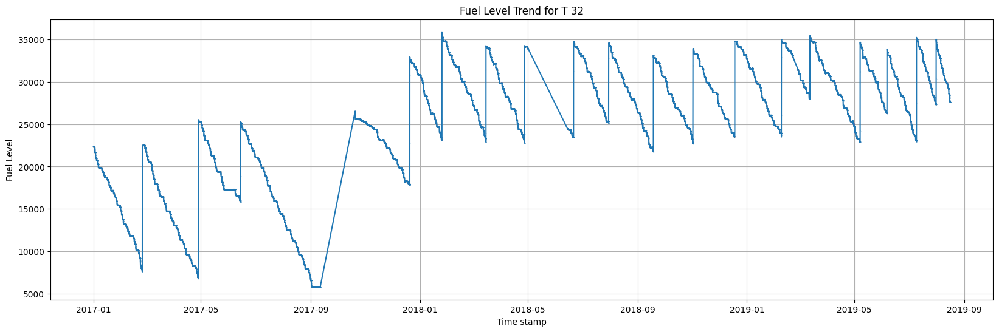

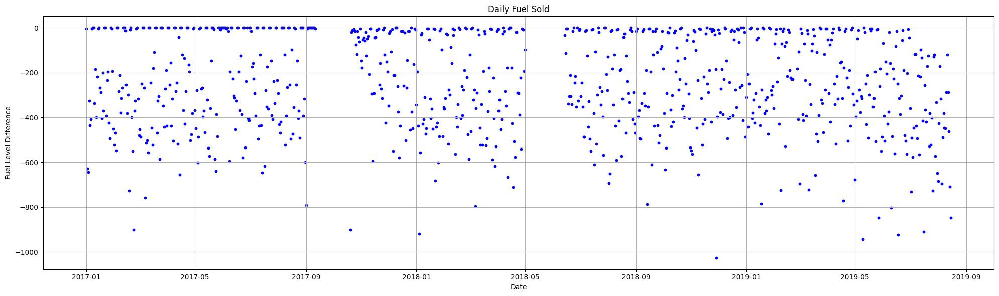

In [279]:
# 2. plot the chart and see the extremum values
plot_fuel_level("T 32")
plot_daily_fuel_sold(test_t32)

In [280]:
# 3. identify potentially problematic extremum values
test_t32[test_t32["Fuel Level Difference"] < -950]

,Fuel Level Difference,Weekday,Is US Holiday
2018-11-29,-1026.0,Thursday,False


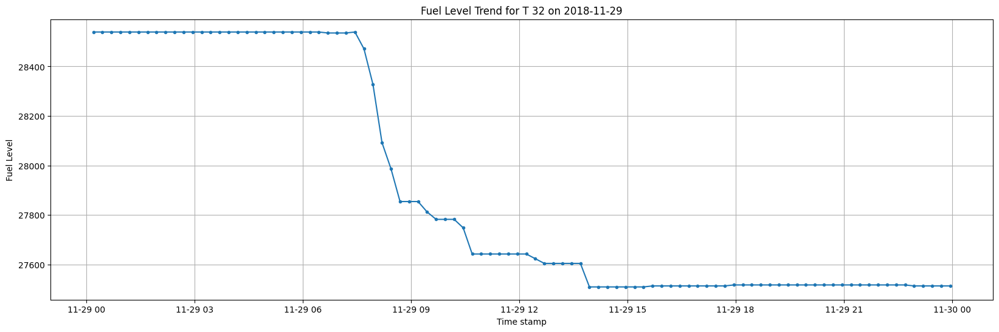

In [281]:
# 4. plot extremum vlaues to check if any issues
plot_fuel_level_for_specific_time_range(fuel_groups, "T 32", "2018-11-29")
# There are no issues here, so skip the subsequent data cleaning. For specific data cleaning steps, refer to T12.

In [282]:
# 5. Organize and group the data
test_t32["Fuel Level Difference"].describe()

count     872.000000
mean     -245.176606
std       216.855158
min     -1026.000000
25%      -405.000000
50%      -238.000000
75%       -15.000000
max         0.000000
Name: Fuel Level Difference, dtype: float64

In [283]:
test_t32.groupby("Weekday").describe()

Fuel Level Difference                                          \
                          count        mean         std     min     25%   
Weekday                                                                   
Friday                    124.0 -364.516129  190.593872  -943.0 -484.25   
Monday                    125.0 -275.256000  190.108921  -848.0 -386.00   
Saturday                  124.0  -18.806452   39.400317  -288.0  -16.00   
Sunday                    125.0  -19.792000   51.682233  -394.0  -15.00   
Thursday                  125.0 -369.320000  200.921049 -1026.0 -488.00   
Tuesday                   125.0 -333.152000  177.810567  -923.0 -443.00   
Wednesday                 124.0 -335.258065  182.096279  -901.0 -441.75   

                               
             50%     75%  max  
Weekday                        
Friday    -355.5 -245.25  0.0  
Monday    -265.0 -148.00  0.0  
Saturday    -4.0    0.00  0.0  
Sunday      -4.0    0.00  0.0  
Thursday  -386.0 -227.00  0.0  
Tuesday   -337.0 -235.00  0.0  
Wednesday -341.0 -189.00  0.0

In [284]:
test_t32.groupby("Is US Holiday").describe()

Fuel Level Difference                                         \
                              count        mean         std     min    25%   
Is US Holiday                                                                
False                         849.0 -243.759717  216.879393 -1026.0 -405.0   
True                           23.0 -297.478261  214.059013  -848.0 -399.5   

                                  
                 50%    75%  max  
Is US Holiday                     
False         -235.0  -15.0  0.0  
True          -311.0 -174.0  0.0

In [285]:
# 6. Organize and determine threshold

updated_test_t32 = update_fuel_data(
    test_t32,
    tank.loc[tank["Tank ID"] == "T 32", "Tank Type"].iloc[0],
    fuel_groups["T 32"]["Fuel Level"].iloc[0],
    tank.loc[tank["Tank ID"] == "T 32", "Tank Capacity"].iloc[0],
    800,
    "Saturday",
    900,
    True,
)
# Use slicing to check if refueling follows the strategy
updated_test_t32.iloc[118:125]

,Fuel Sales,Weekday,Is US Holiday,Purchase,Fuel Level,Fuel Cost
2017-04-29,-4.0,Saturday,False,0,30933.0,0.0
2017-04-30,0.0,Sunday,False,0,30933.0,0.0
2017-05-01,-368.0,Monday,False,0,30565.0,0.0
2017-05-02,-450.0,Tuesday,False,0,30115.0,0.0
2017-05-03,-280.0,Wednesday,False,0,29835.0,0.0
2017-05-04,-602.0,Thursday,False,0,29233.0,0.0
2017-05-05,-488.0,Friday,False,0,28745.0,0.0


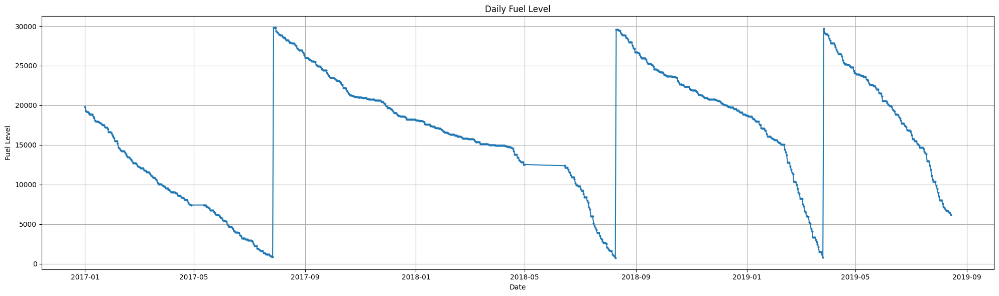

In [286]:
# 7. plot the chart and confirm the strategy's rationality
plot_fuel_level_update(updated_test_t26)

In [287]:
# 8. Export the total Fuel cost
updated_test_t32["Fuel Cost"].sum()

160707.12193002753

In [288]:
# 9. Import the results
update_tank_df(
    "T 32", "Saturday", True, 800, 900, round(updated_test_t32["Fuel Cost"].sum(), 2)
)

**Final Result**

In [289]:
tank

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Best Day,Consider Holidays,Regular Threshold,Special Day Threshold,New Total Cost
0,T 10,1,1,U,40000,Sunday,False,10000,12000,2087698.74
1,T 11,1,2,U,40000,Sunday,False,9000,10000,3420847.22
2,T 12,1,3,D,40000,Sunday,True,10000,11000,3054461.64
3,T 13,1,4,P,40000,<NA>,<NA>,<NA>,<NA>,<NA>
4,T 14,1,5,U,40000,Sunday,False,7500,9000,2337339.58
5,T 15,1,6,D,40000,Sunday,True,10000,11000,1721713.38
6,T 16,2,1,U,70000,Sunday,True,3300,3300,1299439.46
7,T 17,2,2,D,40000,Sunday,True,6000,7000,1802083.7
8,T 18,2,3,U,40000,Sunday,True,3500,4000,1197326.77
9,T 19,2,4,D,70000,Sunday,True,5500,6000,1207883.25


In [290]:
i = invoice.pivot_table(
    values="Adjusted Gross Purchase Cost",
    index="Invoice Gas Station Location",
    columns="Fuel Type",
    aggfunc="sum",
)

for col in i.columns:
    if pd.api.types.is_float_dtype(i[col]):
        i[col] = i[col].apply(lambda x: "{:,.2f}".format(x))

i

Fuel Type,D,U
Invoice Gas Station Location,,
1,"4,757,975.03","10,615,119.85"
2,"3,387,481.95","2,762,429.77"
3,"422,744.88","415,670.16"
4,"1,592,548.10","1,540,473.69"
5,"792,572.36","1,315,253.51"
6,"53,434.45","378,386.23"
7,"10,803.80","91,129.34"
8,"74,341.28","202,580.56"


In [291]:
j = tank.pivot_table(
    values="New Total Cost", index="Tank Location", columns="Tank Type", aggfunc="sum"
)

for col in j.columns:
    if pd.api.types.is_float_dtype(j[col]):
        j[col] = j[col].apply(lambda x: "{:,.2f}".format(x))

j

Tank Type,D,P,U
Tank Location,,,
1,"4,776,175.02",0.00,"7,845,885.54"
2,"3,009,966.95",nan,"2,496,766.23"
3,"245,116.57",nan,"316,108.13"
4,"1,411,101.77",nan,"1,388,584.49"
5,"738,949.18",nan,"1,213,768.92"
6,"48,418.25",nan,"329,954.85"
7,"11,033.82",nan,"80,232.89"
8,"55,540.67",nan,"160,707.12"


In [292]:
prev_cost = invoice["Adjusted Gross Purchase Cost"].sum()
prev_cost

28412944.957181543

In [293]:
after_cost = tank["New Total Cost"].sum()
after_cost

24128310.400000002

In [294]:
prev_cost - after_cost

4284634.557181541

In [295]:
after_cost / prev_cost - 1

-0.1507986786881299

Attempting to correct the cost-saving ratio. Values present in the invoice but not reflected in the fuel level data were removed.

In [296]:
# WARRING: Long Running time!
invoice_cor = invoice.copy()
invoice_cor["cor_cost"] = 0
df = pd.DataFrame(index=pd.date_range(start="2017-01-01", end="2019-12-31"))

for index, row in merge_tanks.iterrows():
    df["Total Time Difference"] = 0
    for tank_id in row["Unique Tank IDs"]:
        df["Total Time Difference"] += daily_fuel_sold(tank_id)["Fuel Level Difference"]
    for index2, row2 in invoice_cor.iterrows():
        date = pd.Timestamp(row2["Invoice Date"].date())
        if (
            df.at[date, "Total Time Difference"] < 50
            and row["Tank Location"] == row2["Invoice Gas Station Location"]
            and row["Tank Type"] == row2["Fuel Type"]
        ):
            invoice_cor.at[index2, "cor_cost"] = invoice_cor.at[
                index2, "Adjusted Gross Purchase Cost"
            ]

In [297]:
prev_cost = invoice_cor["cor_cost"].sum()
prev_cost

26414367.08086253

In [298]:
after_cost / prev_cost - 1

-0.0865459571249314

The savings here are only estimated. We estimated that the final cost reduction percentage will fluctuate within the range of 4-6%.

**--------------------Tank Expansion Strategy--------------------**

Note: Due to some procedural oversights, the error values are not removed from the datasets here, but this does not affect our quantitative judgment.

In [299]:
def plot_fuel_opt(tank_id):
    df = update_fuel_data(
        daily_fuel_sold(tank_id),
        tank.loc[tank["Tank ID"] == tank_id, "Tank Type"].iloc[0],
        fuel_groups[tank_id]["Fuel Level"].iloc[0],
        tank.loc[tank["Tank ID"] == tank_id, "Tank Capacity"].iloc[0],
        tank.loc[tank["Tank ID"] == tank_id, "Regular Threshold"].iloc[0],
        tank.loc[tank["Tank ID"] == tank_id, "Best Day"].iloc[0],
        tank.loc[tank["Tank ID"] == tank_id, "Special Day Threshold"].iloc[0],
        tank.loc[tank["Tank ID"] == tank_id, "Consider Holidays"].iloc[0],
    )
    plt.figure(figsize=(20, 6))
    plt.plot(df.index, df["Fuel Level"], marker="o", linestyle="-", markersize=2)
    plt.title(f"Daily Fuel Level of {tank_id[0]}{tank_id[2:]}")
    plt.xlabel("Date")
    plt.ylabel("Fuel Level")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

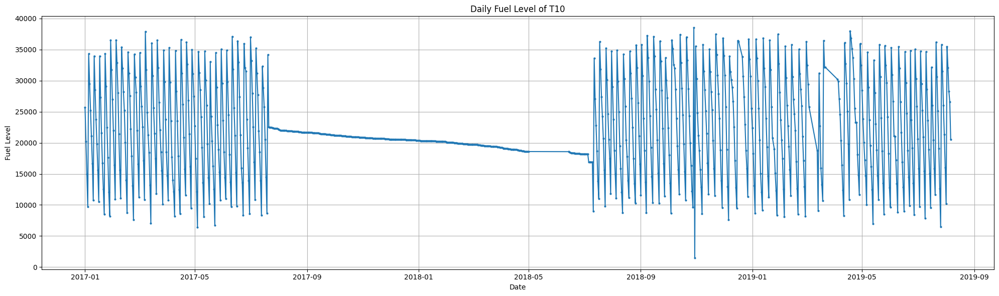

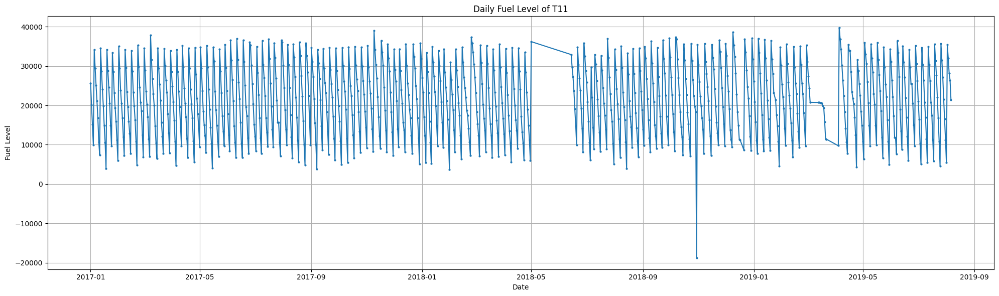

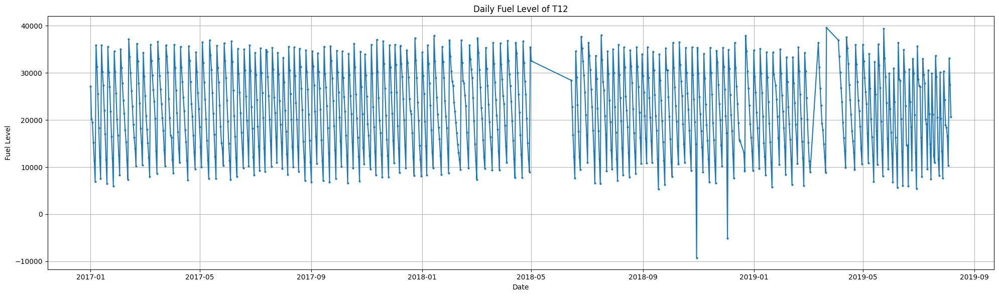

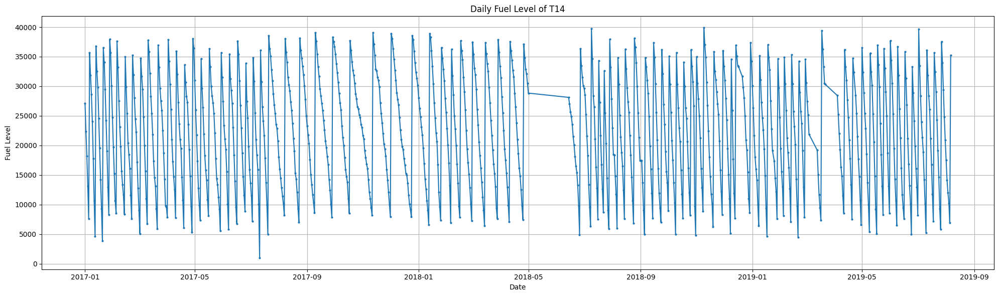

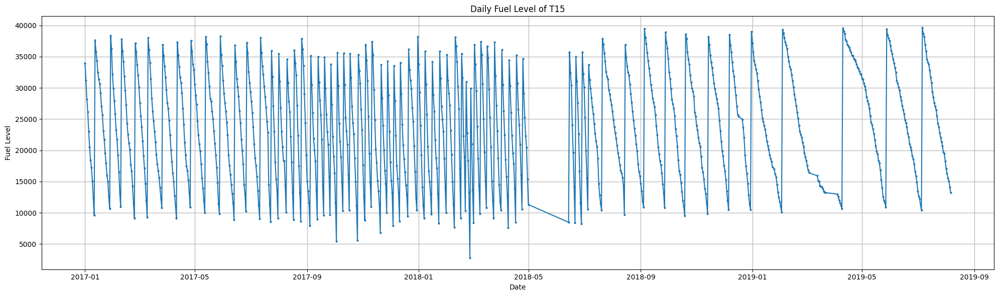

...

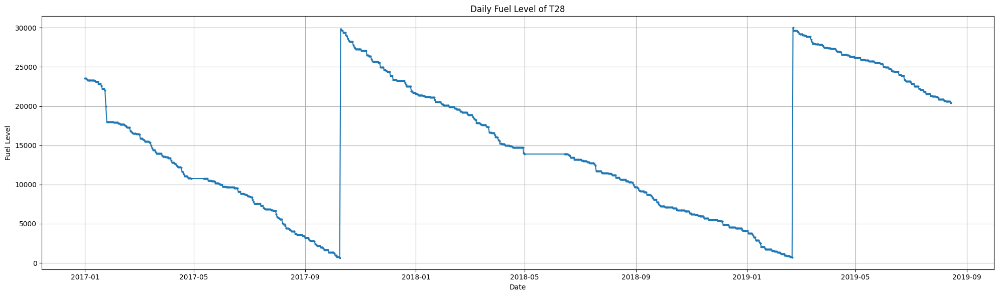

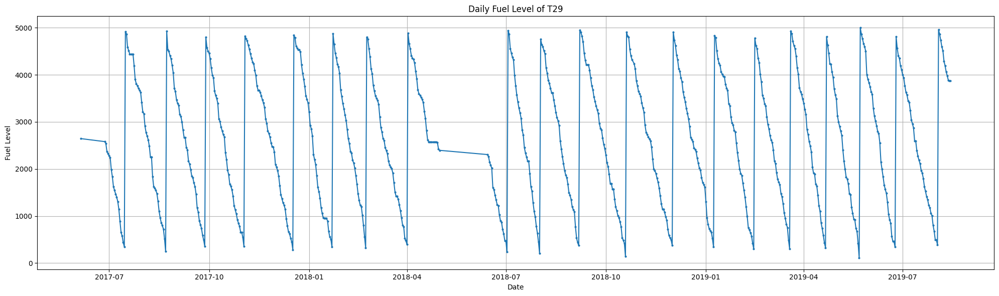

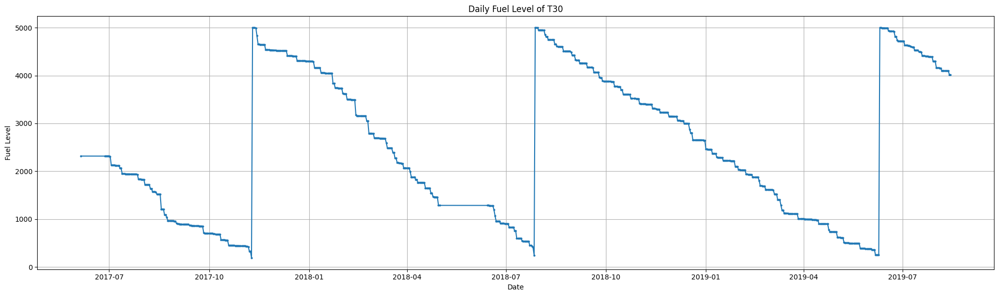

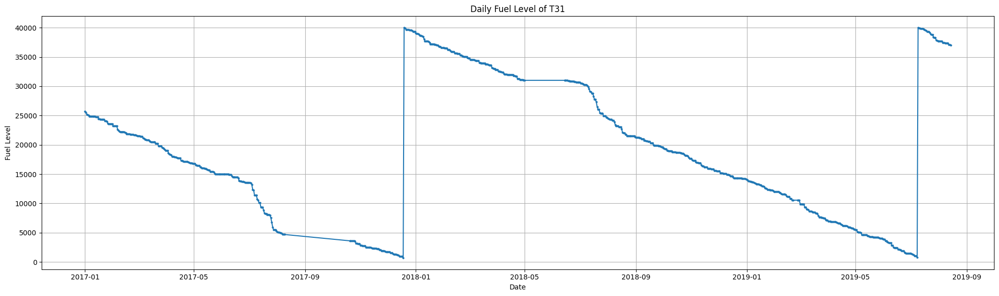

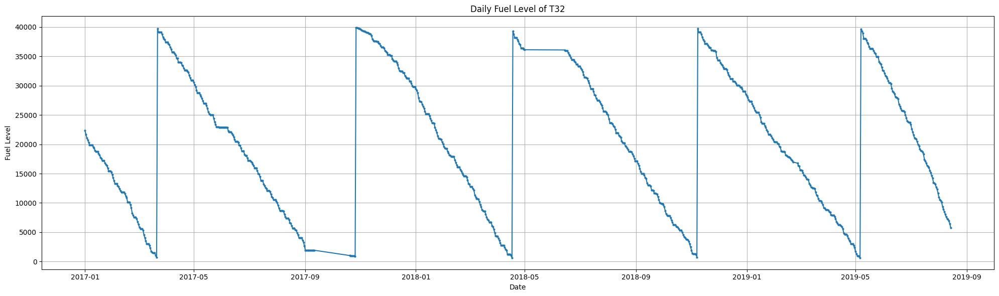

In [300]:
# WARRING: Long Running time!
for t in tank["Tank ID"]:
    if t != "T 13":
        plot_fuel_opt(t)

Our decision to expand fuel tank capacity is based on the following process: when the fuel tank capacity approaches the discount threshold + safety threshold, we consider increasing the tank's capacity to this value. The logic behind this is straightforward, as we aim to secure the maximum discount while ensuring our supply. When considering expansion decisions, we also need to consider the Return on Investment (ROI). Unfortunately, we do not have data on the cost of expanding fuel tanks; hence, we will observe the fueling cycle to make a decision. Generally, more frequent fueling cycles indicate a higher total volume of fueling, and our costs for expanding the fuel tank will be amortized more quickly. Some tanks, like T11 and T12, clearly fit this strategy. Therefore, we will present our tank expansion strategy in a quantitative descriptive manner. However, it is challenging to provide a quantified return on investment (considering the objective conditions, limitations, schedule, and costs related to tank expansion are unclear), so this strategy is presented independently of any purchasing strategy and will not be further integrated with it. We want to clarify that our proposed solutions are based on the medium to long-term ROI (possibly 3-5 years) of the "tank expansion" decision.

In [301]:
tank_expand = tank.copy()

tank_expand.drop(
    ["Best Day", "Consider Holidays", "New Total Cost"], axis=1, inplace=True
)

tank_expand["If Expansion"] = False
tank_expand["Refill Frequency"] = 0
tank_expand["Final Capacity"] = 0

tank_expand.head()

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Regular Threshold,Special Day Threshold,If Expansion,Refill Frequency,Final Capacity
0,T 10,1,1,U,40000,10000,12000,False,0,0
1,T 11,1,2,U,40000,9000,10000,False,0,0
2,T 12,1,3,D,40000,10000,11000,False,0,0
3,T 13,1,4,P,40000,<NA>,<NA>,False,0,0
4,T 14,1,5,U,40000,7500,9000,False,0,0


In [302]:
# WARRING: Long Running time!
# Based on the above logic, manually update the list of fuel tanks requiring expansion.
tank_ids_to_update = [
    "T 10",
    "T 12",
    "T 11",
    "T 14",
    "T 15",
    "T 17",
    "T 18",
    "T 22",
    "T 23",
    "T 24",
    "T 25",
]
tank_expand.loc[tank_expand["Tank ID"].isin(tank_ids_to_update), "If Expansion"] = True

valid_tanks = tank_expand[tank_expand["Tank ID"] != "T 13"]

for tank_id in valid_tanks["Tank ID"]:

    tank_row = tank.loc[tank["Tank ID"] == tank_id]
    tank_type = tank_row["Tank Type"].iloc[0]
    fuel_level = fuel_groups[tank_id]["Fuel Level"].iloc[0]
    tank_capacity = tank_row["Tank Capacity"].iloc[0]
    regular_threshold = tank_row["Regular Threshold"].iloc[0]
    best_day = tank_row["Best Day"].iloc[0]
    special_day_threshold = tank_row["Special Day Threshold"].iloc[0]
    consider_holidays = tank_row["Consider Holidays"].iloc[0]

    df = update_fuel_data(
        daily_fuel_sold(tank_id),
        tank_type,
        fuel_level,
        tank_capacity,
        regular_threshold,
        best_day,
        special_day_threshold,
        consider_holidays,
    )

    # Update Refill frequency
    valid_tanks.loc[valid_tanks["Tank ID"] == tank_id, "Refill Frequency"] = (
        df["Purchase"].ne(0).sum()
    )

    # Update Final Capacity, there are some computational simplifications
    if_expansion = int(
        valid_tanks.loc[valid_tanks["Tank ID"] == tank_id, "If Expansion"]
    )
    valid_tanks.loc[valid_tanks["Tank ID"] == tank_id, "Final Capacity"] = (
        if_expansion * special_day_threshold + tank_capacity
    )

In [303]:
tank_expand.loc[tank_expand["Tank ID"] == "T 13", "Refill Frequency"] = np.nan
tank_expand.loc[tank_expand["Tank ID"] == "T 13", "Final Capacity"] = tank_expand.loc[
    tank_expand["Tank ID"] == "T 13", "Tank Capacity"
]
tank_expand

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity,Regular Threshold,Special Day Threshold,If Expansion,Refill Frequency,Final Capacity
0,T 10,1,1,U,40000,10000,12000,True,0.0,0
1,T 11,1,2,U,40000,9000,10000,True,0.0,0
2,T 12,1,3,D,40000,10000,11000,True,0.0,0
3,T 13,1,4,P,40000,<NA>,<NA>,False,NaN,40000
4,T 14,1,5,U,40000,7500,9000,True,0.0,0
5,T 15,1,6,D,40000,10000,11000,True,0.0,0
6,T 16,2,1,U,70000,3300,3300,False,0.0,0
7,T 17,2,2,D,40000,6000,7000,True,0.0,0
8,T 18,2,3,U,40000,3500,4000,True,0.0,0
9,T 19,2,4,D,70000,5500,6000,False,0.0,0


<!--
*.........................^...............................................................................................=. ..*..     ,]ooOOOOOOOOOOO[`......,^.
*.........................^...............................................................................................=...    .]/oOOOOOOooooo[`............^.
*.........................*...............................................................................................=   .***,OOOOoooo/[[**...............]`
^*........................@\`.............................................................................................=^*....**oOOOOo*......***......,]]oOoO`
^**.....................**@@@@@\`**........................................................................................^**...**OOOOo*............,].....*[...
^*****.................**=@@@@@@@@@\`**[\`...............................................................................*.O=\*****=OOoo,.... .,]/../OO/[..,]OOO/
^**************...*******=@@@@@@@@@@@@@\`**[\`...........................................................................*.O.*[\[ooOO/`.  .,oooo..,..,]OOOO^/OOOO
^************************=@@@@@@@@@@@@@@@@@\`**[\`......................................................................***=.**.....]../OO]*. ..,/ooooOOOOOoooo`\
^************************=@@@@@@@@@@@@@@@@@@@@@\`**`*.,[,[[.............................................................***=  ..*=/`.,[. .,]oOOOOOO`..,ooOOoooO\/
^************************=@@@@@@@@@@@@@@@@@@@@@@@@@\`**[\]..,]..........................................................***=^...    ,]OOooOoOo/oooo^**,oo/OOOOOOO
^************************=@@@@@@@@@@@@@@@@@@@@@@@@@@@@@\`**[**.,\.`...\\]`.............................................****=^  ,]oooO@OOOo`*=ooOOOoooOOOOOOOOO@@@
^************************=@@@@@@@@@@@@@@@@@@@@@@@@@@OOOOooOO]****]..,[[[..[,*`.........................................*****O/ooooooO@@OOooooOOOOOOOOOO@@@@@@@@@@
^************************@@@@@@@@@@@@@@@@@@OoooOOOOOOOOOOOOOOO@@\`*,\`......,...,[`...................................******OOOoooooO@@OOOOOOOOOOOO@@@@@@OO@OO@@@
^************************@@@@@@@@@@@@OooOOOOOOOOOOOOOOOOOOOOOOOOO@@@\]**,[O@@\]`......**..............................******O,OOOOOOO@@@OOOO@@OO@@@@@@@@@@OOO/[[.
^************************@@@@@@@@OooOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO@@O]***]`..,[O]........................,`........*****=o\*ooooO@@@OOOOOO@O@@@@@O[`..*]]`*o]
^************************@@@@@ooOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO@@O\],[**,\`@@].,\]...................[\`.....****=^******OO@@OOOO/[`....*..*****...*[`
^************************@@OoOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO@OOOOOOOOOOOO@@OO],`***[\\ *.,\\`..................,\].****=^******,[[`.. ...****......*.....,]O
^************************OoOO@OOOO[[[[[[[[[[[[[OOOOOO@@OOOOOOOOOOO@OOOOOOOOOO@OOO@@@@O\*]]*\\/^.***.. ,].,]...*.........,\]*=^..   ..`..]^**...........]]oOOOOOOO
^************************^..,......   . .........=.......    .[[\OO@OOOOOoOOOO@OOOOOOoO@@@@@OOO]/[\\]`[O@O@`..[\\]`.]....**.,\`..**...,[`.. ..,]]ooOOOOOOOOOOOOOO
^***********************=^.,....=....... /      .O....`.         .. \.,[\ooOOOO@@OOOOOoOOOOOOO@O@@@OOO]]**...*****..,\/[O\`.****,\` ..]]OOOOOOOOOOOOOOOOOOOOOOO@@
^***********************=^,`....`       =`..   .=O^...^             .O.  .  ,[OO@@OOOOOOOOOOOOOOOo@@@@@@@@@OO]/[\]]*,\\],\]...******,\@OOOOOOOOOOOOO@@@@@@@@@@@OO
^***********************=`^  . /       ,O ..    /O^.  ^ ,.           =O..   . ...O@OOOOOOOOOOOOOOOo@@@@@@@@@@@/O@@O\]/[\]],[O\]..]`.****,\@@@@@@@@@@@@@OOO@@@@@@@
^***********************=^   .,...  .. O^ ..  ..OO^.. =  ^          ..OO..     . =o^ .[OOOOOOOOOOOOo@@@@@@@@@@^*****[[O@@O\]/[O\]..**,[\\]**,\@@O@@@@@@@@OOOOOOOO
^***********************=.    `     ..=O^    ..=OO\ ...` ,            Oo\ .     .=Oo^... ,\OOO@OOOOo@@@@@@@@@@^*****..*****,[\@@O\]/*********..*,\@OOOOOOOOooooOo
^***********************=.....`..  ...OO^..  . /oOO... , .`        .. \OO\     ...Oo\`...   .[@@OOOOO@@@@@@@@@^*****..*******,\o\]/[O@@OO]`*,[O\]`**/\Ooooooooooo
^***********************=....=.......=oO^......Oooo^.. .` ,        .. ==oo^ ....,[/OOO]]]`   .,@@OOOo@@@@@@@@@^*****......****O\ooooooOOOOOO@@OO]`*[[O\]/[O/\oooo
^***********************=... = ......Ooo^   ..,OoooO].` ,..^       .. o=oo=`.   ..^**,^.     ..@@`,Oo@@@@@@@@@^*****......****O=ooooooOOOOOOOoOooOO@@OO]]*[[/\O/[
^***********************o... . .....=oo/^ ....=\O/\/^   .,.,`        ./****\    .=^***\.     .,@@@ . \@@@@@@@@^*****......****O/ooooooOOOOOooooooo/[[[*.,[\@OO]o`
^***********************o... = .... o=o\\ .][.==[**,=.   =,`,.      .,^****,^    =****,^     .=@@@^  /@@@@@@@@^****.......****=ooooo[[[[[`......]]]OOO[*/OOO\/[O@
^***********************o....=.....,\O/[=^... /******\.   ` \,`      =******O]]]]OO[**.\    . @@@@@  @@@@@@@@@^****.......****=....]]/O/.,OO\`*\OOOO`]O@@@OOOOOo*
^***********************^.....`....=`****\... o*******\....` ,``   .,^***..*=^]]/@@@@@@O..   =O@@@@ =@@@@@@@@@\*****......****=^..[OO`./OOOO[[[`....]]]OOO@@@@@@@
^***********************^.... ` .. =******\ ..^***]]O/`=`. ,`  .\`. /...@@@@@@@@@@`   .=`...,...@@@ @@@@@@@@@@@****.......****,^....,]]]/OO@@@@@@@@@@@@@@@@@@@@@@
^***********************^.....=....^*****,]\[[/**.*]]@@@/^ .,.     =.....=@@@@`@@@^   ..^..,^ ..@@@@@@@@@@@@@@@******.....*****@OOOOOO@@@@@@@@@@@@@@@@@@@@@@@@@@@
^^**********************^..... ` ..^******]]@@@@@@@@@@[[`.,` ,... =......=@@@@@@@@^   ..^ =O`...@@@@@@@@@@@@@@@******.....*****OOOOOOO@@@@@@@@@@@@@@@@@@@@@@OOOOO
^^**********************^.......`..^../@@@@@@@@@@@@^   .....,\,` =*......=@/.....\^   ..\OOO....@@@@@@@@@@@@@@@******.....*****OOOOOOOO@@@@@@OOOOOOOOOOOOOOOOOOOO
^^*********************=^.......,.=^....\@@@@@@@@@@^   ........[O.*...*...=`.   ./   ....@O^....@@@@@@@@@@@@@@@*****..*********=@OOOOOO@@@@@@OOOOOOOOOOOOOOOOOOOO
^oooo^****`O^**********=^........==.....=@@@/`...[@^   .....................,`*......... =O.....@@@@@@@@@@@@@@@****************=@@OOOOO@@@@@@@OOOOOOOOOOOOOOOOOOO
oooooooo\o^O^^********==^.........^......=@^......,   .........                 ...       ^ ....@@@@@@@@@@@@@@@****************=@@@OOOO@@@@@@@OOOOOOOOOOOOOOOOOOO
oooooooooo\@\oo,]]]]`/o=^.........^.......,@`    ` ........                                .....@@@@@@@@@@@@@@@*****************@@OOOOOOOOOOOOO@@@@@@@@@@@@@@@@@@
Ooooooooooo@ooooooooooo=.......... ....................                                    ,....@@@@@@@@@@@@@@@***=`************OOOOOOOO@@@@@@@@@@@@@@@@@@@@@@@@@
Ooooooooooooooooooooooo=..........`   .............                                        `....@@@@@@@@@@@@@@@^***=^**********`O/ooOOOOOOOO@@@@@@@@@@@@@@@@@@@@@
OOOOOoooooOOoooooooooooO..........^                                                      ,`.....@@@@@@@@@@@@@@@o^***O*********,o@@@@@@@@OOOO@@@@@@@@@@@@@@@@@@@@@
OOOOOOOOOOOOoooooooooooO..........*                                                    ,`.......=@@@@@@@@@@@@@@oo***\^*******/ooO@@@@@@OO@OO@@@@@@@@@@@@@@@@@@@@@
OOOOOOOOOOOOOOOOOOOOOOOO.........,,]@@\                                              ]@^........,@@@@@@@@@@@@@@ooooo/^`**,ooooooOOOOOOOOOOOOO@@@@@@@@@@@@@@@@@@@@
OOOOOOOOOO@OOOOOOOOOOOOO........=@..,`     \                                      ]@@@@^.........,@@@@@@@@@@@@@OooooOoooooooooooOOOO@@@@OOOOO@@@@@@@@@@@@@@@@@@@@



 _ _ ____                  __    _    __  __            ____             __   ___ _ 
( | ) __ )____  __________/ /_  (_)  / /_/ /_  ___     / __ \____  _____/ /__/ ( | )
|/|/ __  / __ \/ ___/ ___/ __ \/ /  / __/ __ \/ _ \   / /_/ / __ \/ ___/ //_/ /|/|/ 
  / /_/ / /_/ / /__/ /__/ / / / /  / /_/ / / /  __/  / _, _/ /_/ / /__/ ,< /_/      
 /_____/\____/\___/\___/_/ /_/_/   \__/_/ /_/\___/  /_/ |_|\____/\___/_/|_(_)       
-->